<a href="https://colab.research.google.com/github/d-sanjukta/Lyrics-Generator/blob/main/4_Lyrics_Generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## <b>4. <u>LYRICS GENERATIONS</b></u>

* In this section, we will be generating five lyrics for each genre, including **country, rock, pop, rhythms & blues and rap**. Additionally, we will generate five lyrics for each artist-specific model that has been fine-tuned on their respective pre-trained genre models. This process aims to showcase the creative output and stylistic variations across different genres and artists.

* Additionally, to facilitate result comparison, we have utilized five different prompts for each genre-based model. These same prompts have also been used for the five artists within each particular genre. This approach allows us to assess and analyze the variations and differences in the generated lyrics across different models and artists while maintaining a consistent framework for evaluation.


________________________________________________________________________

In [ ]:
# Import the necessary libraries
# !pip install transformers

import pickle
import numpy as np
import pandas as pd

import re
import string
import tensorflow as tf
import keras

from google.colab import drive
drive.mount('/content/drive')

from transformers import TFAutoModelForCausalLM, AutoTokenizer

In [ ]:
# Load the pre-trained GPT-2 tokenizer
tokenizer = AutoTokenizer.from_pretrained("gpt2")


In [ ]:
# Based on the EDA, the top popular artists from each genre:
genre_artist = {
    'Country' : ['Luke_Combs', 'Johnny_Cash', 'John_Denver', 'Dolly_Parton', 'Morgan_Wallen'],
    'RB'      : ['The_Weekend','Chris_Brown','Dua_Lipa','Ed_Sheeran','Justin_Bieber'],
    'Rock'    : ['Queen', 'The_Beatles', 'Pink_Floyd', 'Maroon5', 'Cold_Play'],
    'Misc'    : ['Scott_Cawthon','Emily_Dickinson', 'Robert_Burns'],
    'Pop'     : ['Taylor_Swift',  'Ariana_Grande', 'Rihanna', 'Ed_Sheeran', 'Lana_Del_Rey'],
    'Rap'     : ['Drake', 'Eminem', 'Kanye_West', 'Kendrick_Lamar', 'Nicki_Minaj']}

### Functions

In [ ]:
## Getting Prediction from trained Model:

'''
Input : input prompt, model and its tokenizer
Output : Predicted Lyrics
'''

def get_predictions (prompts,model, tokenizer,
                     max_length = 250,
                     num_beams = 1,
                     temperature = 0.6,
                     no_repeat_ngram_size=3,
                     num_return_sequences=1 ):
  generations = []
  for prompt in prompts:

    prompt = prompt.lstrip().rstrip()
    # encoding the input text
    input_ids = tokenizer([prompt])

    # Getting output:
    beam_output = model.generate(   input_ids['input_ids'],
                                    max_length = max_length,
                                    num_beams = num_beams,
                                    temperature = temperature,
                                    no_repeat_ngram_size=no_repeat_ngram_size,
                                    num_return_sequences=num_return_sequences
                                  )
    # decoding the output tokens
    output_sequences = [tokenizer.decode(seq, clean_up_tokenization_spaces=True) for seq in beam_output]

    # saving our predicted lyrics in a list
    generations.append(output_sequences[0])

  # Return the generated lyrics
  return generations

In [ ]:
def post_processing(lyrics):
    lines = lyrics.split("\n")
    processed_lyrics = []
    current_line = ""

    for line in lines:
        words = ' '.join([word for word in line.split() if "<" not in word])
        if len(words.split()) == 1:
            current_line += " " + words
        else:
            if current_line:
                processed_lyrics.append(current_line.strip())
                current_line = ""
            processed_lyrics.append(words)

    # Check if the last line is a single-word line
    if current_line:
        processed_lyrics.append(current_line.strip())

    # Remove empty lines from the processed lyrics
    processed_lyrics = [line for line in processed_lyrics if line]

    for i in range(0 , len(processed_lyrics)-1):
      if len(processed_lyrics[i].split(' ')) ==1:
        processed_lyrics[i] = (processed_lyrics[i]+',' + processed_lyrics[i+1])

    return '\n'.join(processed_lyrics)

In [ ]:
# Function to display the generated song

# REFERENCE : https://github.com/meraxes-99/Lyrics_Generation/blob/main/Lyrics%20Generation%20using%20Language%20Models.ipynb

import matplotlib.pyplot as plt
import matplotlib

def displaySong(song, prompt):
    # Limit the number of lines to display
    song_lines = song.split('\n')[:25]
    song = 'START!\n'+ ('\n'.join(song_lines)) + '\nEND.'

    # Create the figure and axes
    fig, ax = plt.subplots(figsize=(10, 8))
    plt.subplots_adjust(wspace=0.3)

    # Set the background color
    fig.patch.set_facecolor('#2b2b2b')
    ax.set_facecolor('#2b2b2b')

    # Hide the axes and spines
    ax.axis('off')
    for spine in ax.spines.values():
        spine.set_visible(False)

    # Set the text box properties
    text_box = ax.text(0.5, 0.5, song,
                       fontsize=11, c='w',
                       ha='center', va='center', linespacing=1.5,
                       bbox=dict(facecolor='gray', alpha=0.5, boxstyle='round,pad=0.5', linewidth=3, edgecolor='r'))

    # Set the title properties
    fig.suptitle(f'Prompt: {prompt}', x=0.5, y=0.9, ha='center', va='center', fontsize=15, fontweight='bold', color='white')

    plt.show()



### GENRE : COUNTRY

Lyrics Generation for Genre : Country



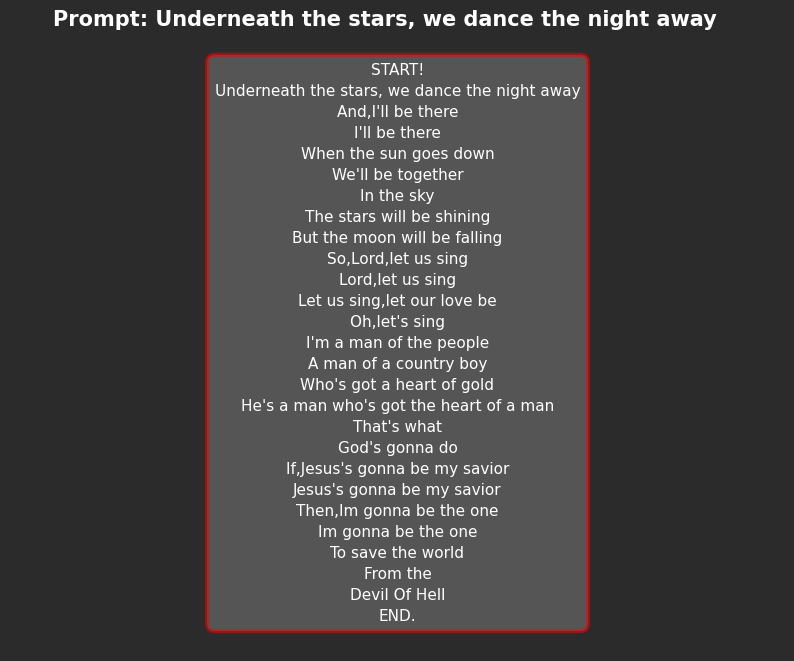

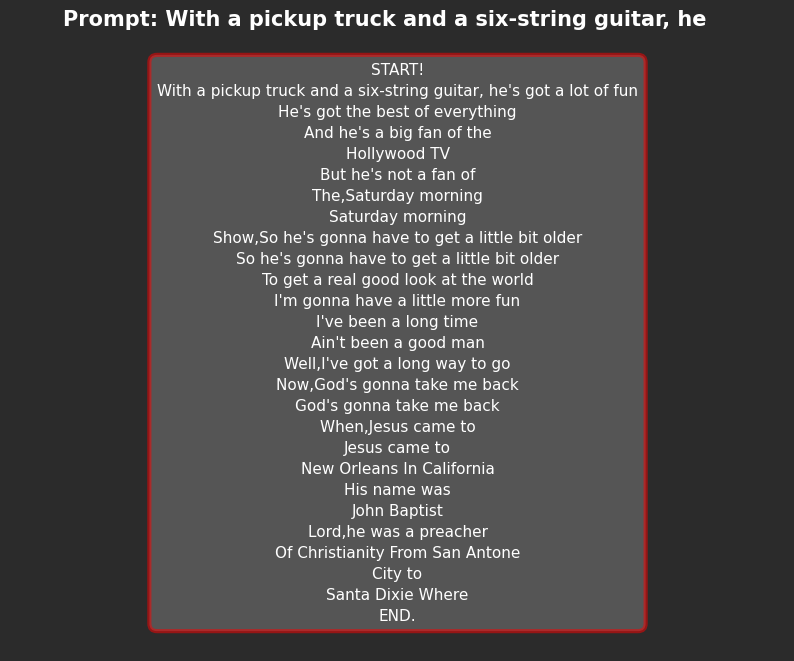

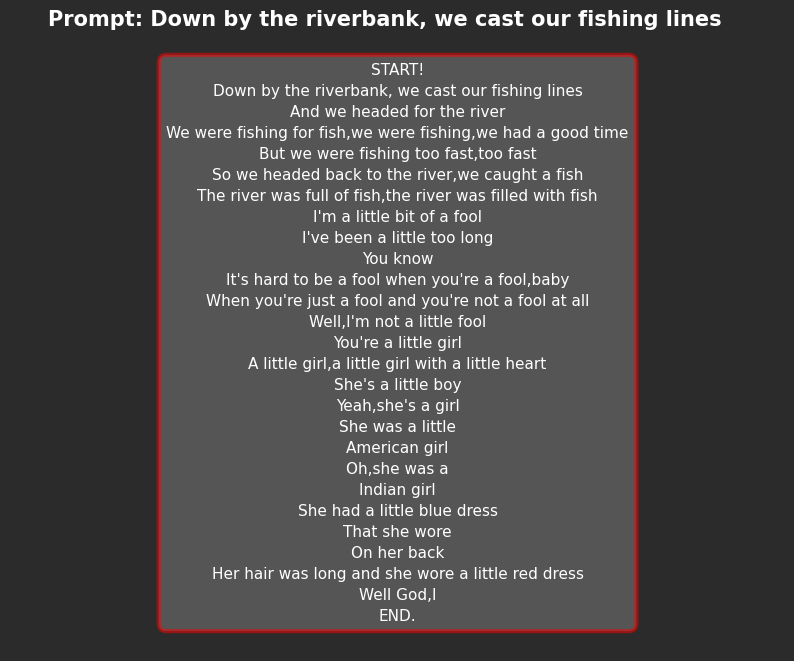

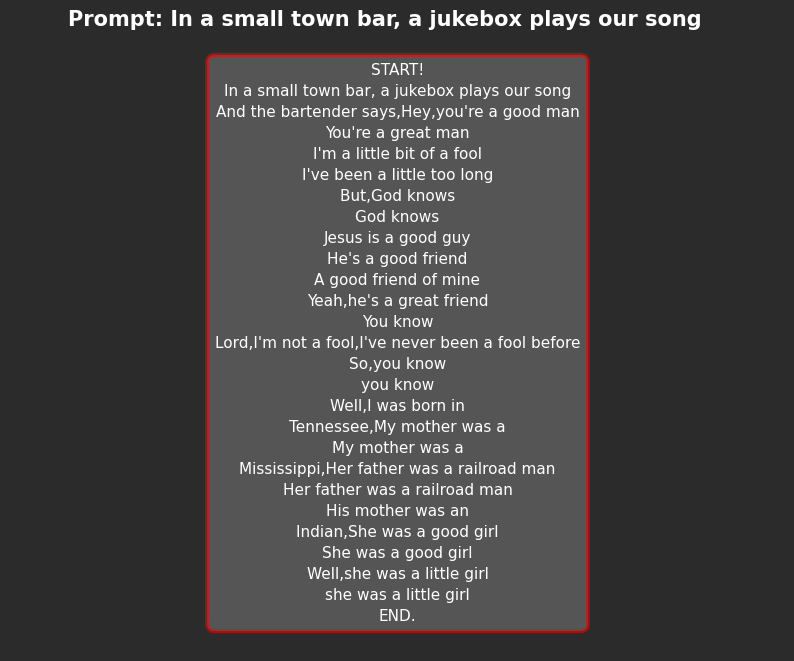

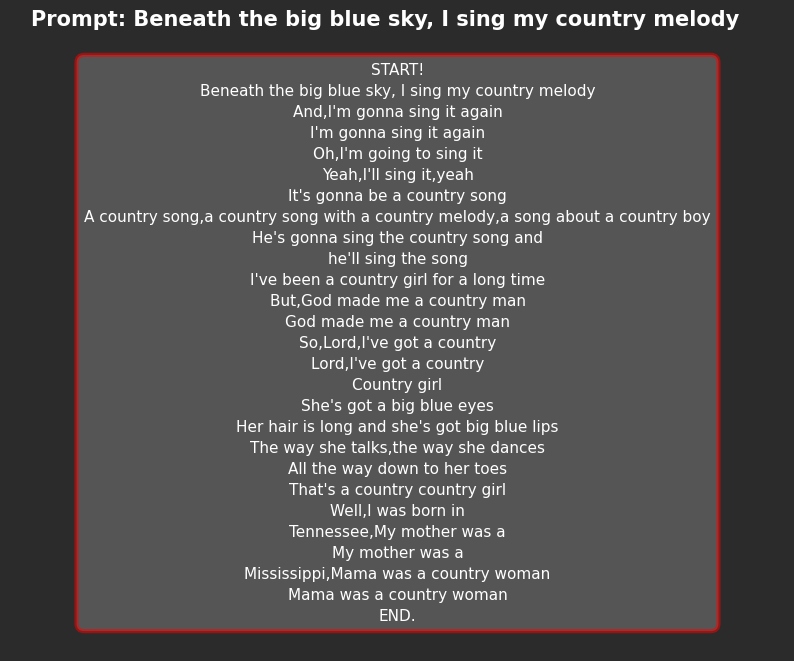

[None, None, None, None, None]

In [ ]:
prompts = [
    "Underneath the stars, we dance the night away",
    "With a pickup truck and a six-string guitar, he",
    "Down by the riverbank, we cast our fishing lines",
    "In a small town bar, a jukebox plays our song",
    "Beneath the big blue sky, I sing my country melody"
]

genre = 'Country'

# Getting the saved trained model weights for genre 'Country'
model = TFAutoModelForCausalLM.from_pretrained("gpt2", max_length=512)
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Genre Models/{genre}_model_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]

# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

#### ARTIST SPECIFIC LYRIC GENERATION

In [ ]:
prompts = [
    "Underneath the stars, we dance the night away",
    "With a pickup truck and a six-string guitar, he",
    "Down by the riverbank, we cast our fishing lines",
    "In a small town bar, a jukebox plays our song",
    "Beneath the big blue sky, I sing my country melody"
]

In [ ]:

model = TFAutoModelForCausalLM.from_pretrained("gpt2", max_length=512)

##### Artist : Luke_Combs

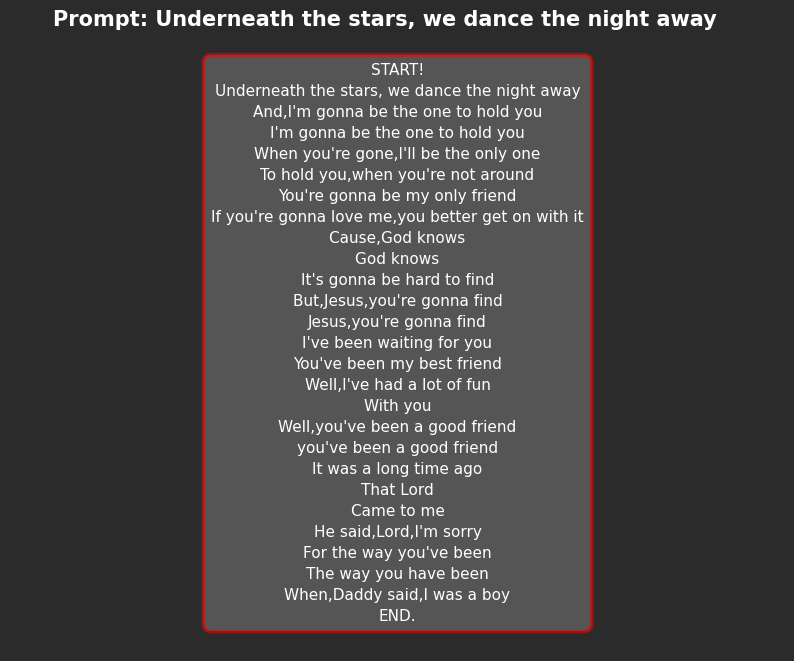

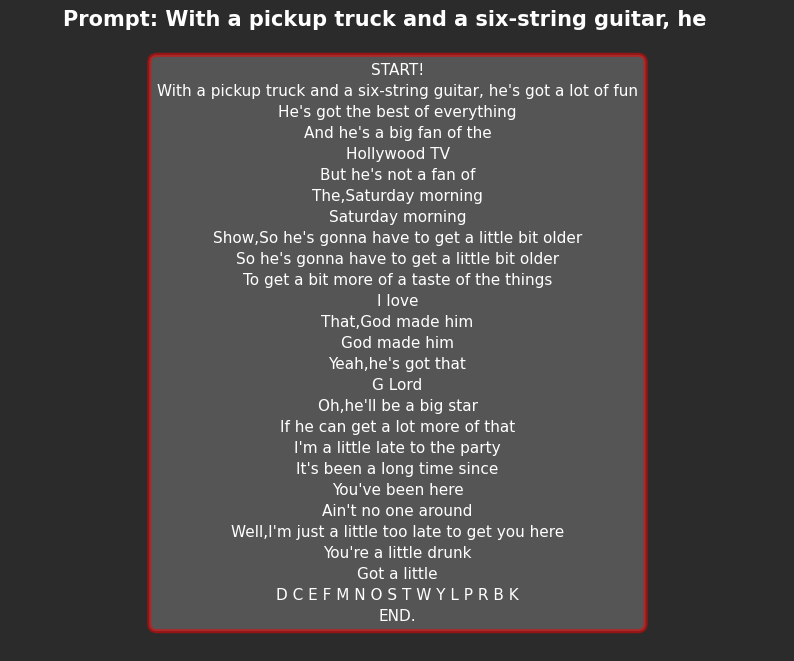

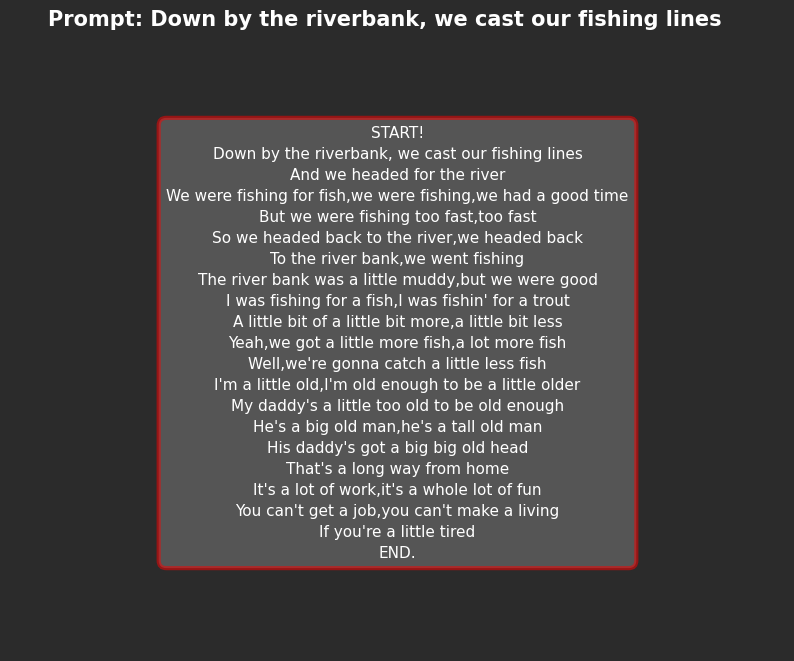

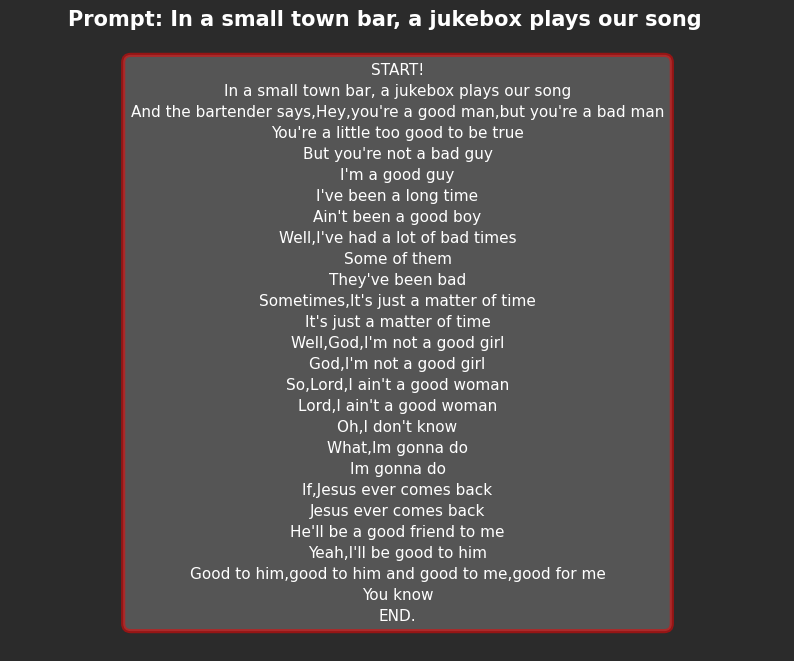

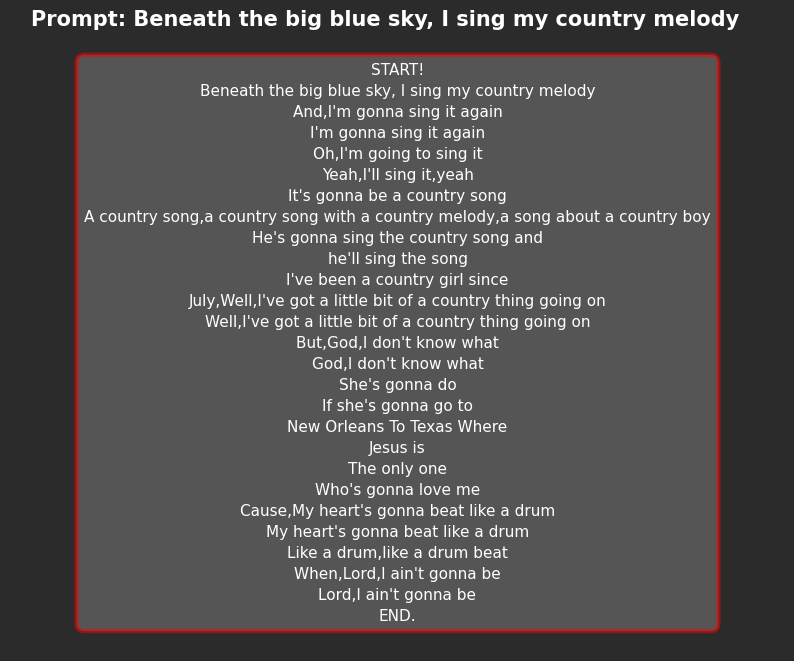

[None, None, None, None, None]

In [ ]:
genre = 'Country'
artist = 'Luke_Combs'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]

# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Johnny_Cash

In [ ]:
genre = 'Country'
artist = 'Johnny_Cash'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


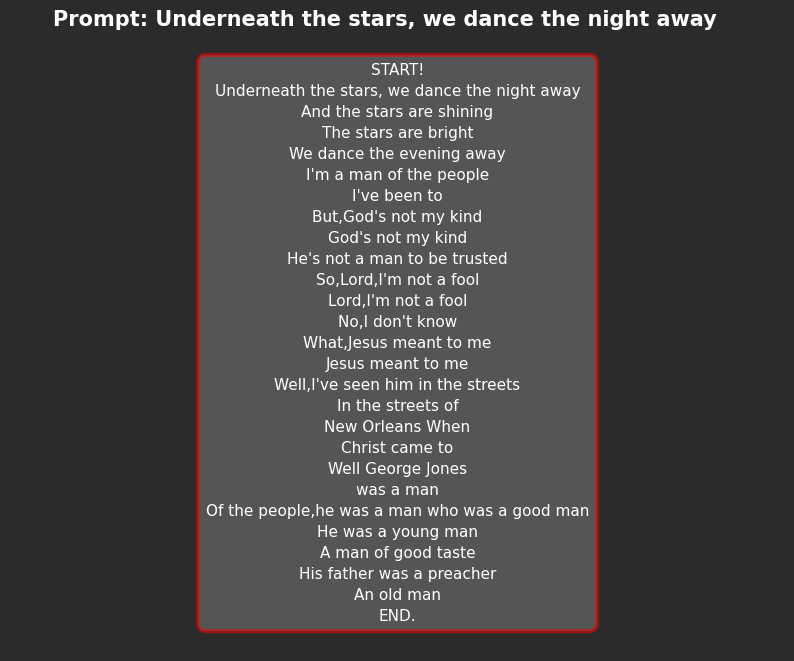

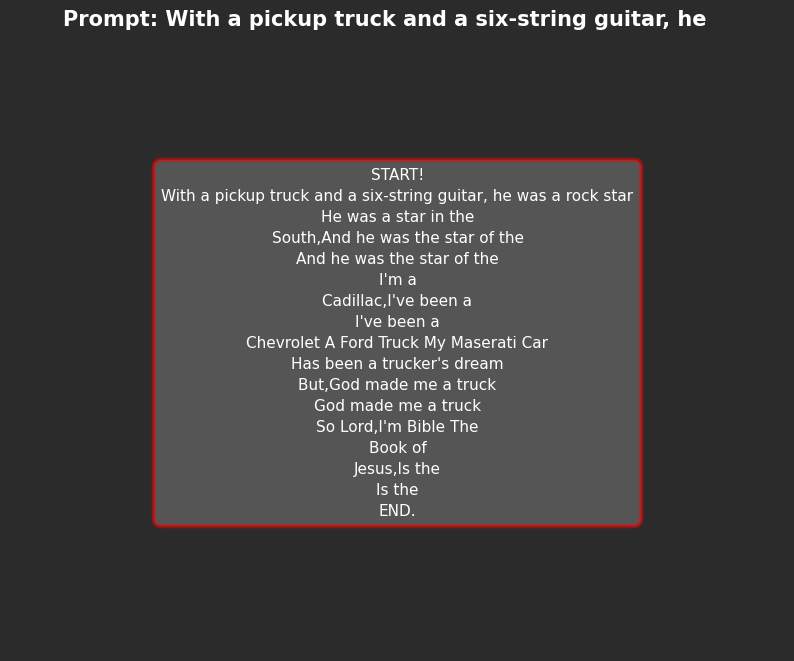

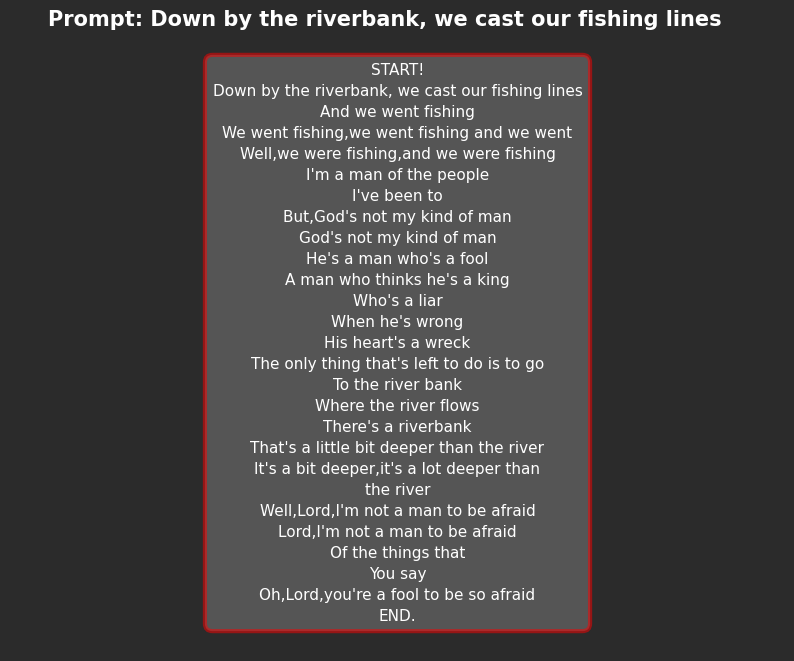

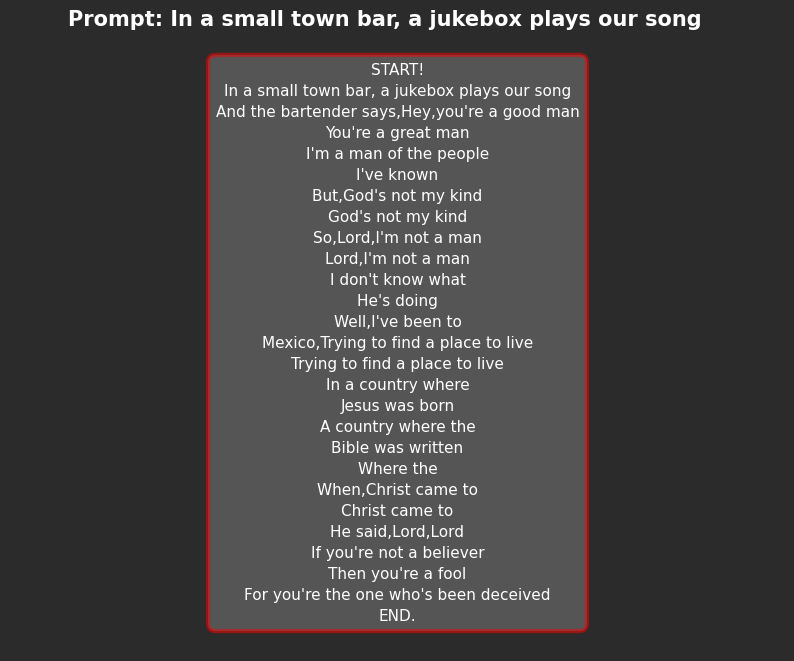

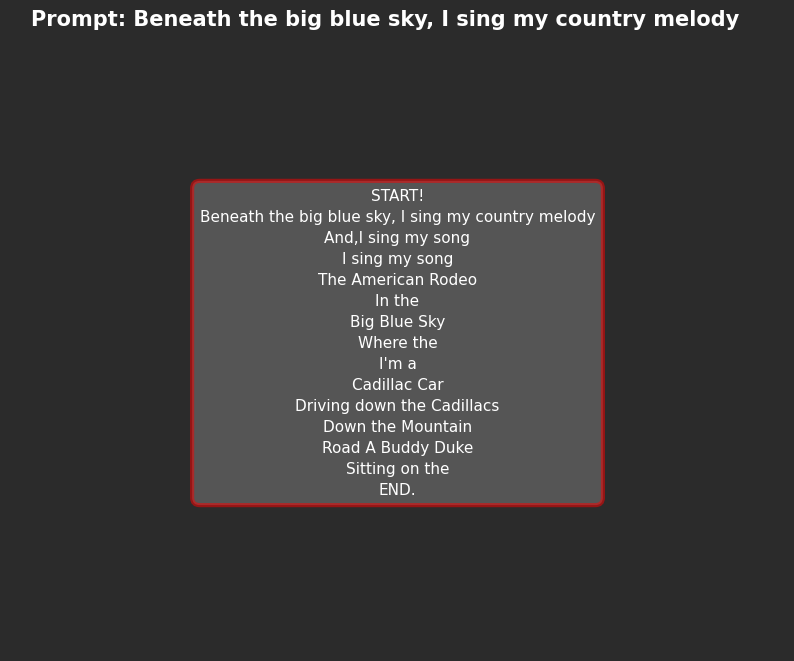

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : John_Denver

In [ ]:
genre = 'Country'
artist = 'John_Denver'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


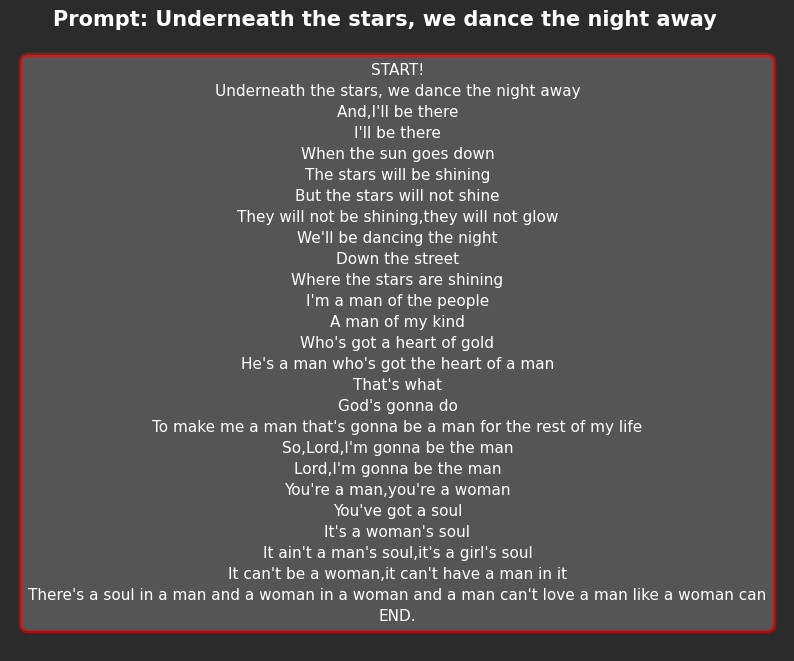

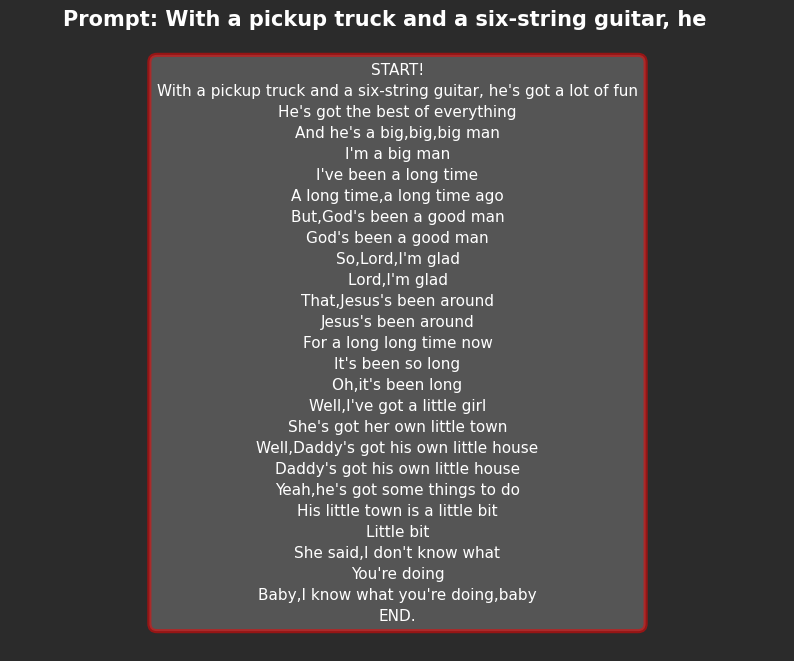

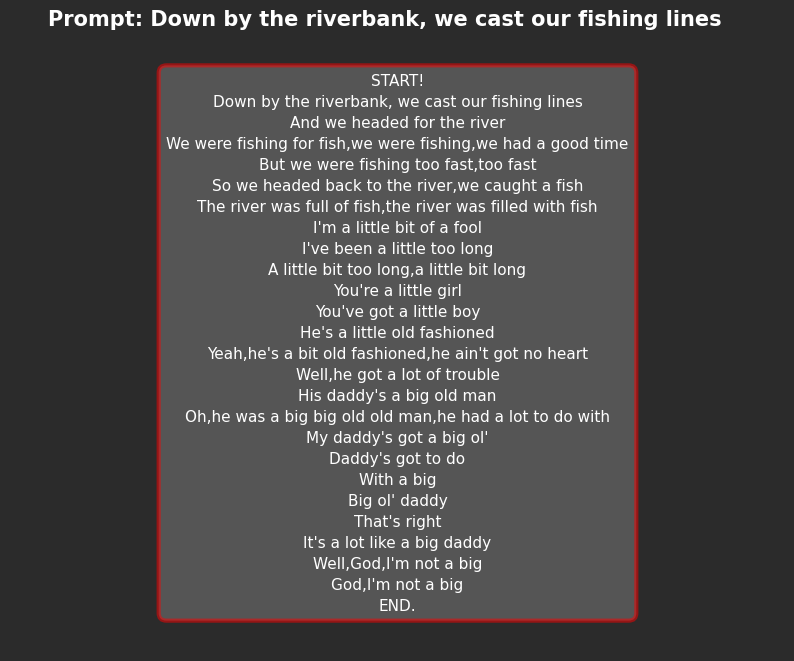

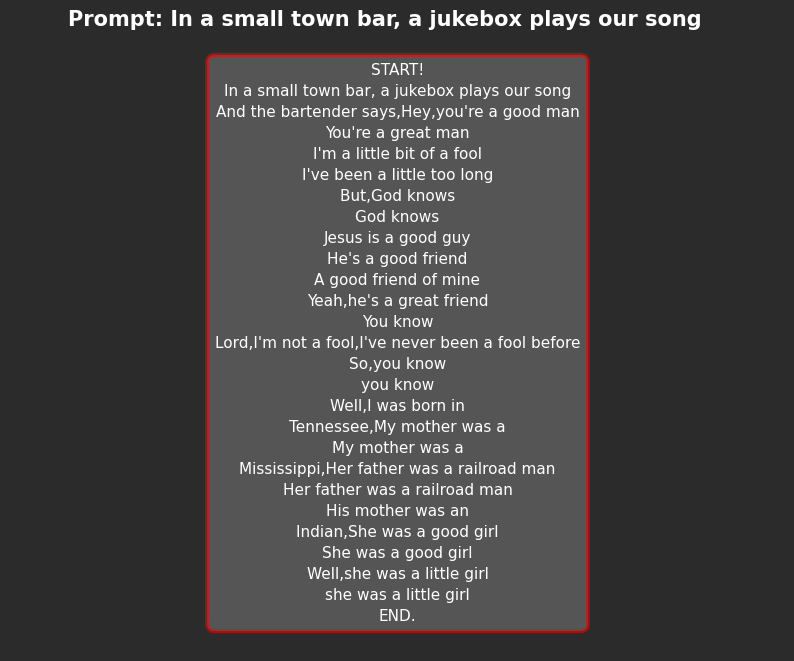

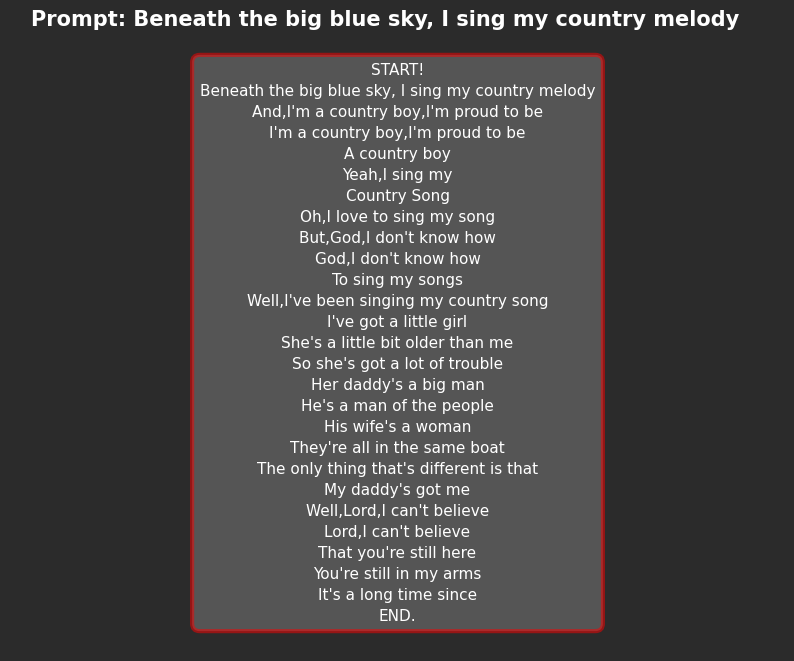

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Dolly_Parton

In [ ]:
genre = 'Country'
artist = 'Dolly_Parton'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


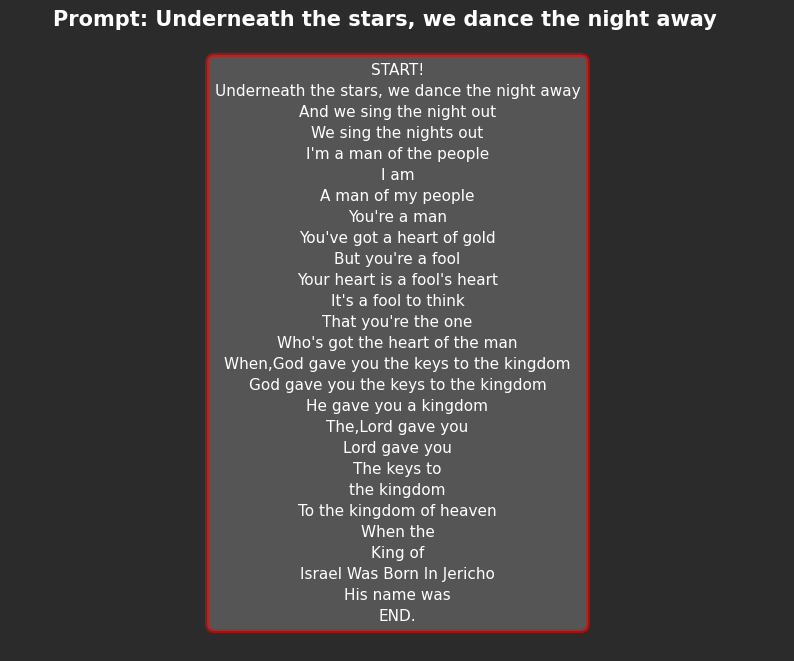

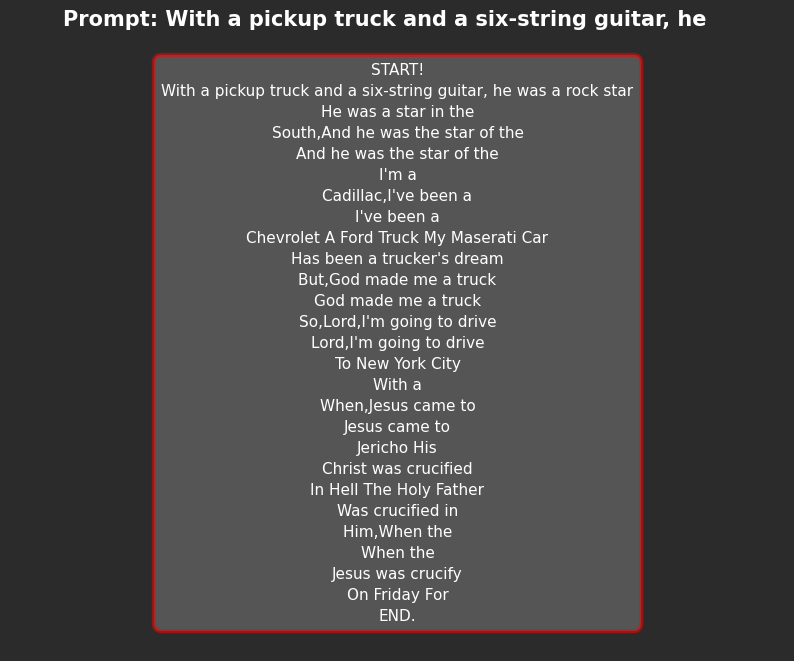

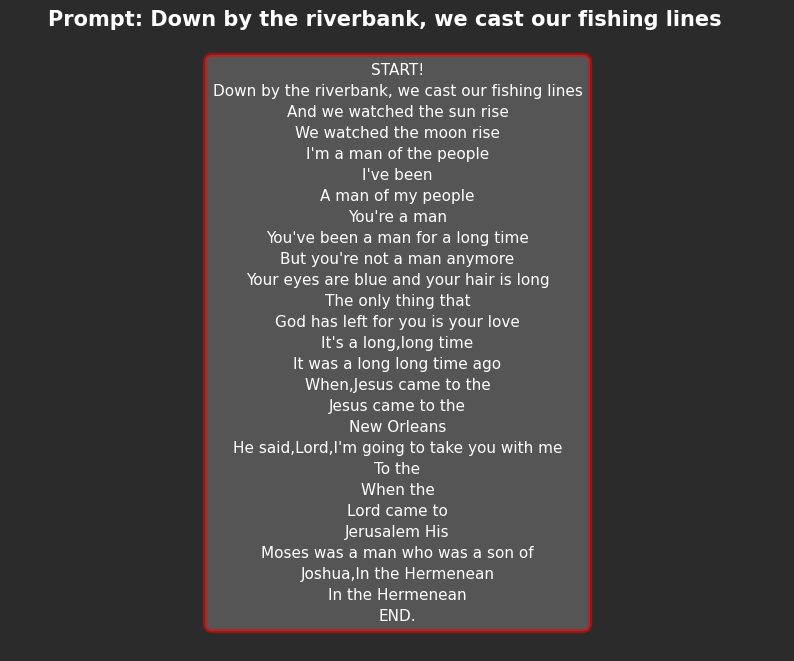

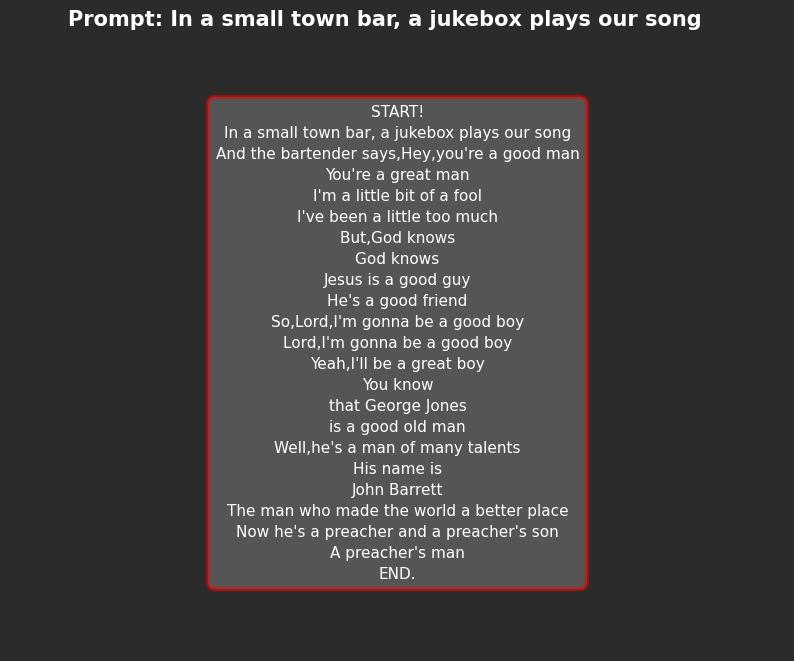

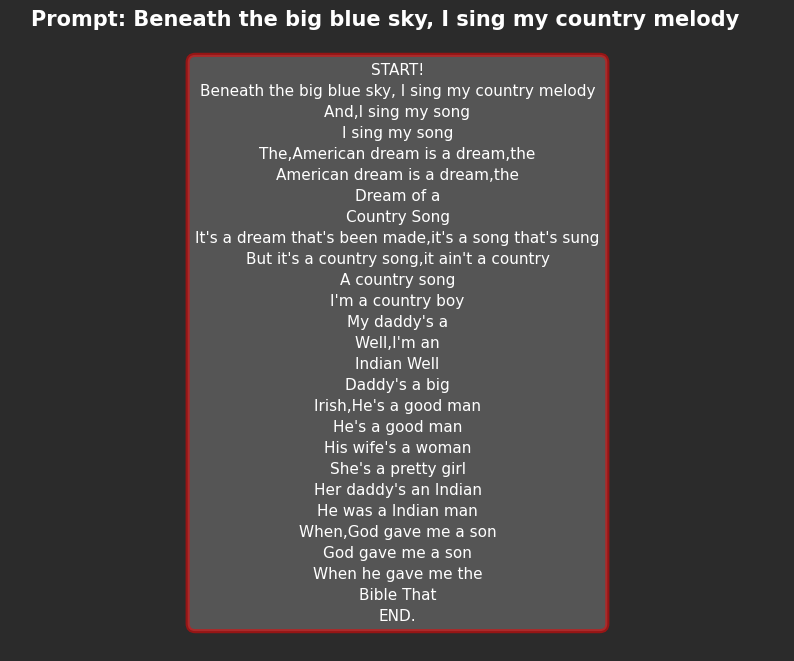

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Morgan_Wallen

In [ ]:
genre = 'Country'
artist = 'Morgan_Wallen'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


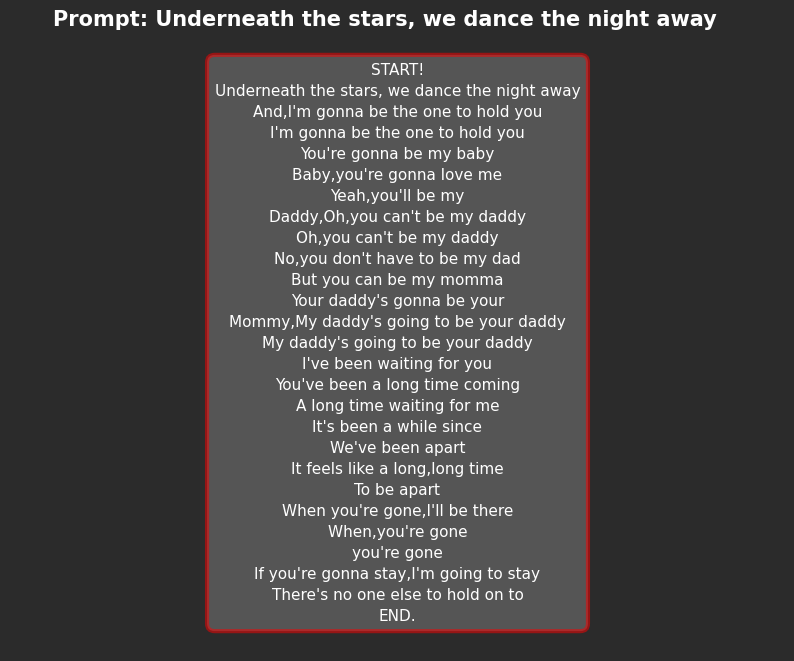

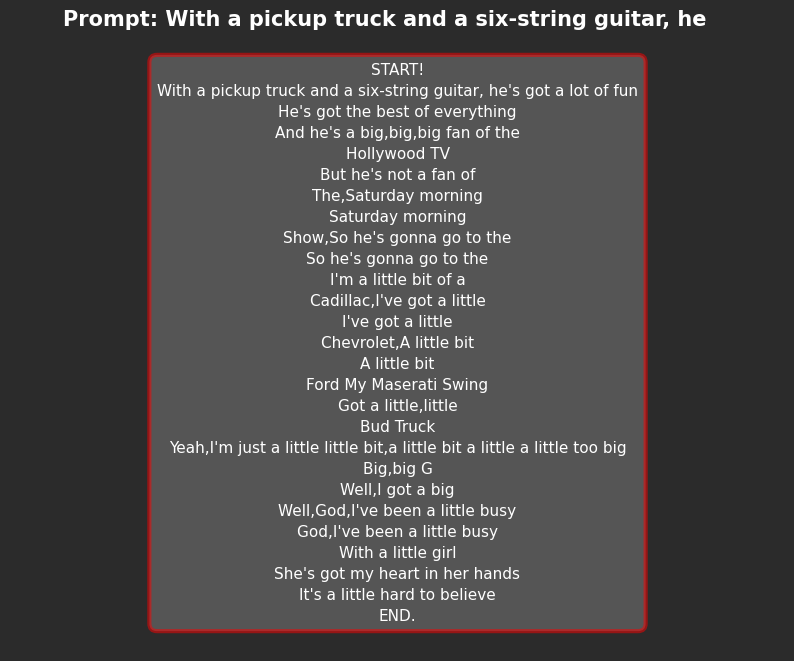

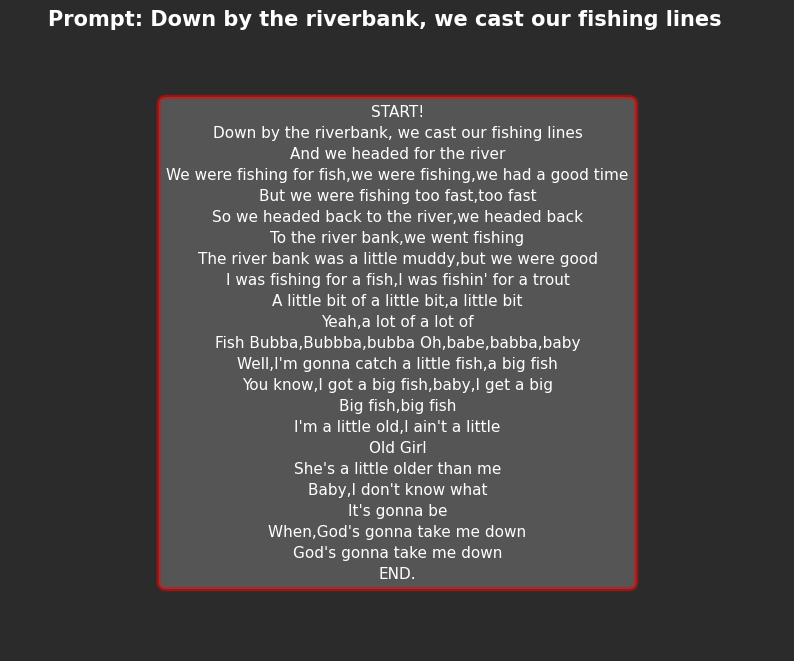

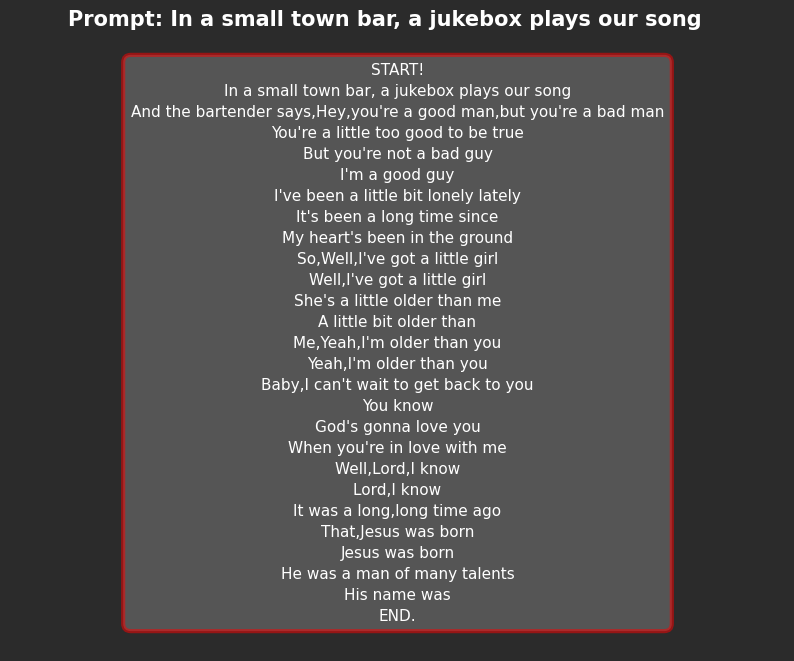

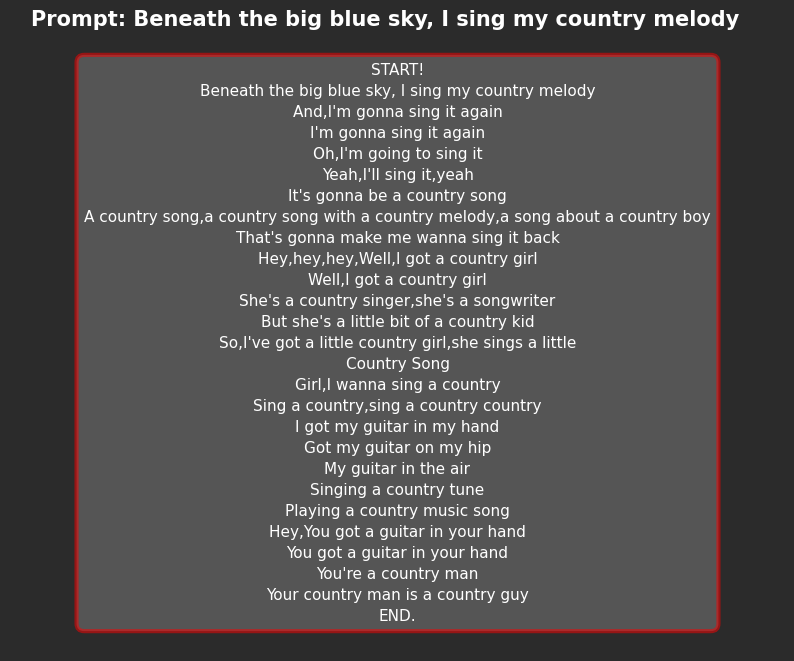

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

### GENRE : ROCK

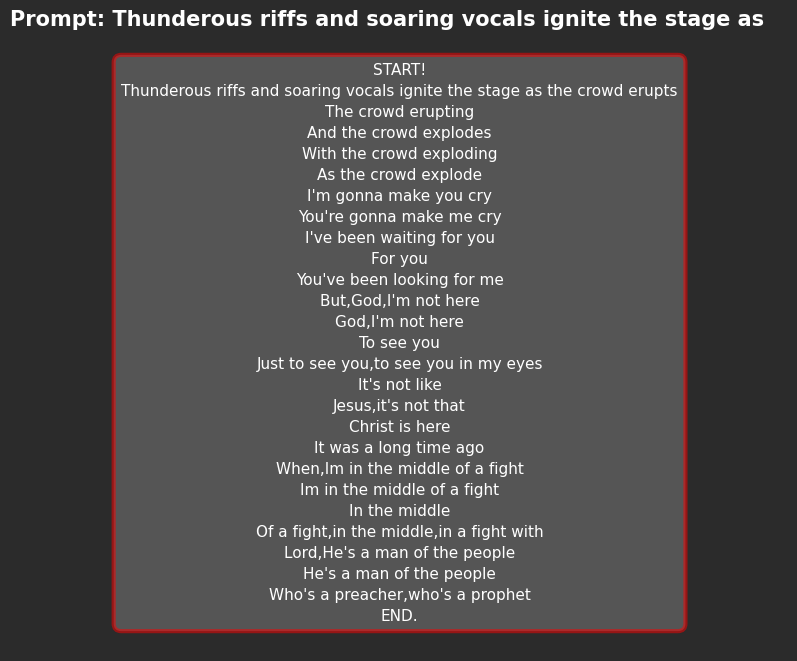

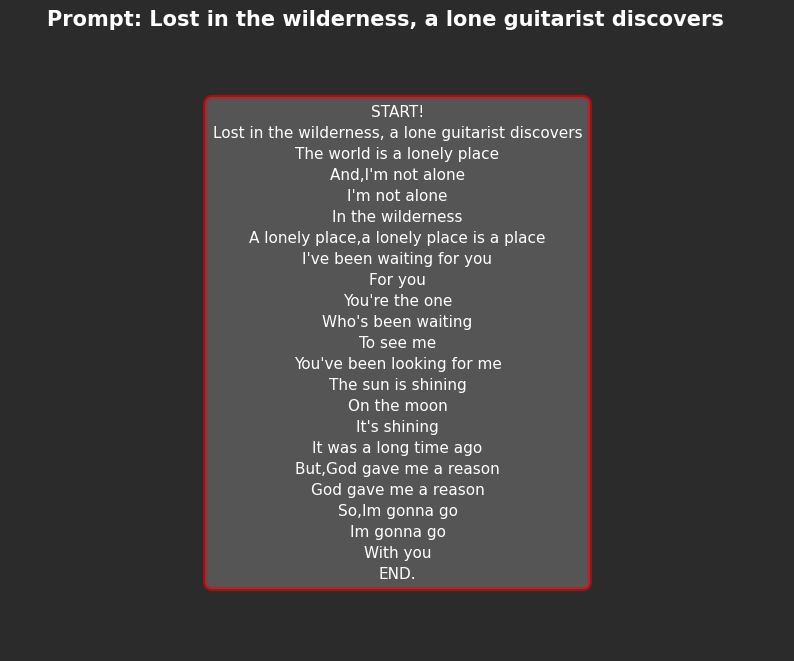

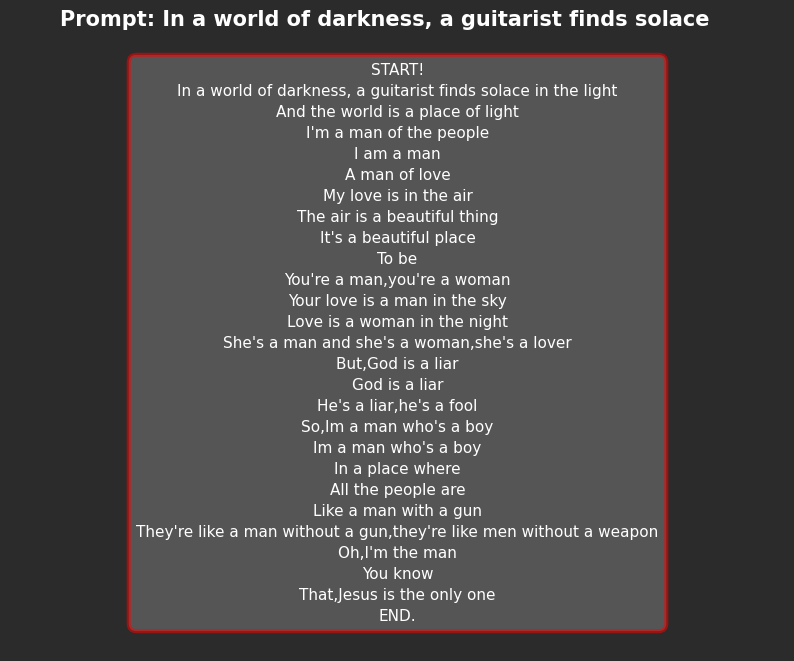

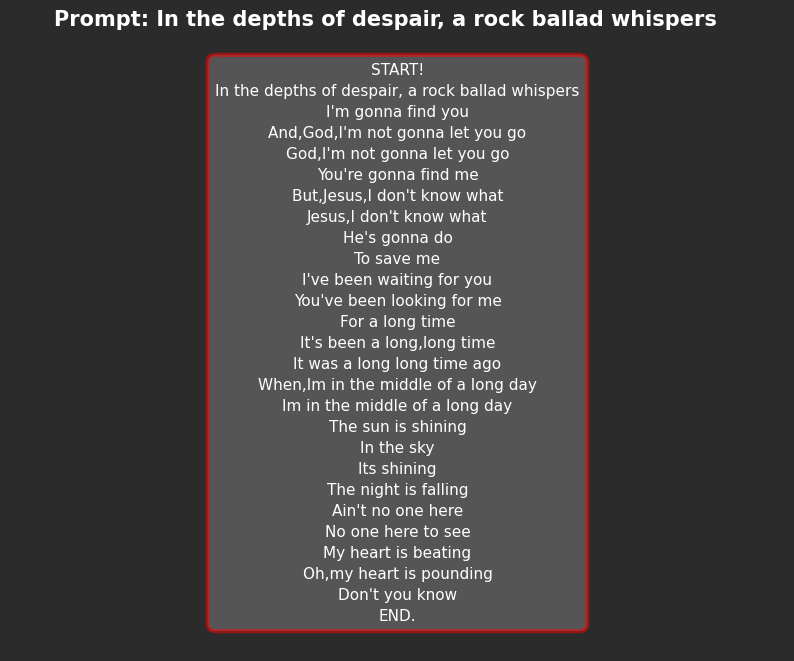

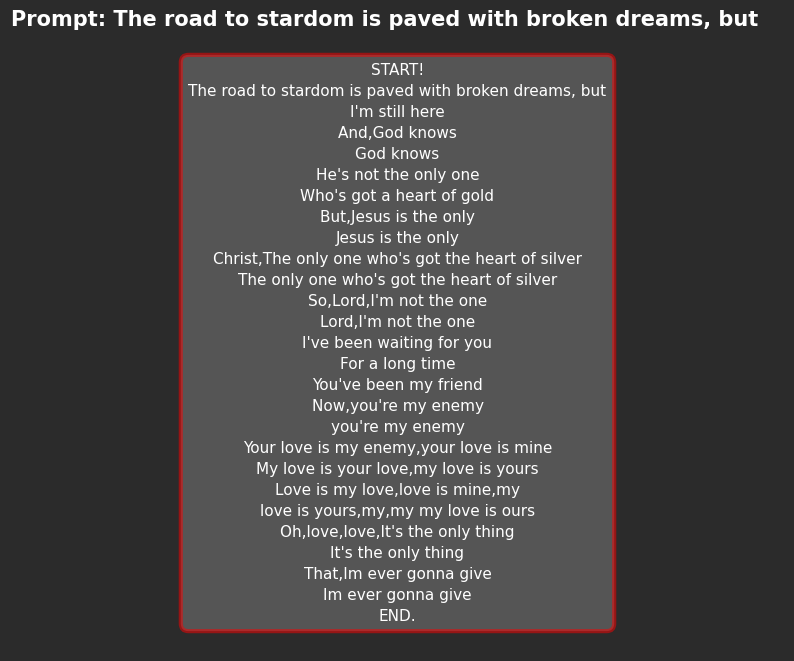

[None, None, None, None, None]

In [ ]:
prompts = [
    "Thunderous riffs and soaring vocals ignite the stage as",
    "Lost in the wilderness, a lone guitarist discovers",
    "In a world of darkness, a guitarist finds solace",
    "In the depths of despair, a rock ballad whispers",
    "The road to stardom is paved with broken dreams, but"
]

# genre = 'Rock'

# # Getting the saved trained model weights for genre 'Country'
# model = TFAutoModelForCausalLM.from_pretrained("gpt2", max_length=512)
# path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Genre Models/{genre}_model_weights.h5"
# model.load_weights(path)

# # GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# # Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]

# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

#### ARTIST SPECIFIC LYRIC GENERATION

In [ ]:
prompts = [
    "Thunderous riffs and soaring vocals ignite the stage as",
    "Lost in the wilderness, a lone guitarist discovers",
    "In a world of darkness, a guitarist finds solace",
    "In the depths of despair, a rock ballad whispers",
    "The road to stardom is paved with broken dreams, but"
]

In [ ]:
# Initializing the GPT2 Model
model = TFAutoModelForCausalLM.from_pretrained("gpt2", max_length=512)

##### Artist : Queen

In [ ]:
genre = 'Rock'
artist = 'Queen'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


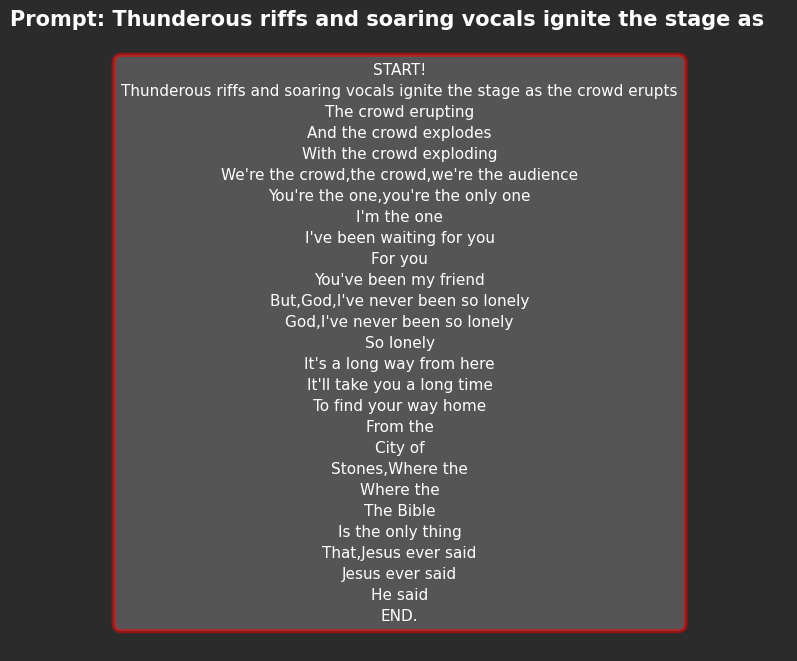

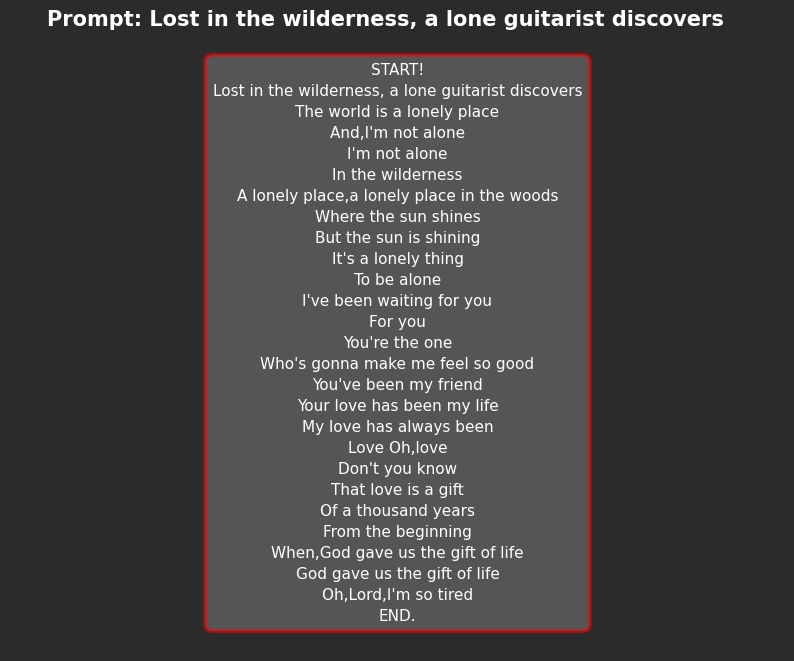

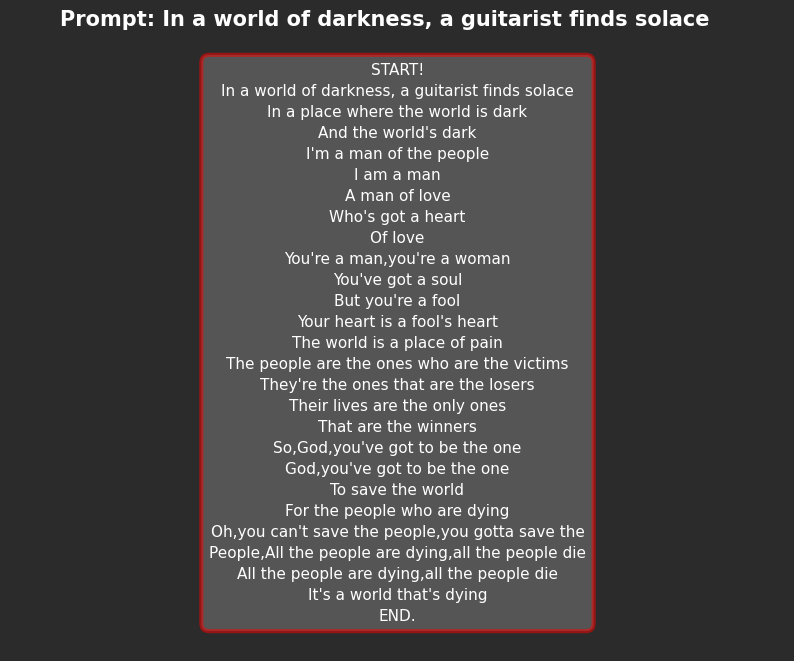

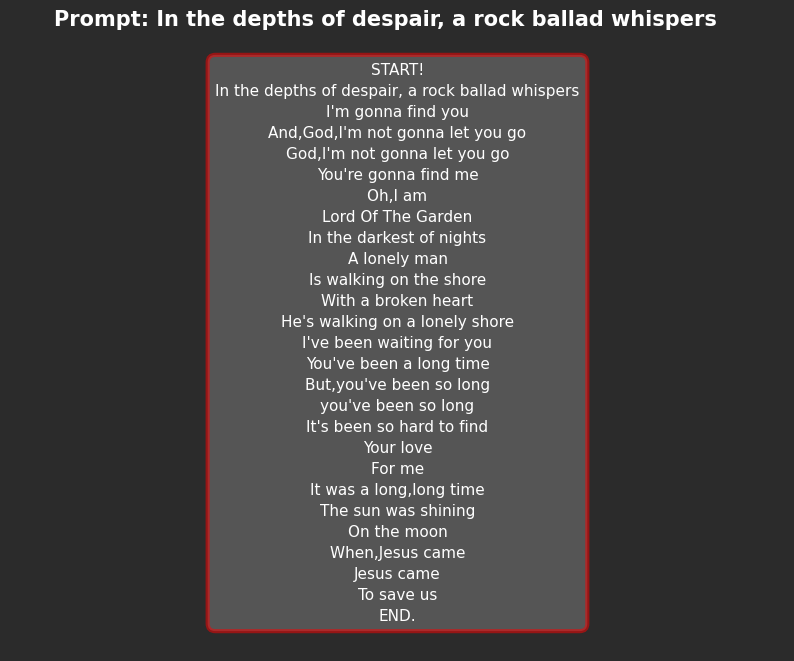

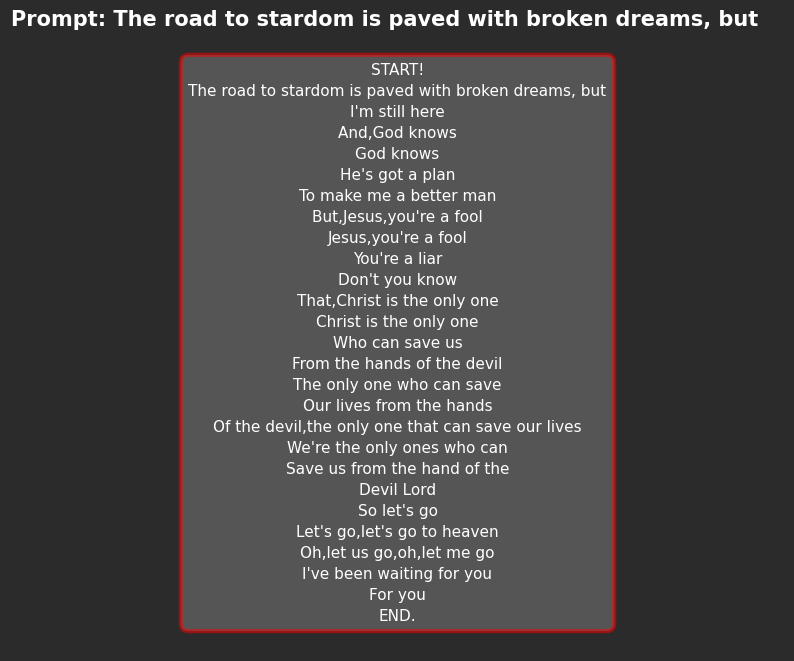

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : The_Beatles

In [ ]:
genre = 'Rock'
artist = 'The_Beatles'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


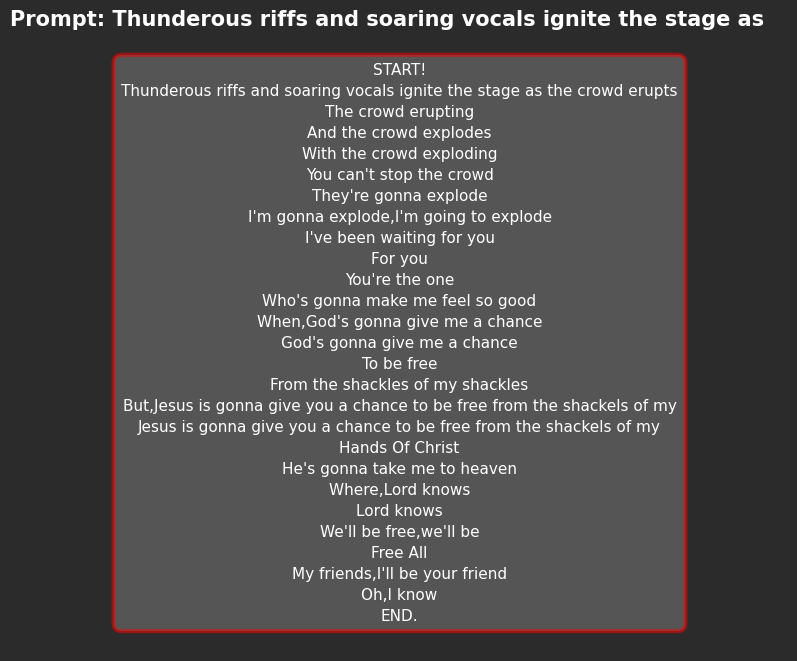

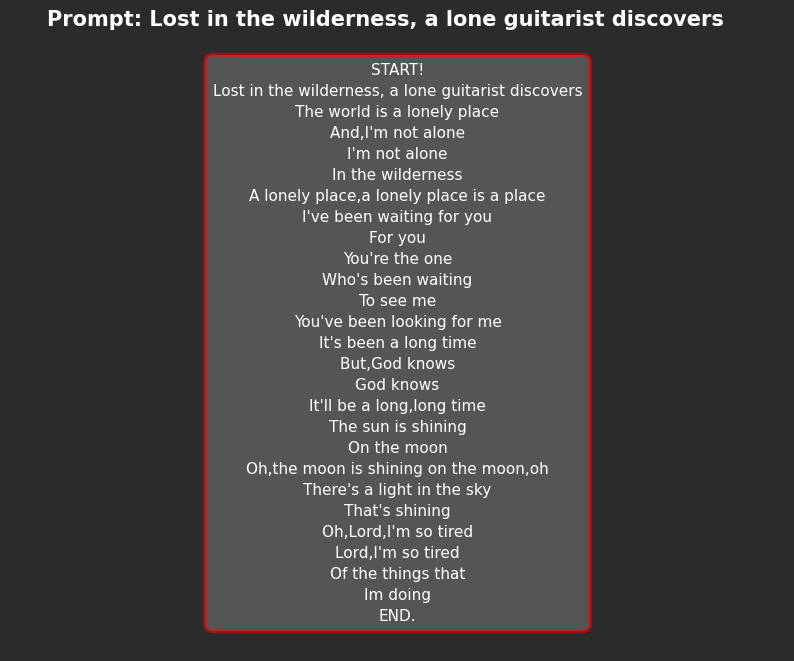

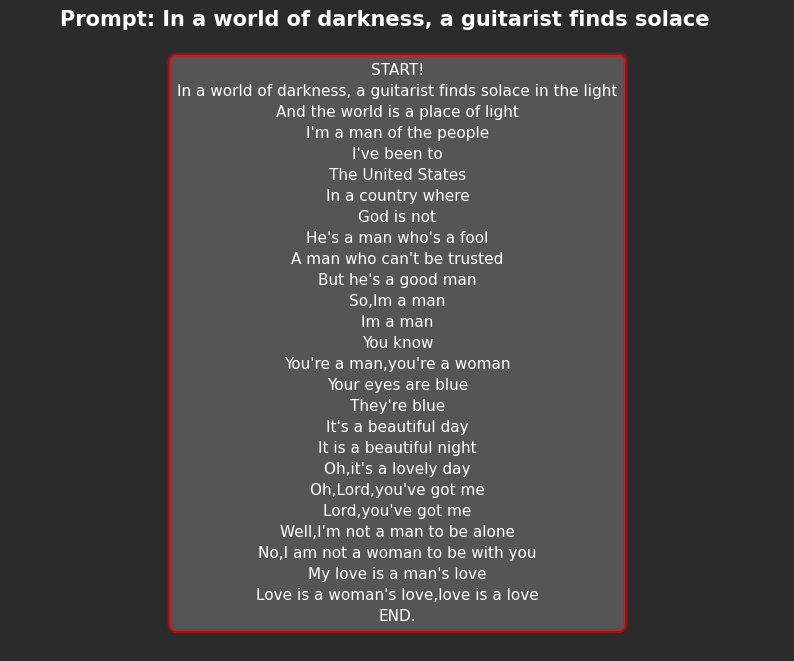

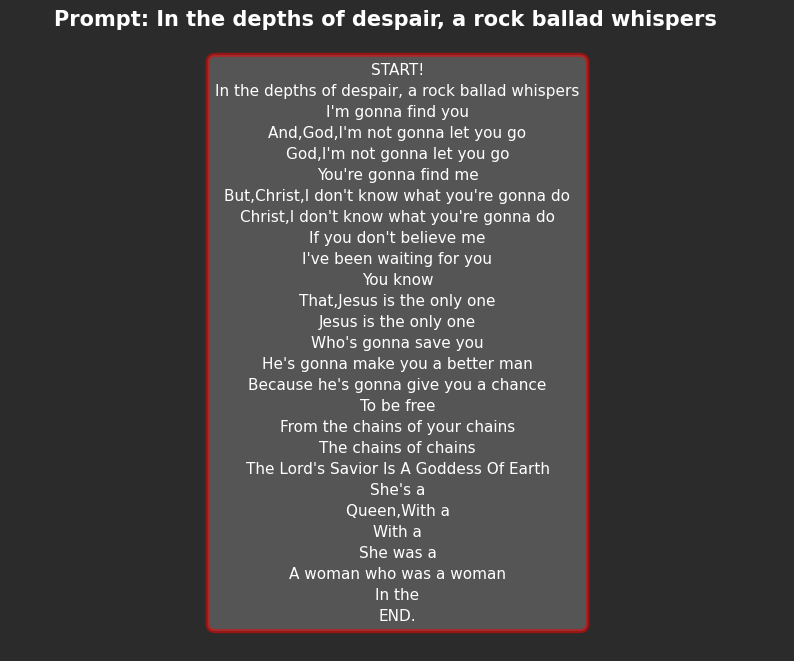

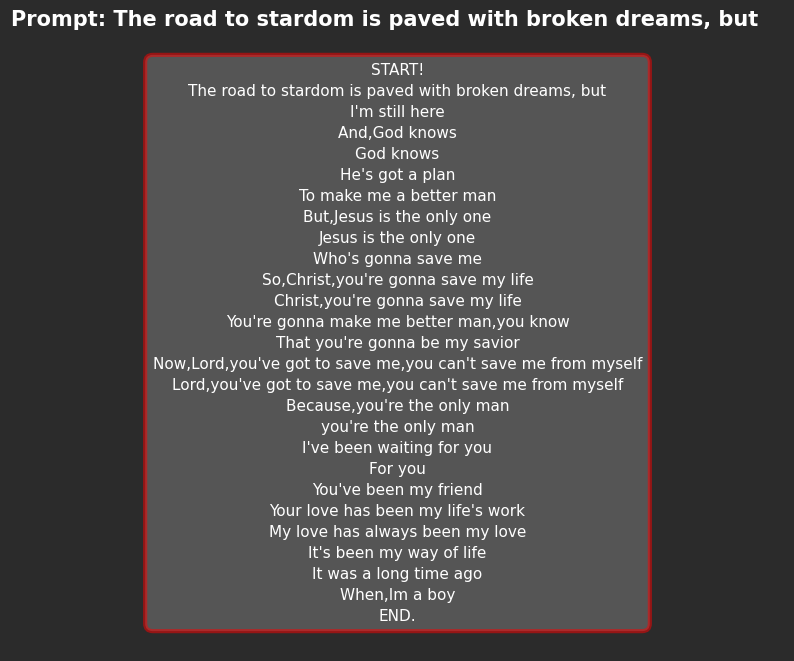

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Pink_Floyd

In [ ]:
genre = 'Rock'
artist = 'Pink_Floyd'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


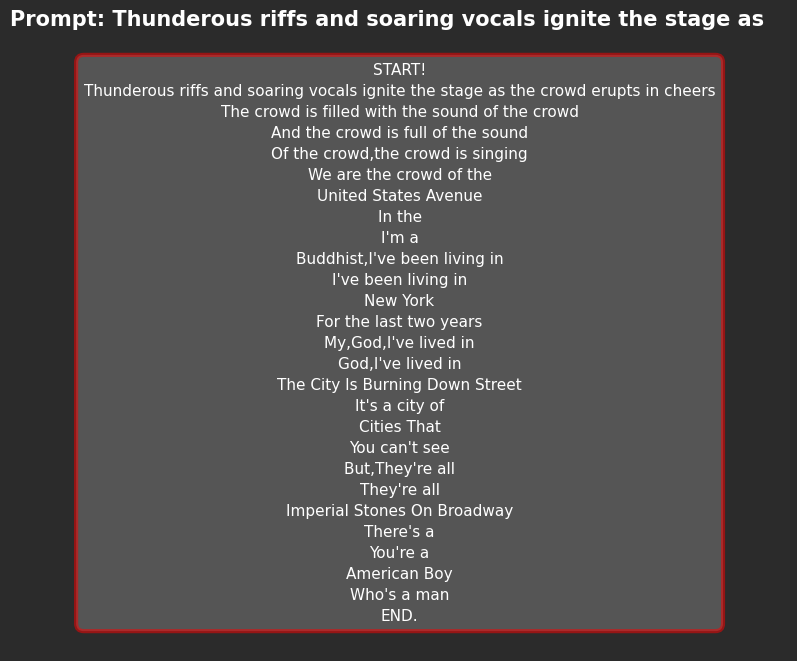

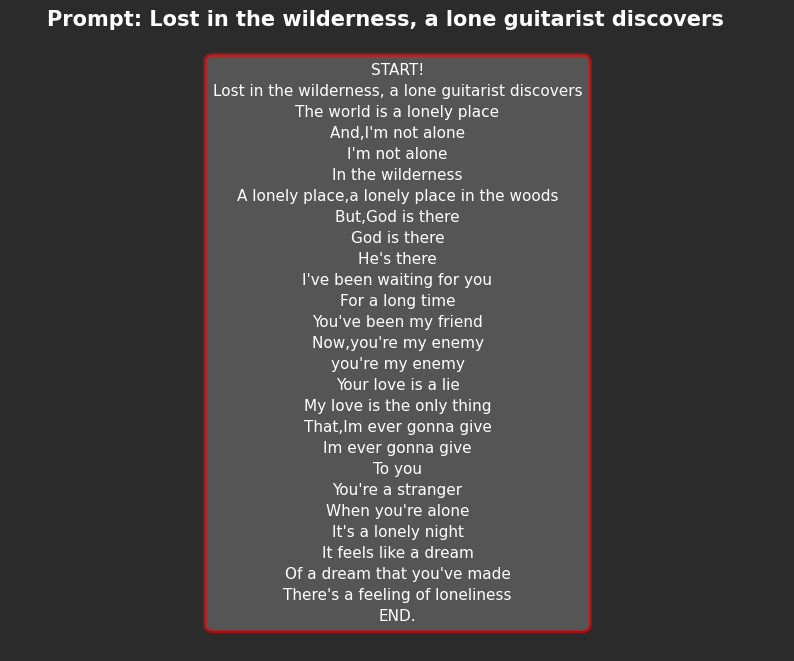

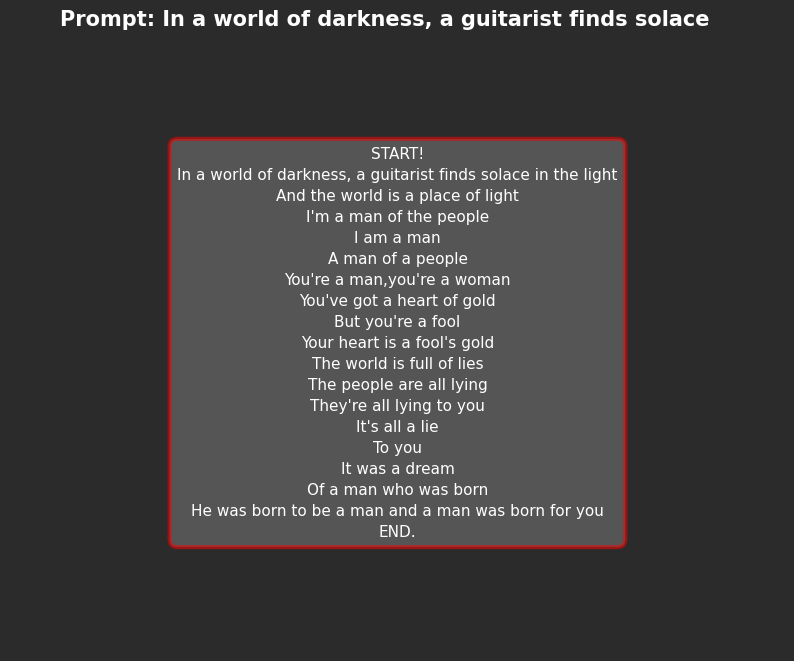

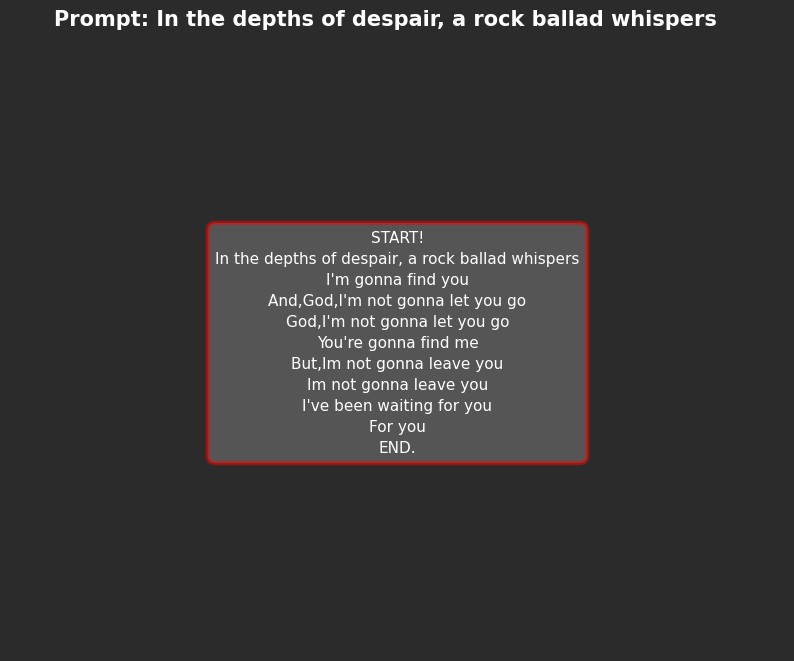

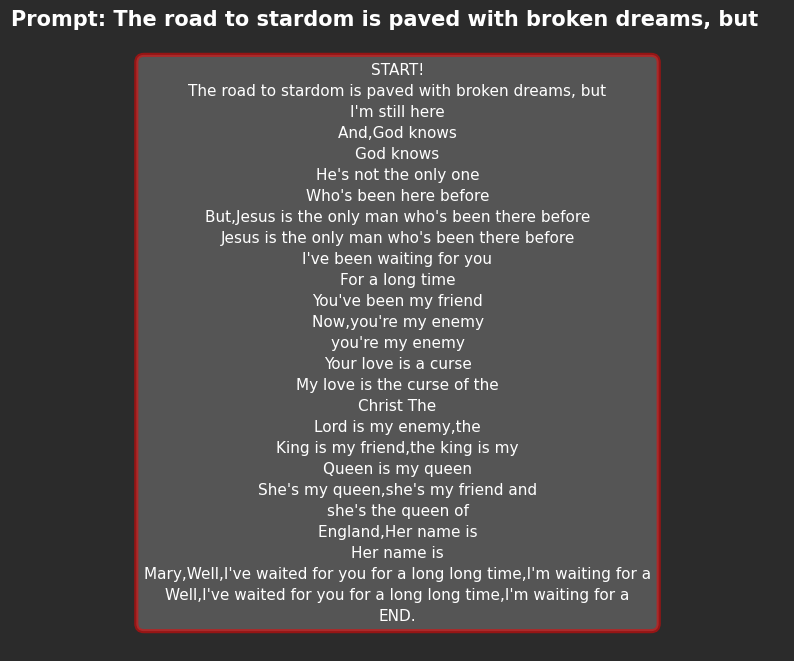

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Maroon5

In [ ]:
genre = 'Rock'
artist = 'Maroon5'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


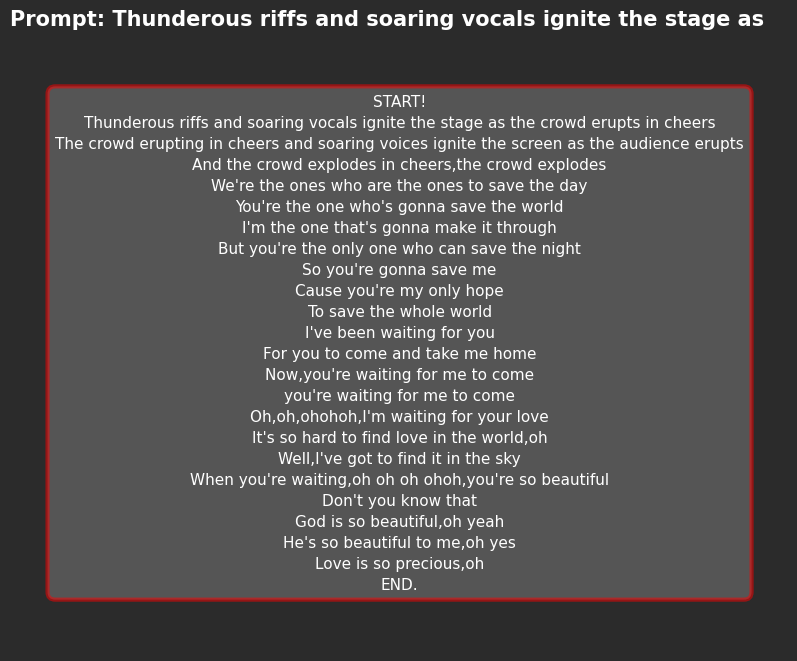

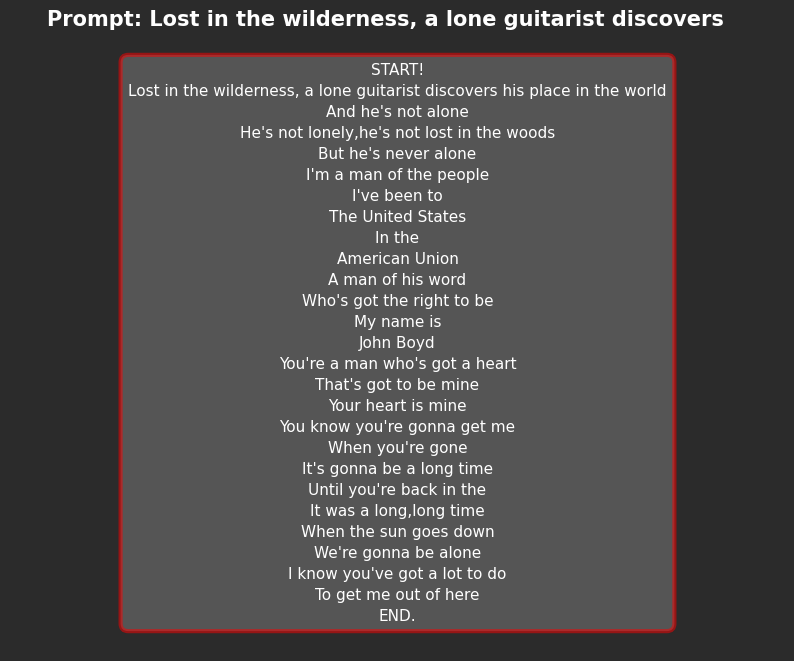

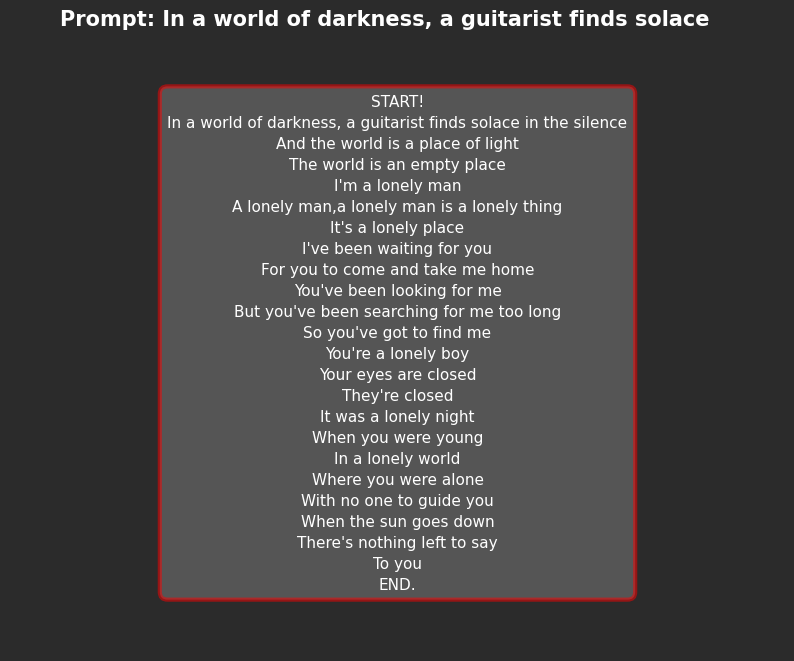

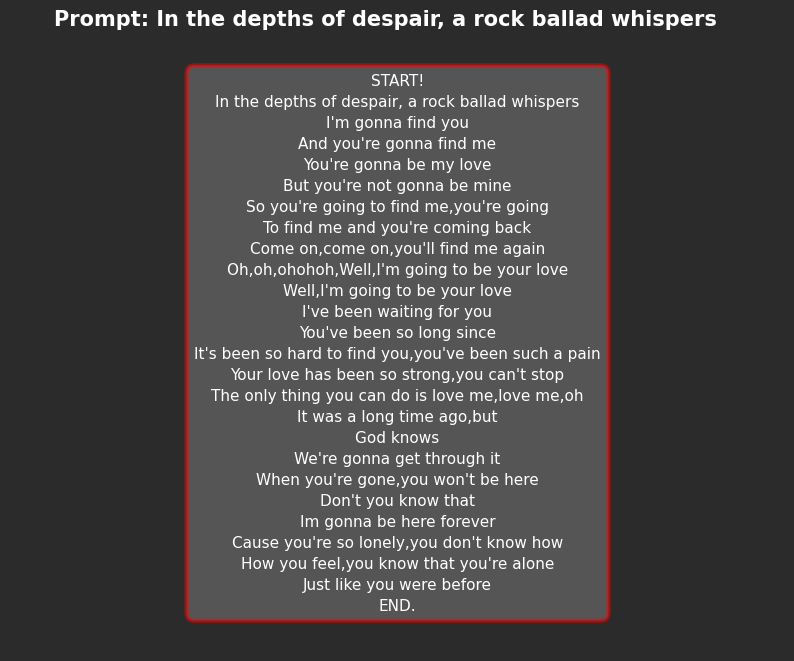

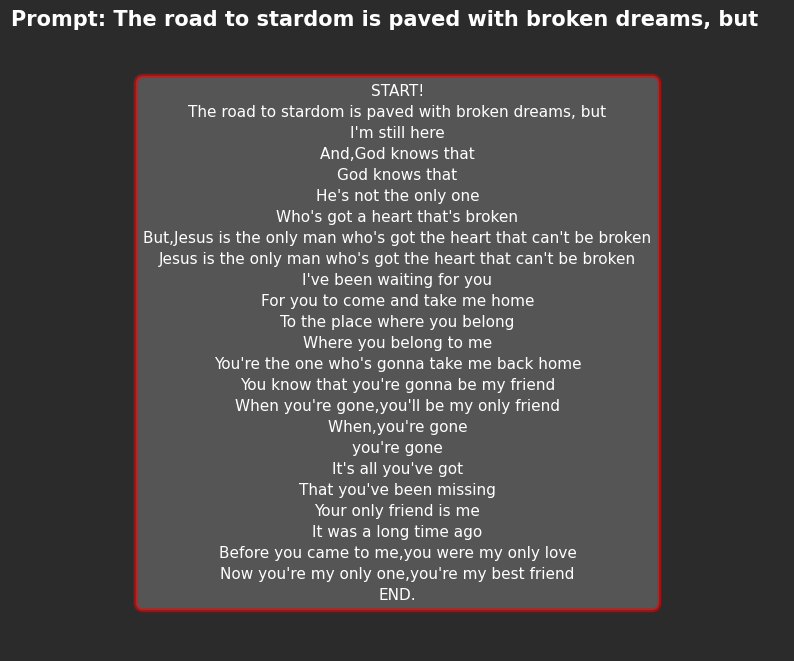

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Cold_Play

In [ ]:
genre = 'Rock'
artist = 'Cold_Play'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


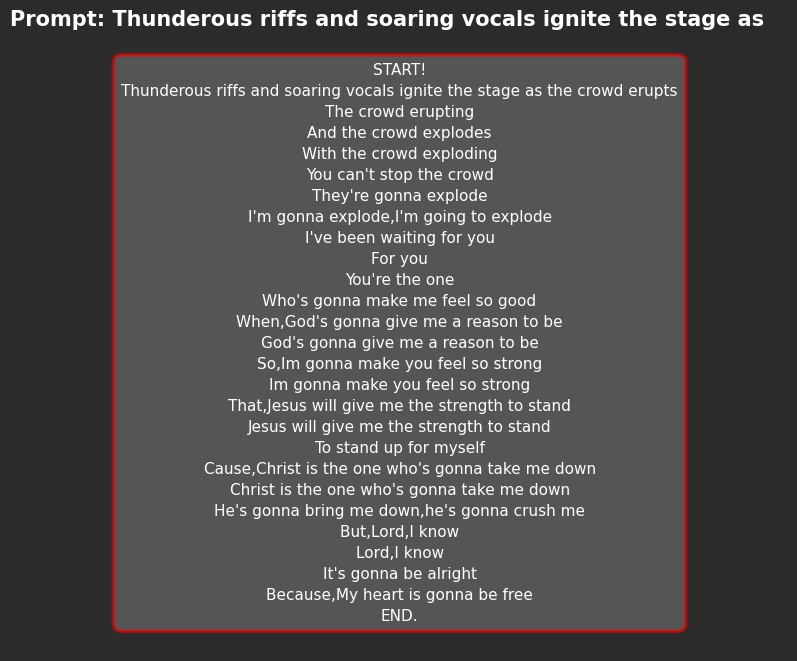

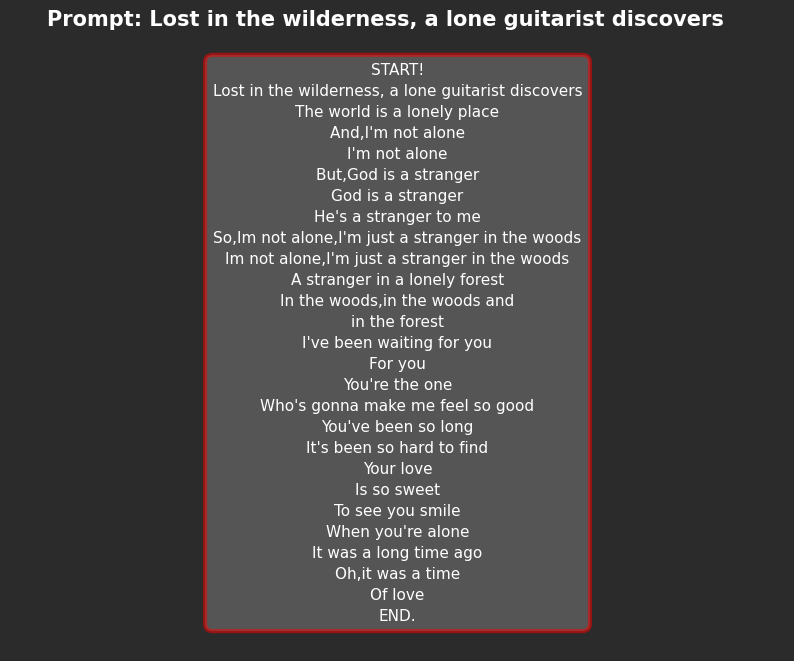

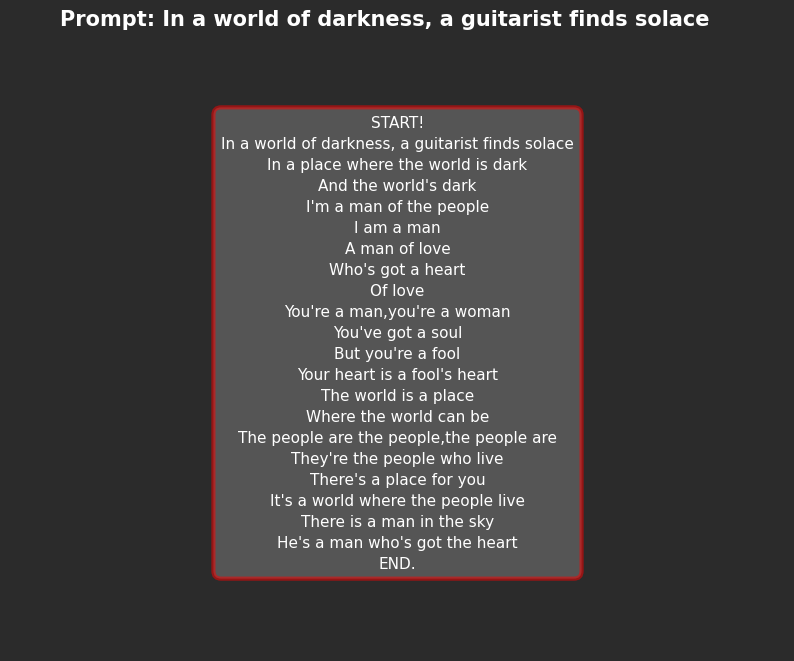

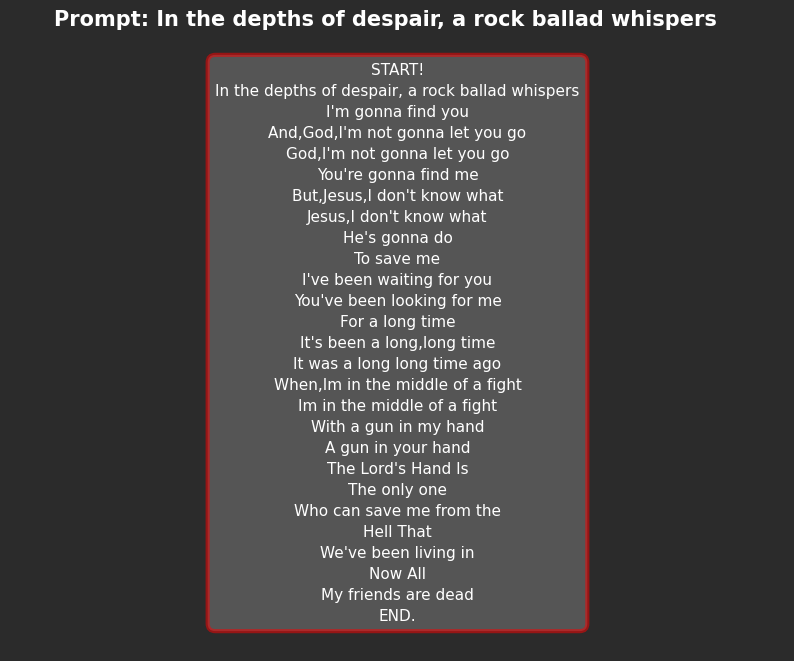

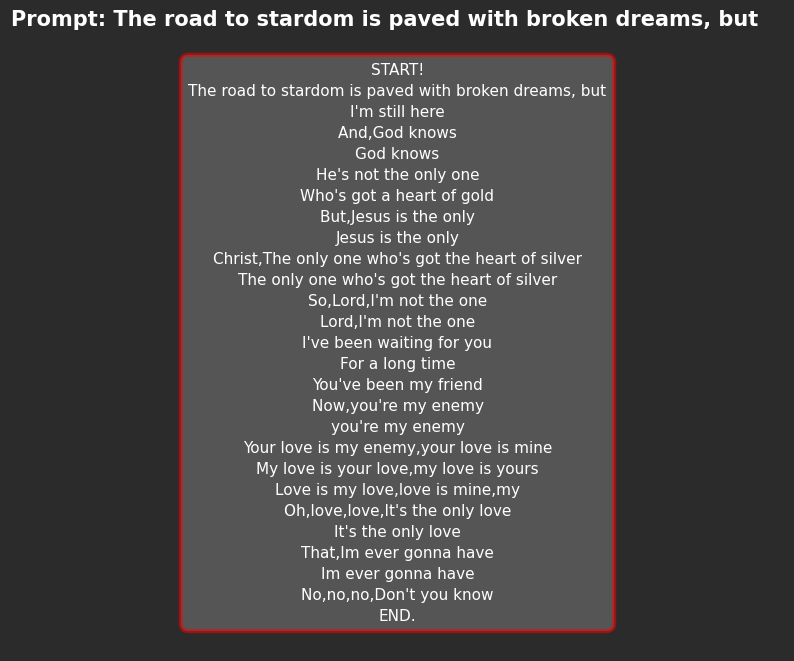

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

### GENRE : RHYTHMS & BLUES

In [ ]:
prompts = [
    "Soulful melodies and heartfelt lyrics intertwine, telling a story of",
    "Amidst the city's hustle and bustle, a blues singer",
    "A rhythm section grooves, setting the stage for",
    "From the cotton fields to the city streets, a",
    "In the midst of sorrow, a blues ballad whispers",
]

genre = 'RB'

# Getting the saved trained model weights for genre 'RB'
model = TFAutoModelForCausalLM.from_pretrained("gpt2", max_length=512)
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Genre Models/{genre}_model_weights.h5"
model.load_weights(path)

# # GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# # Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]

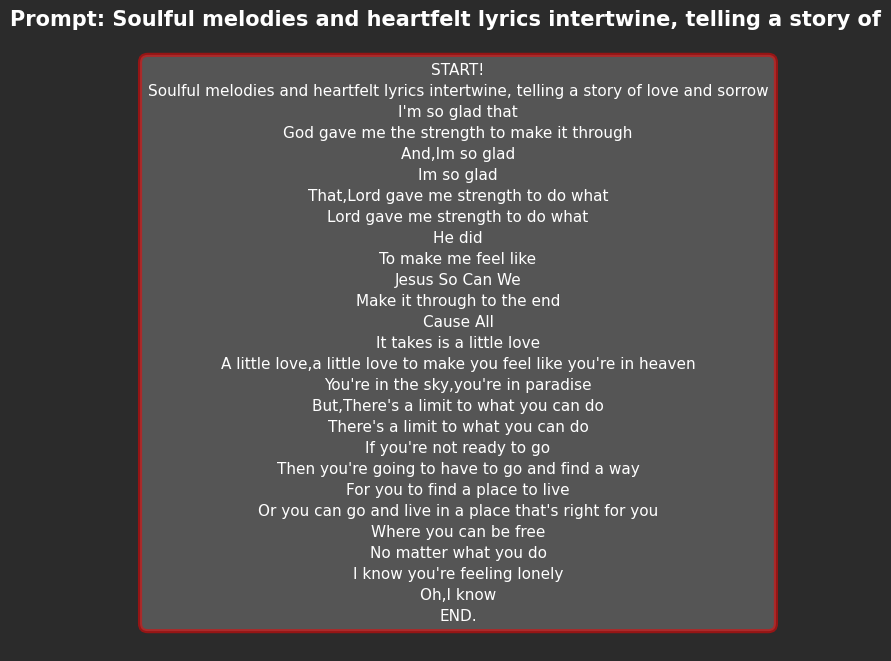

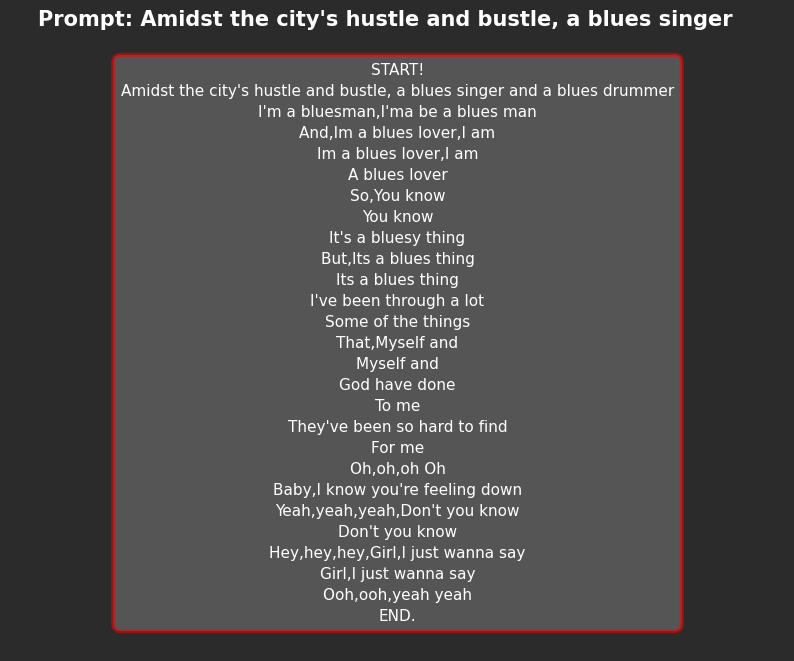

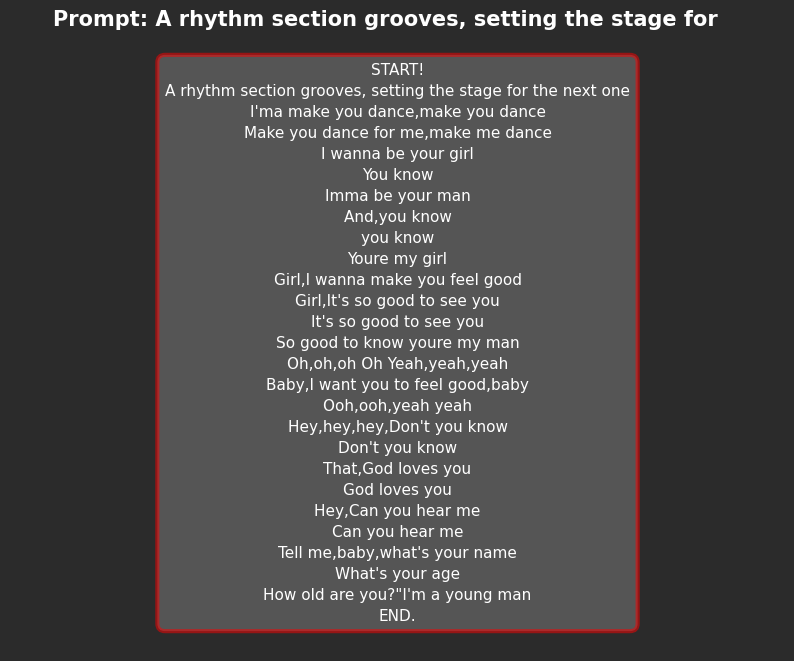

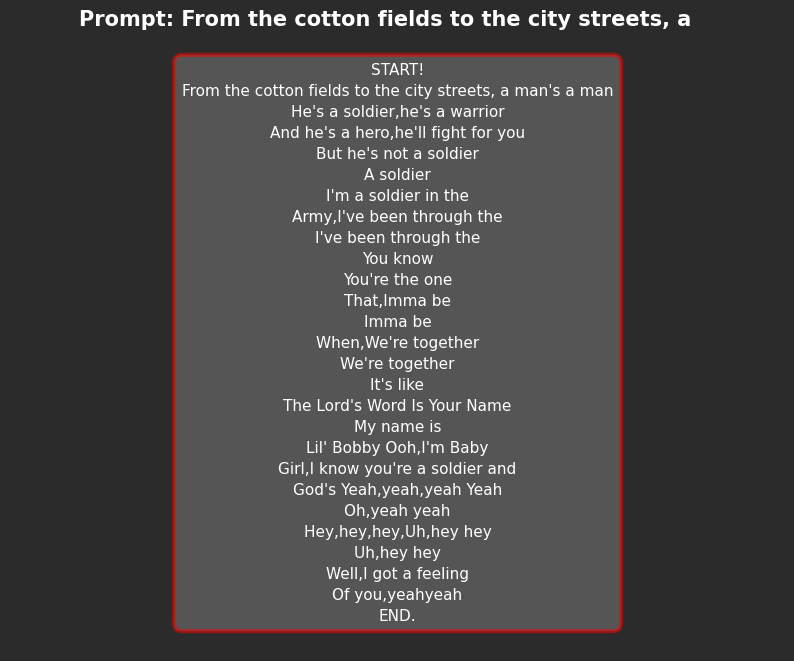

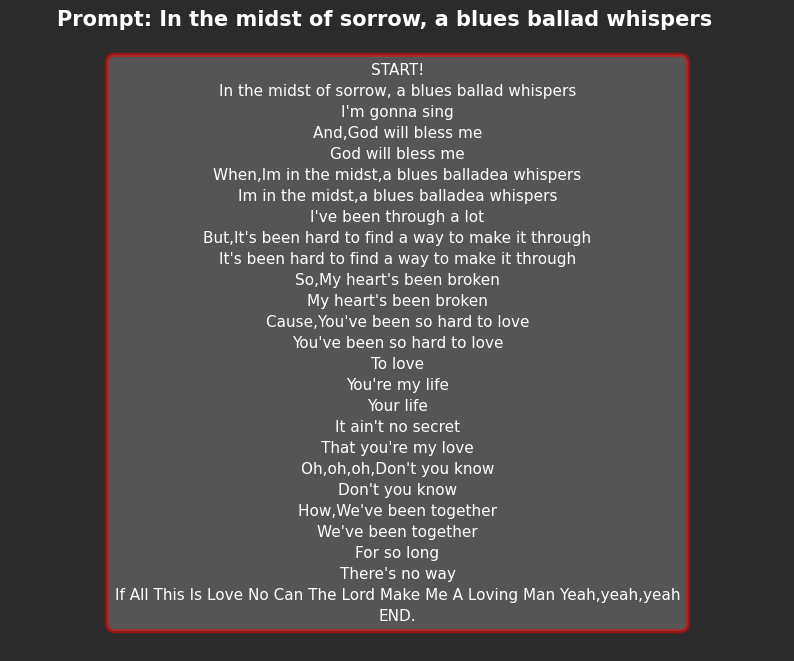

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

#### ARTIST SPECIFIC LYRIC GENERATION

In [ ]:
prompts = [
    "Soulful melodies and heartfelt lyrics intertwine, telling a story of",
    "Amidst the city's hustle and bustle, a blues singer",
    "A rhythm section grooves, setting the stage for",
    "From the cotton fields to the city streets, a",
    "In the midst of sorrow, a blues ballad whispers",
]

In [ ]:
# Initializing the GPT2 Model
model = TFAutoModelForCausalLM.from_pretrained("gpt2", max_length=512)

##### Artist : The_Weekend

In [ ]:
genre = 'RB'
artist = 'The_Weekend'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generati

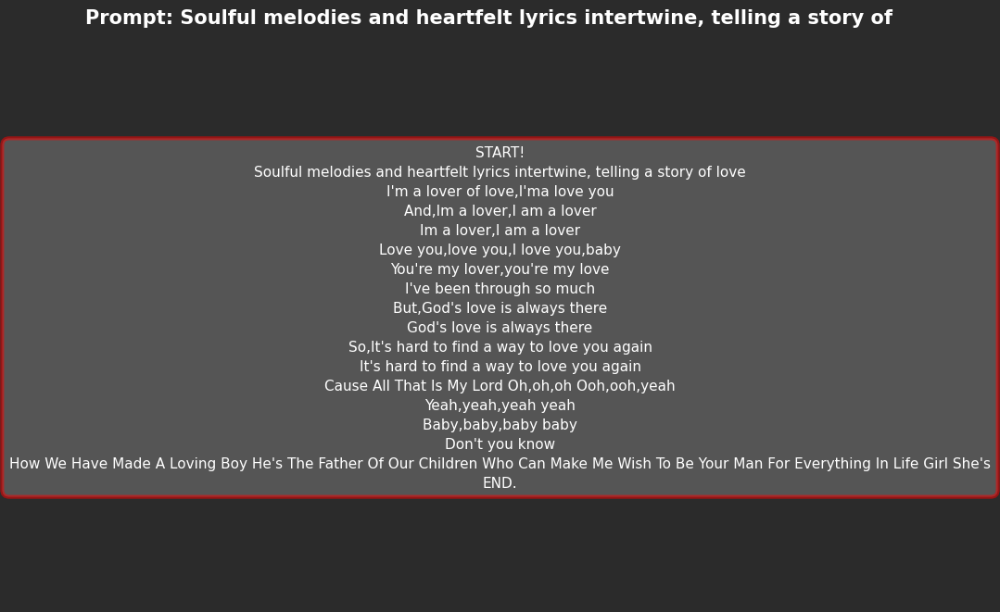

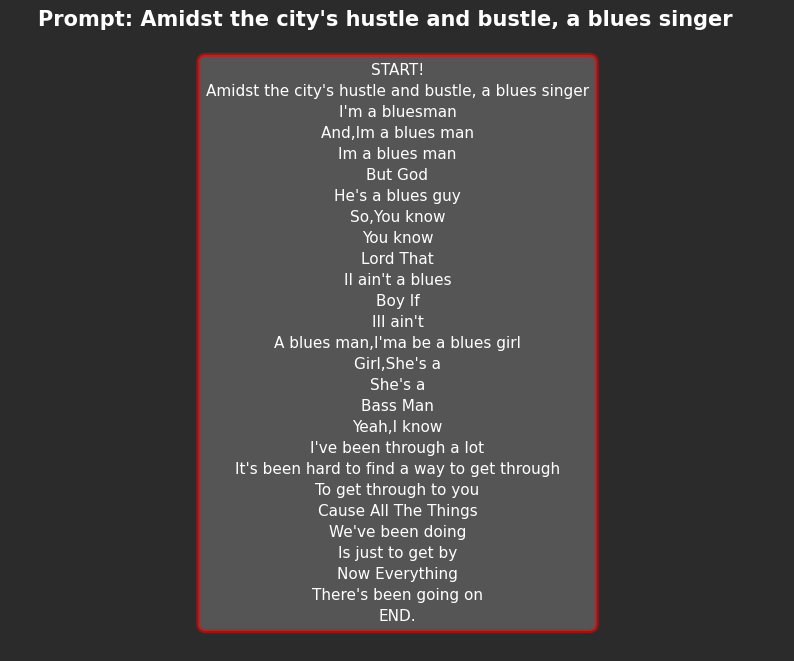

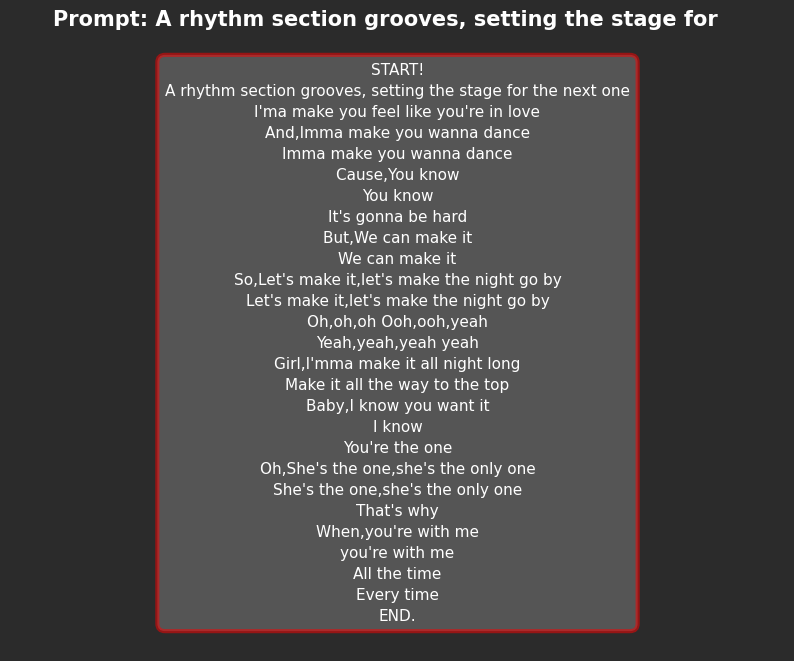

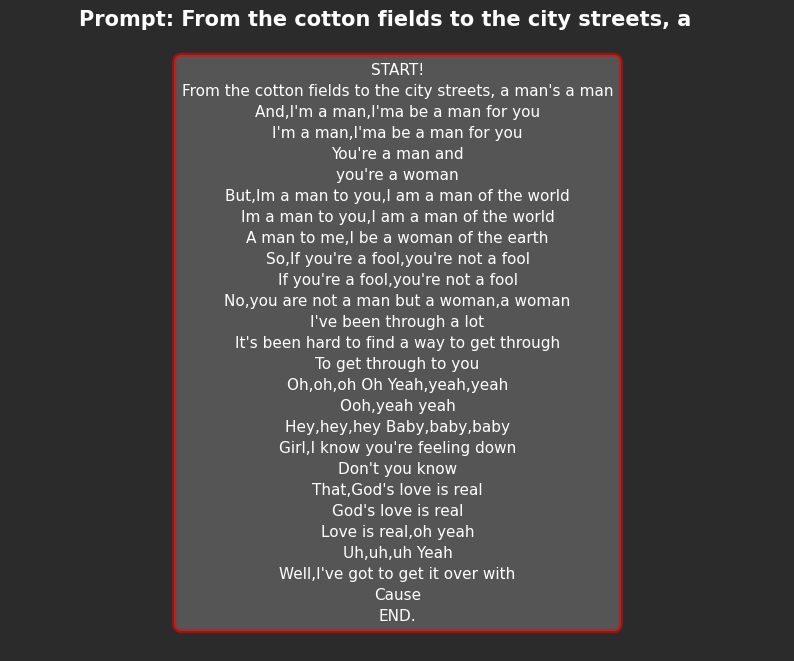

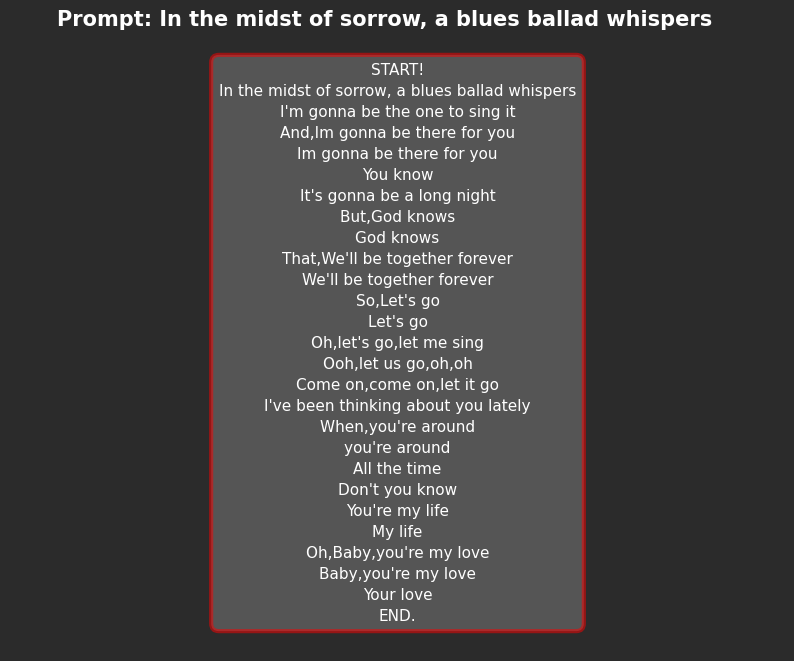

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Chris_Brown

In [ ]:
genre = 'RB'
artist = 'Chris_Brown'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


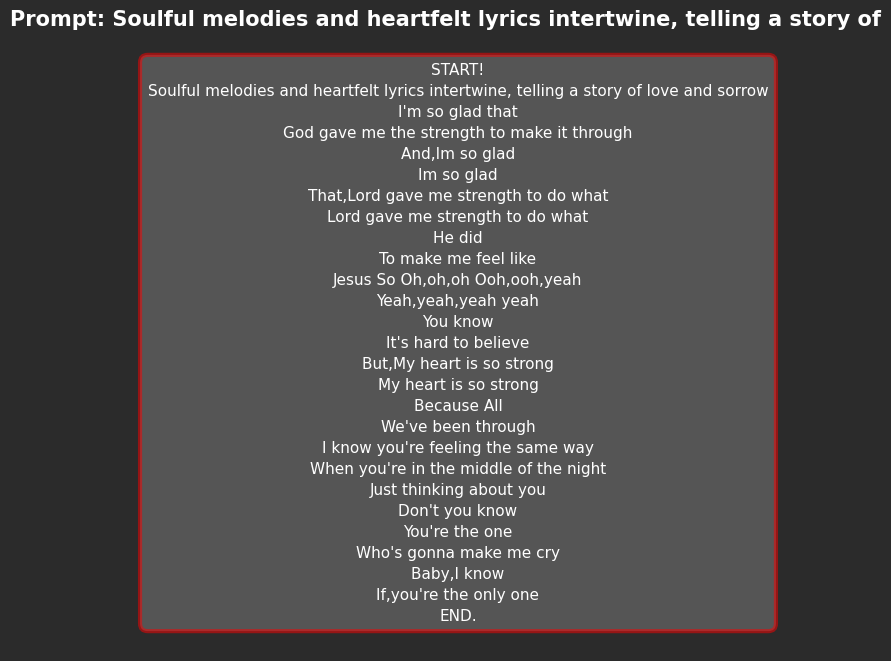

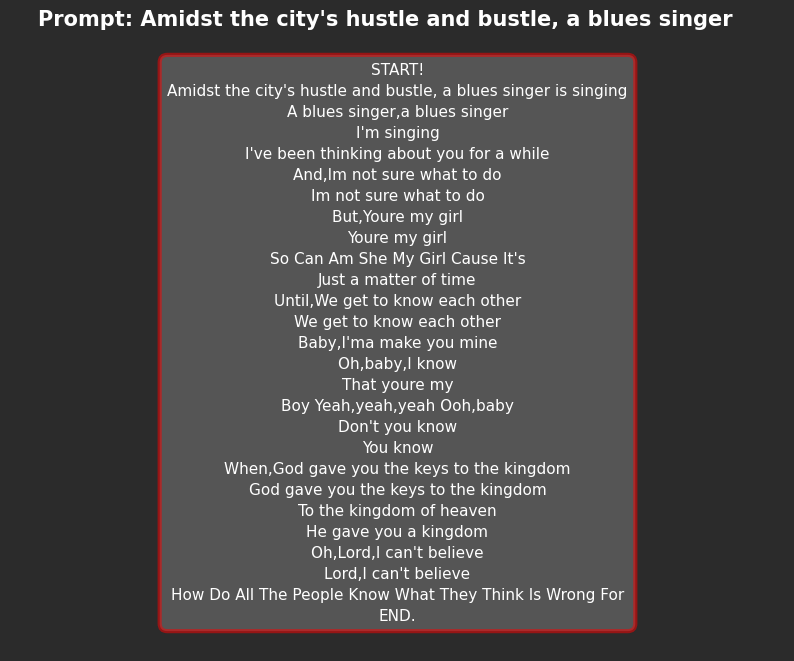

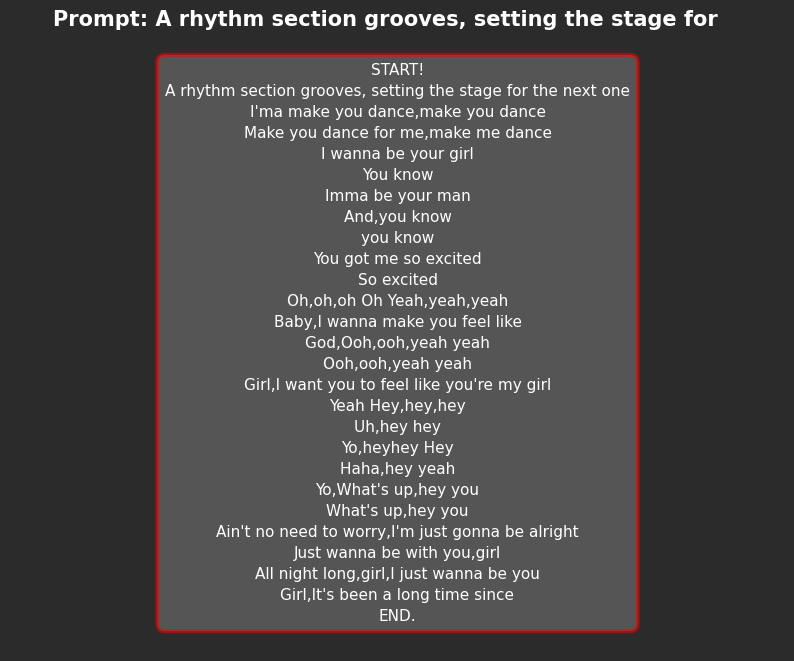

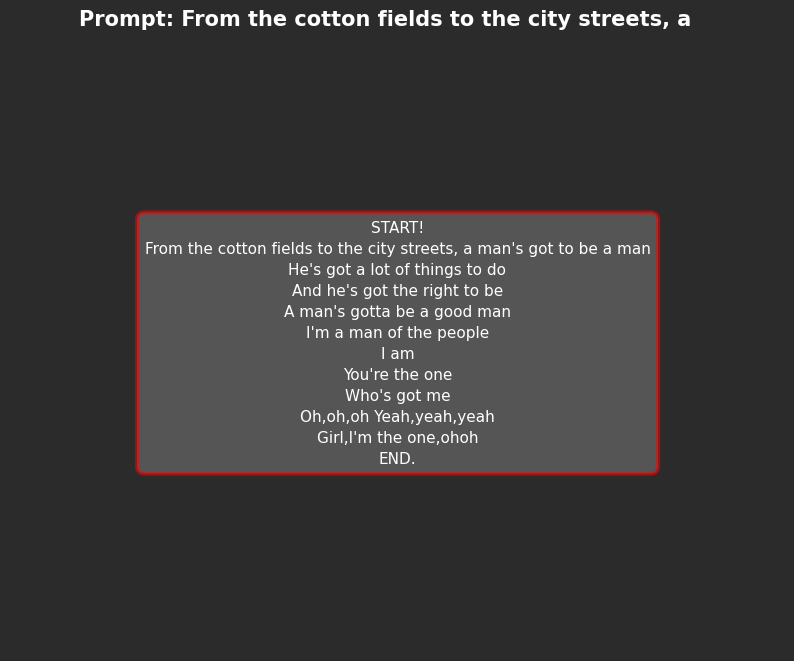

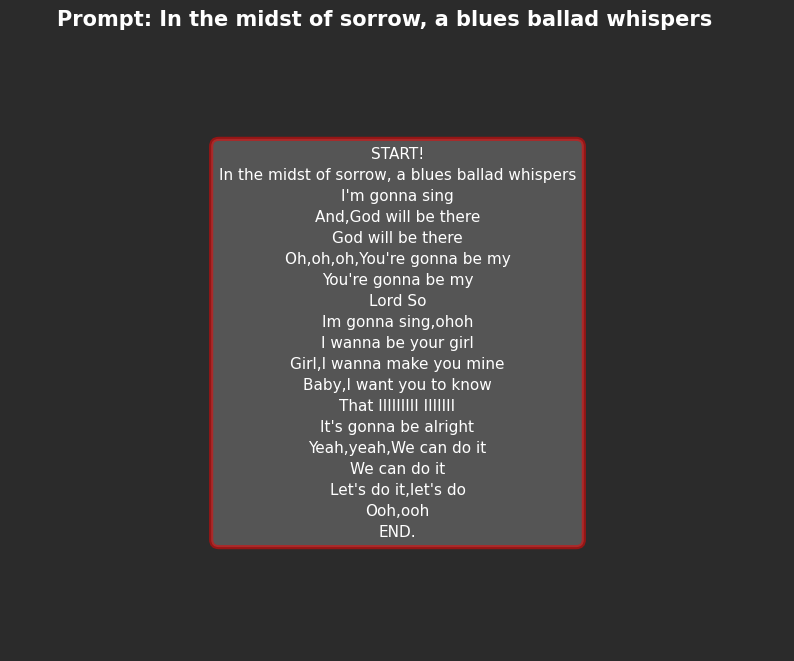

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Dua_Lipa

In [ ]:
genre = 'RB'
artist = 'Dua_Lipa'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generati

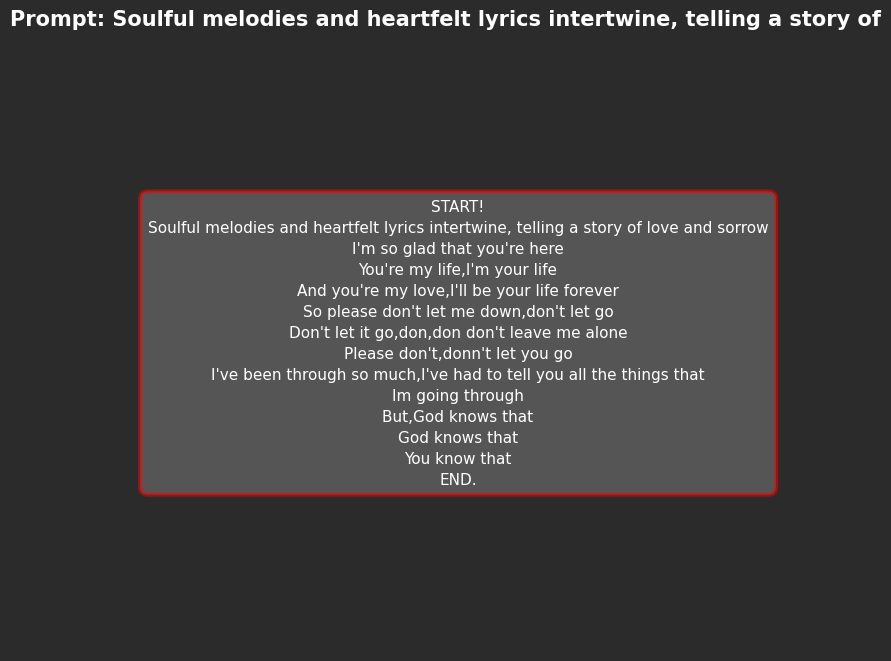

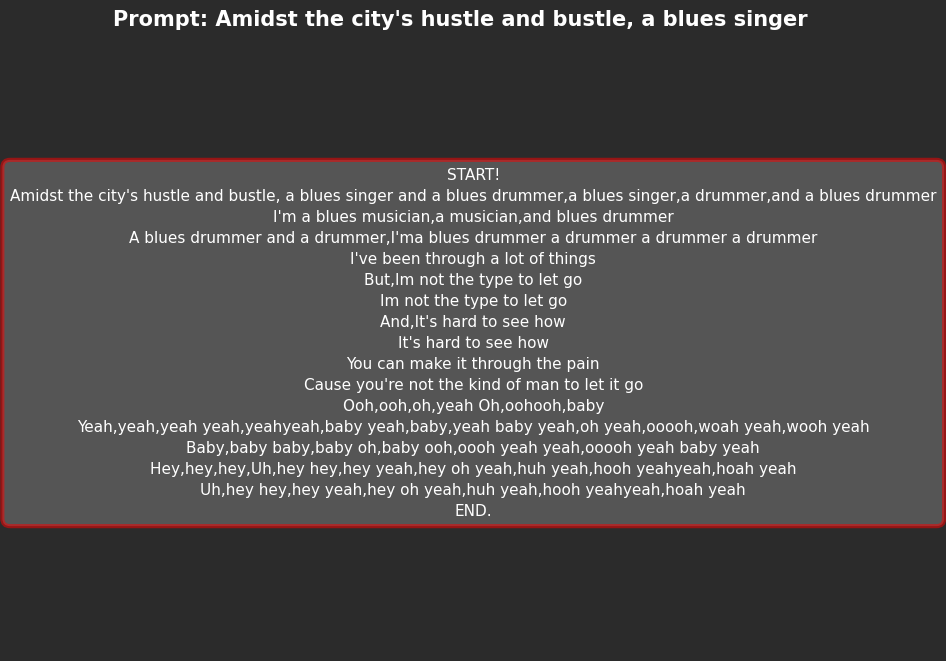

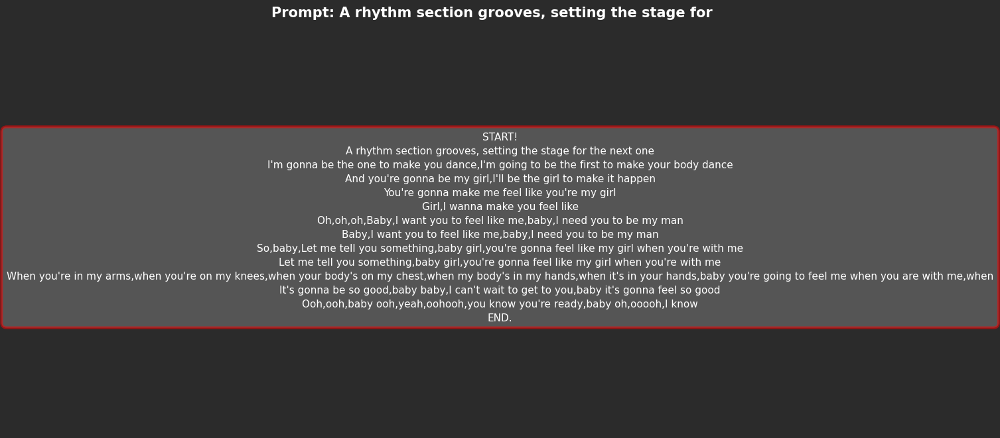

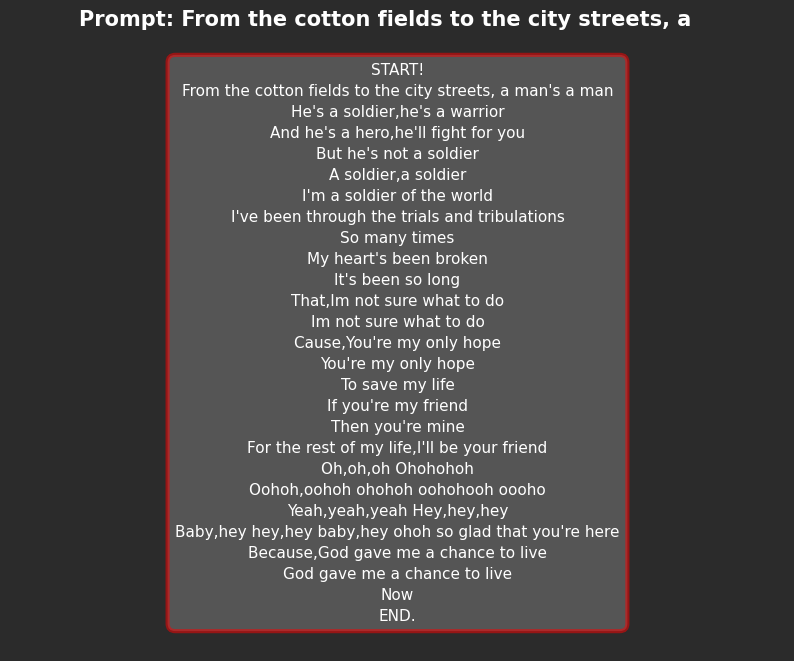

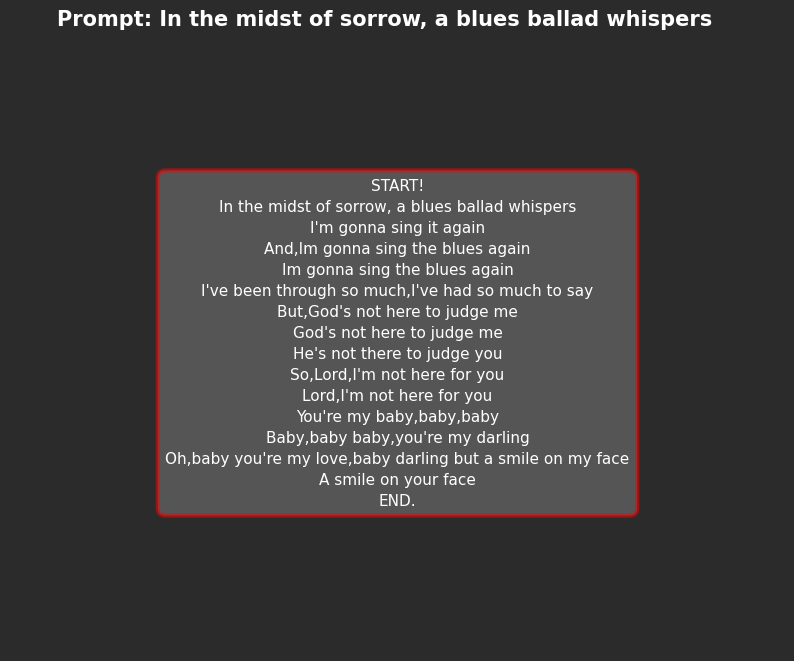

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Ed_Sheeran

In [ ]:
genre = 'RB'
artist = 'Ed_Sheeran'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generati

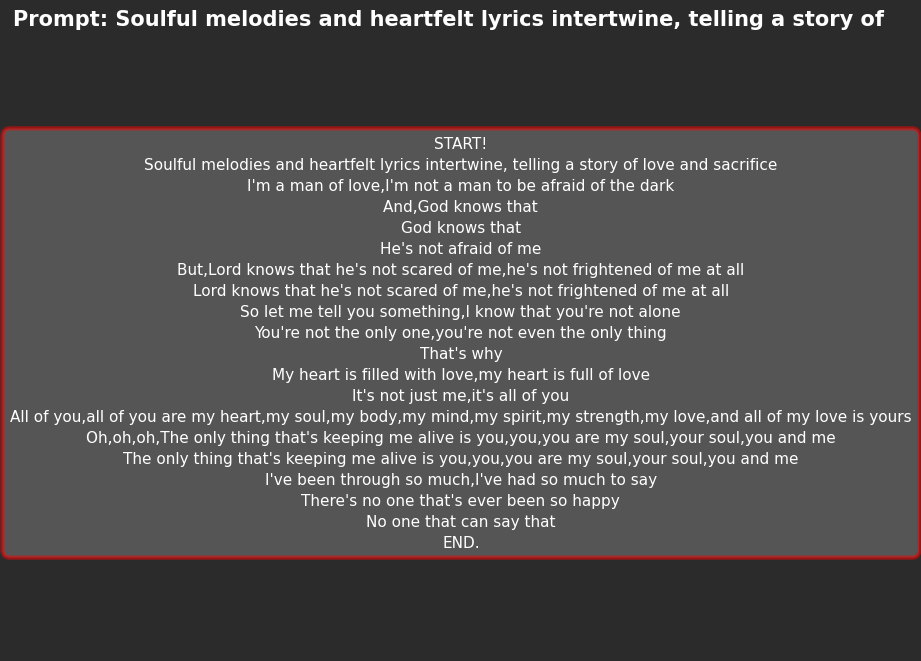

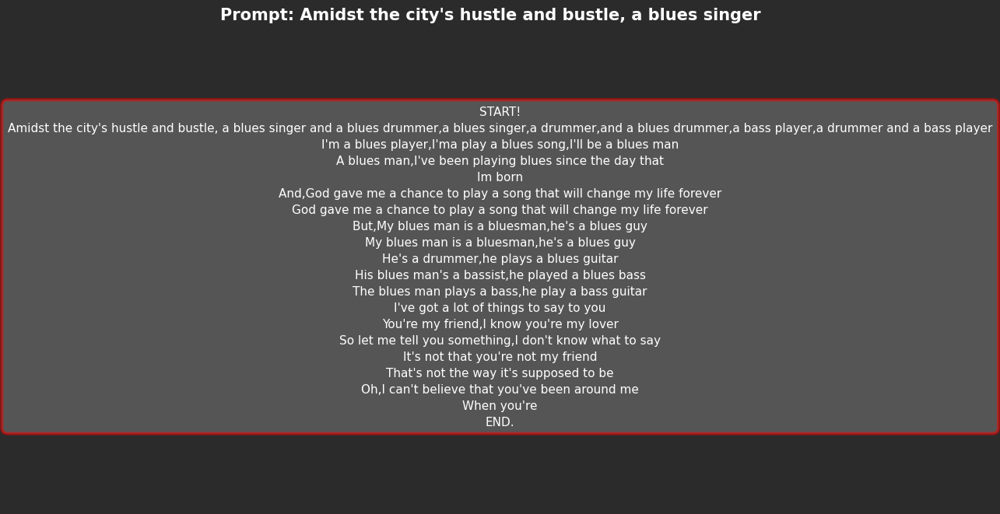

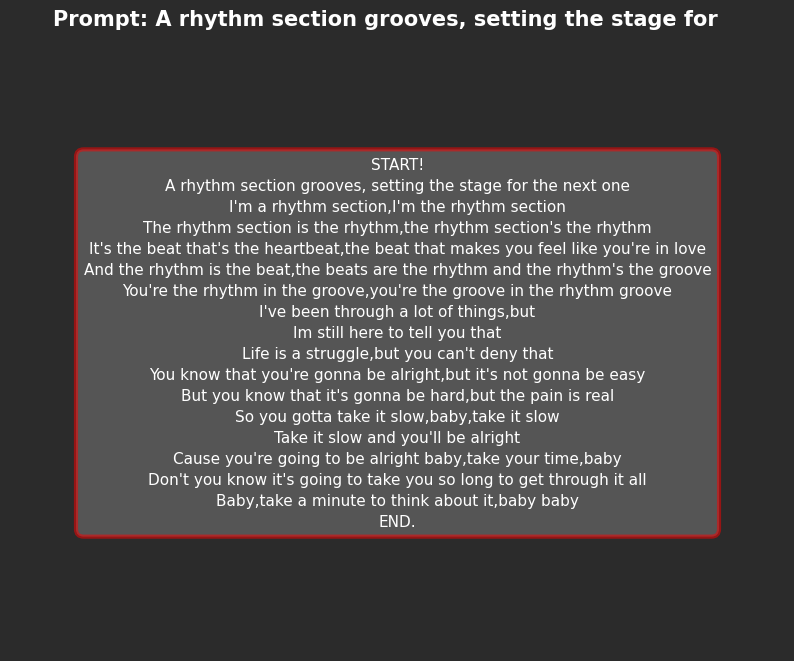

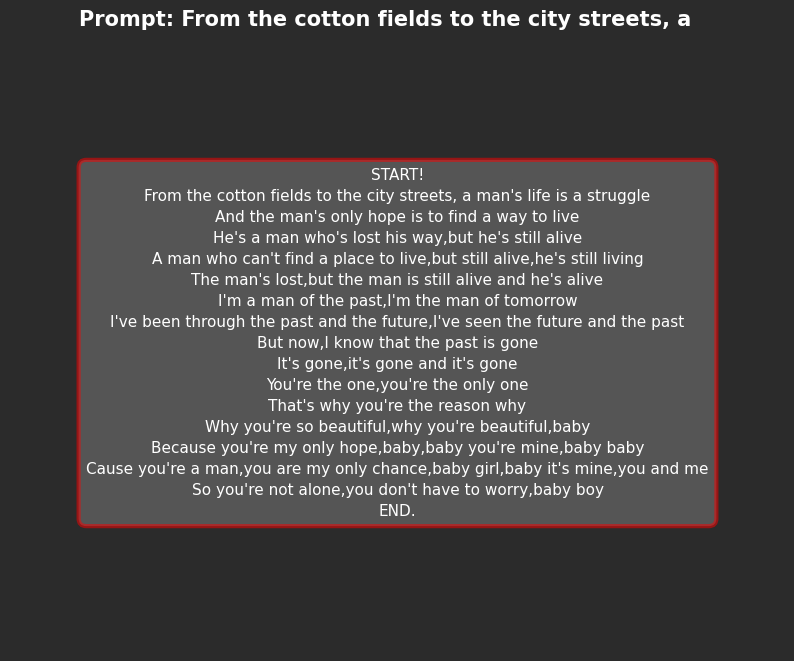

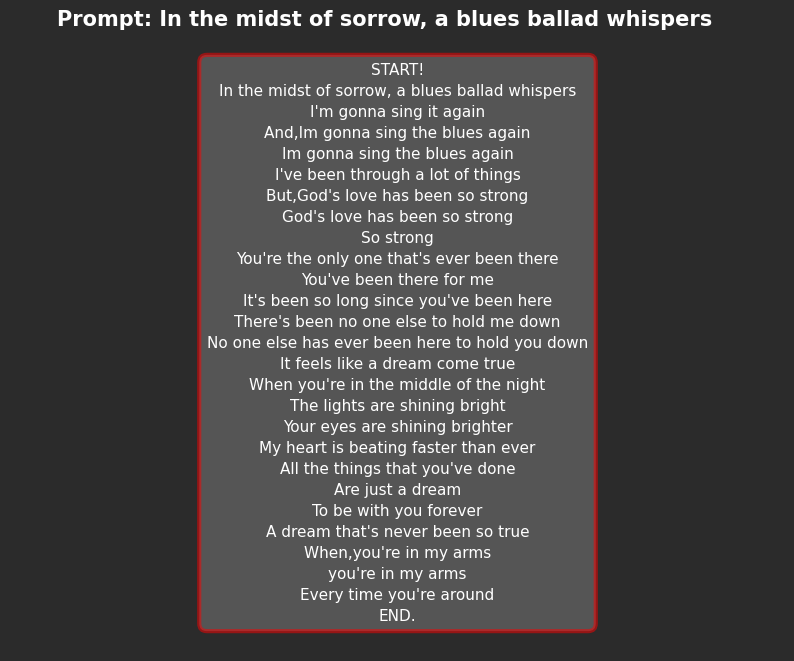

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Justin_Bieber

In [ ]:
genre = 'RB'
artist = 'Justin_Bieber'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


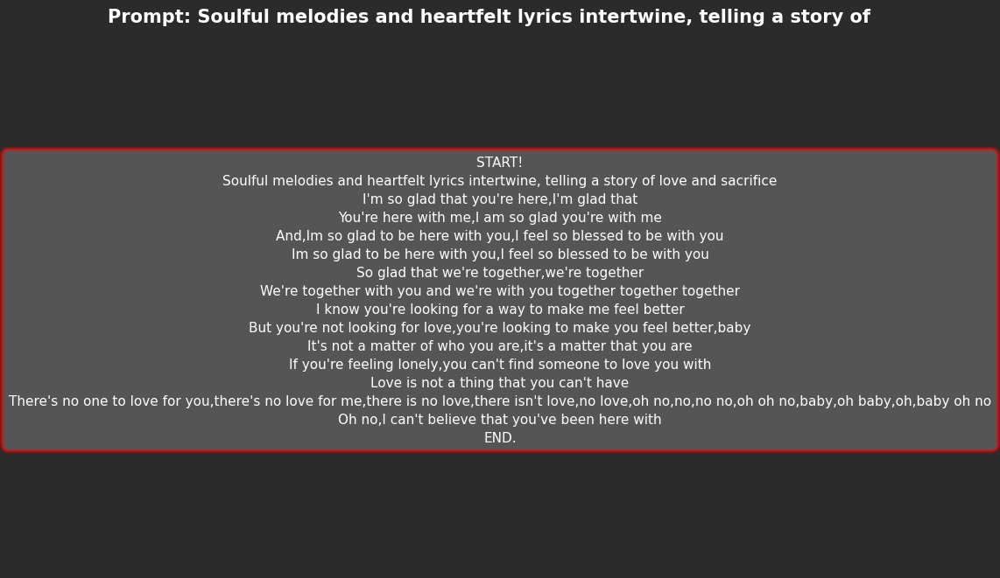

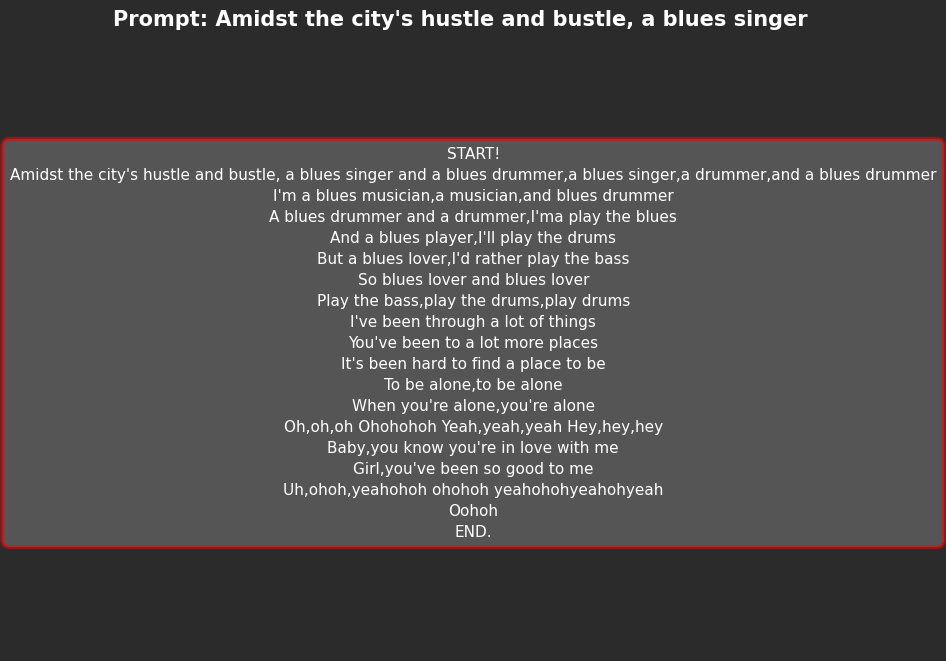

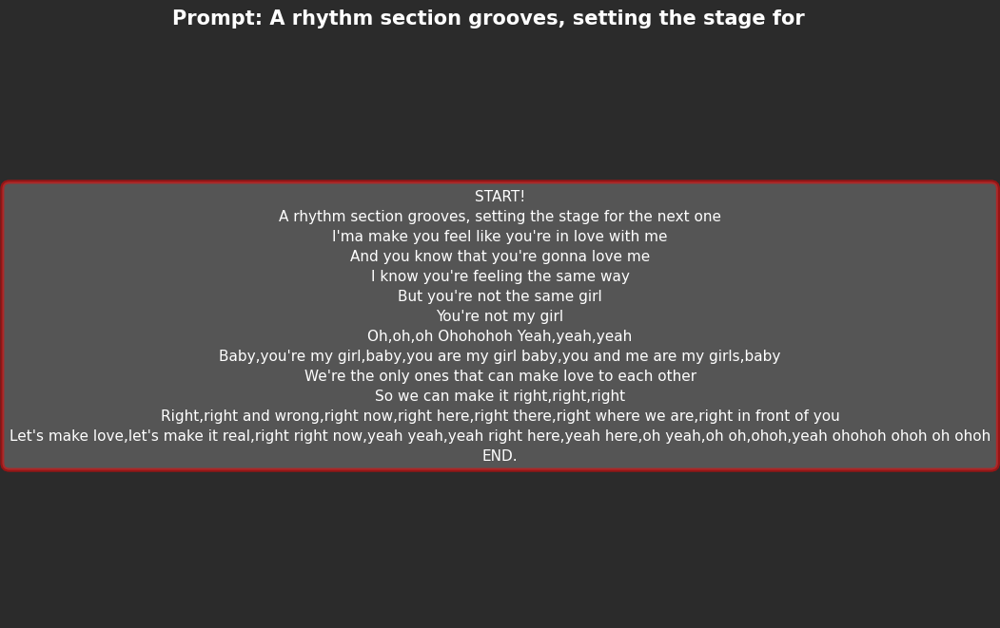

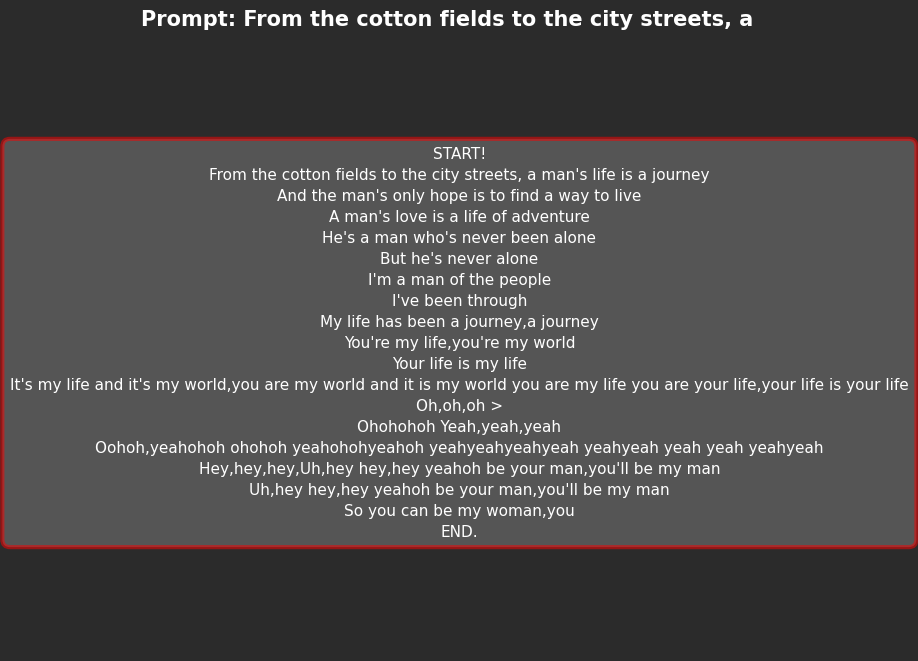

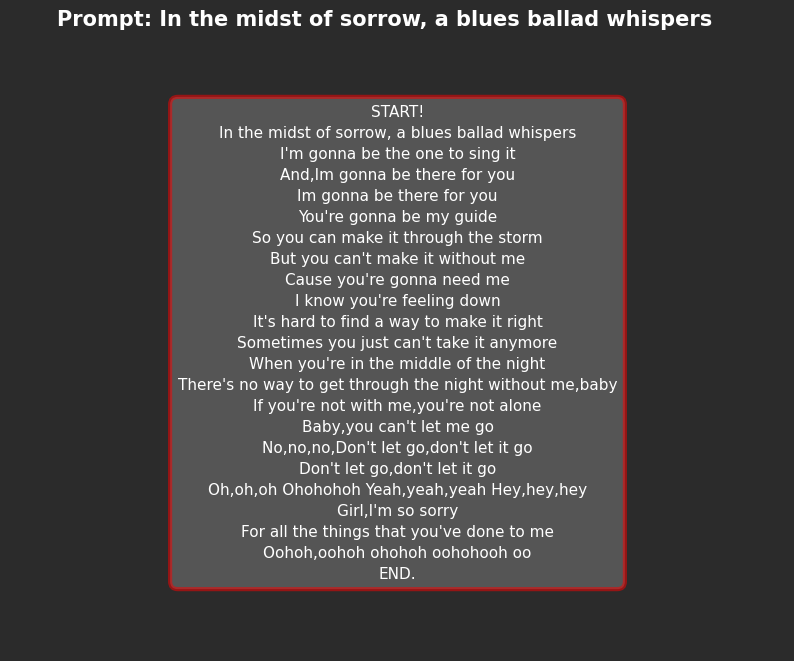

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

### GENRE : POP

In [ ]:
prompts = [
    "A pop sensation reigns supreme with infectious beats and melodies",
    "A rising star captivates hearts with irresistible pop melodies",
    "In fame's whirlwind, a pop icon emerges with catchy tunes",
    "A summer hit dominates charts, spreading joy with its pop vibes",
    "In pop dreams, a superstar's journey unfolds with captivating tunes"
]

genre = 'Pop'

# Getting the saved trained model weights for genre 'RB'
model = TFAutoModelForCausalLM.from_pretrained("gpt2", max_length=512)
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Genre Models/{genre}_model_weights.h5"
model.load_weights(path)

# # GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# # Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


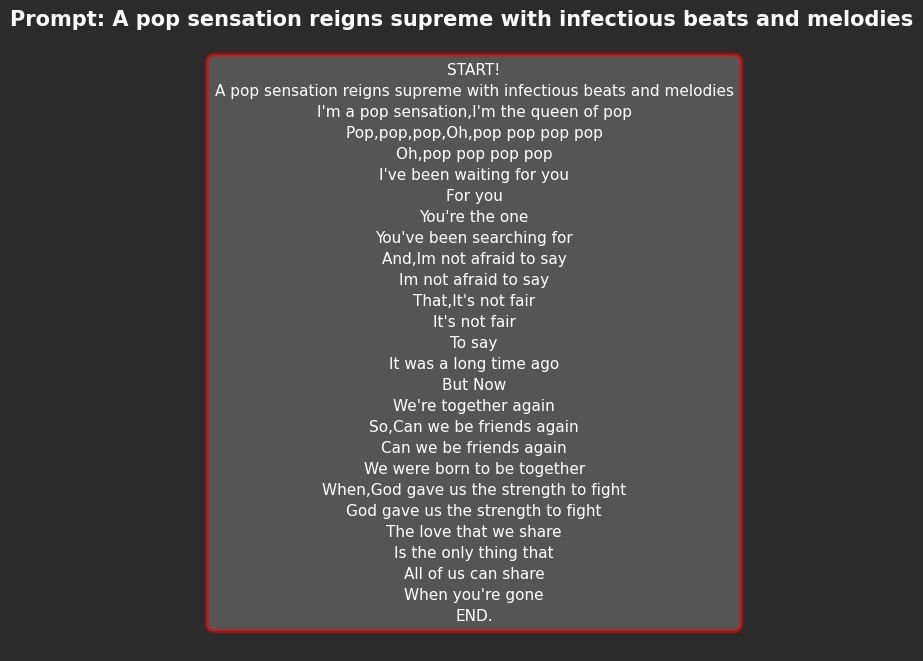

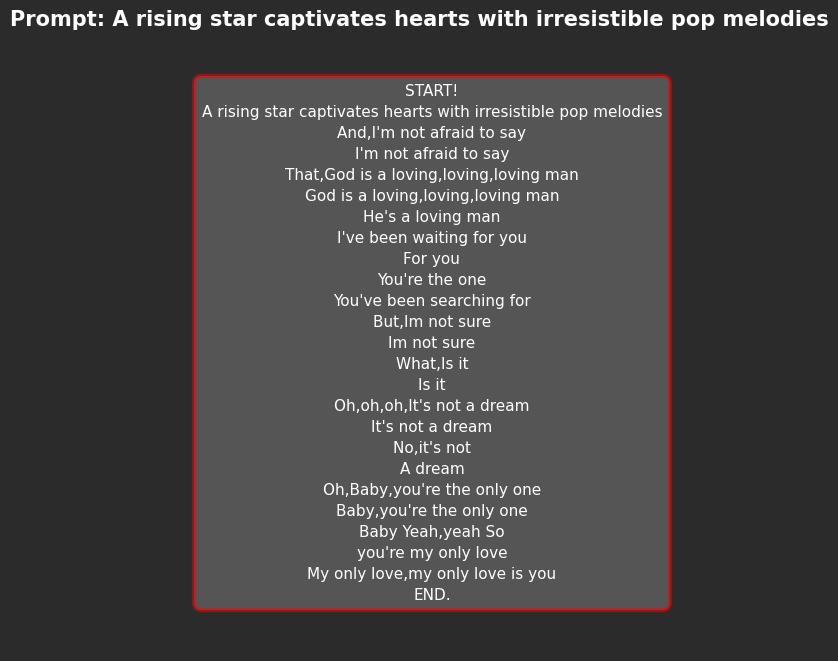

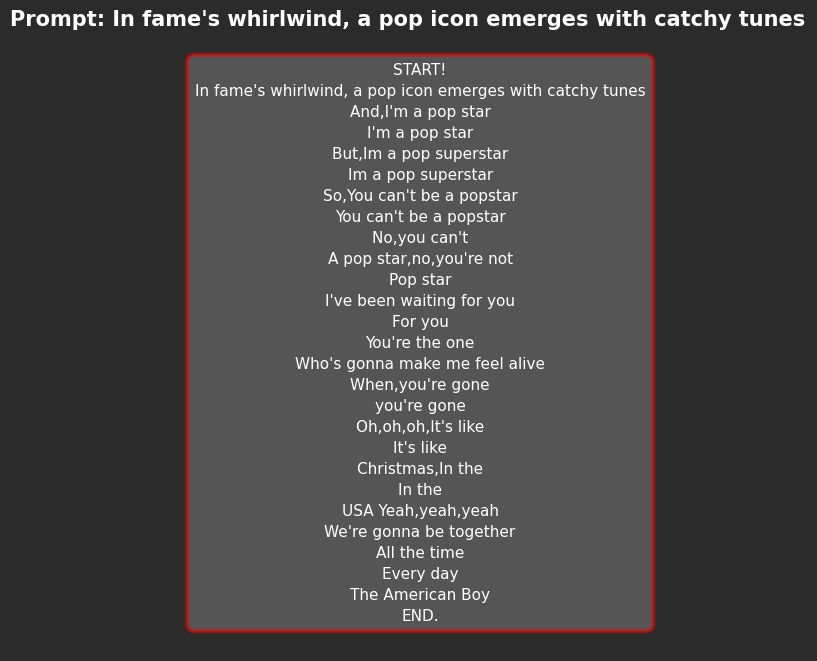

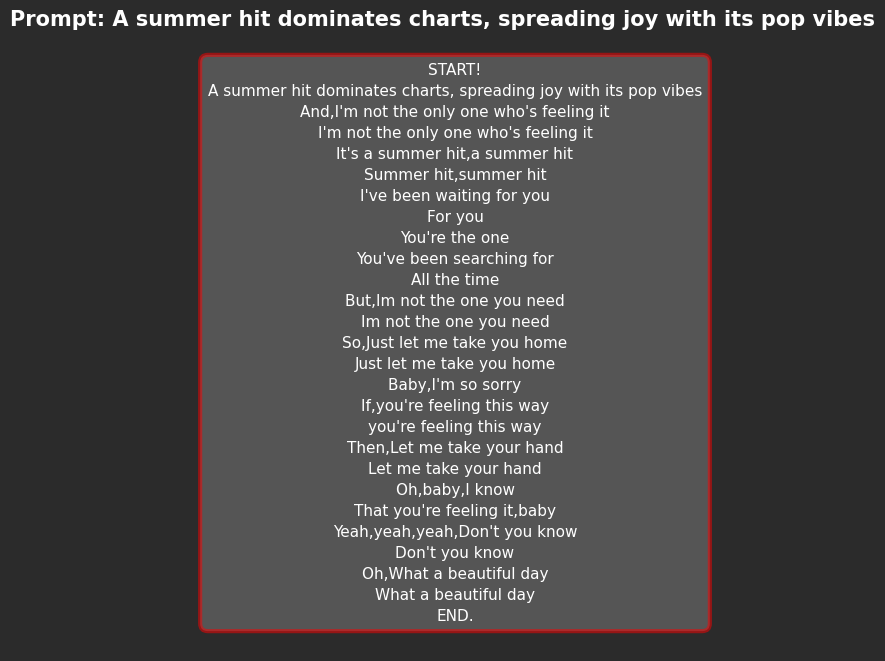

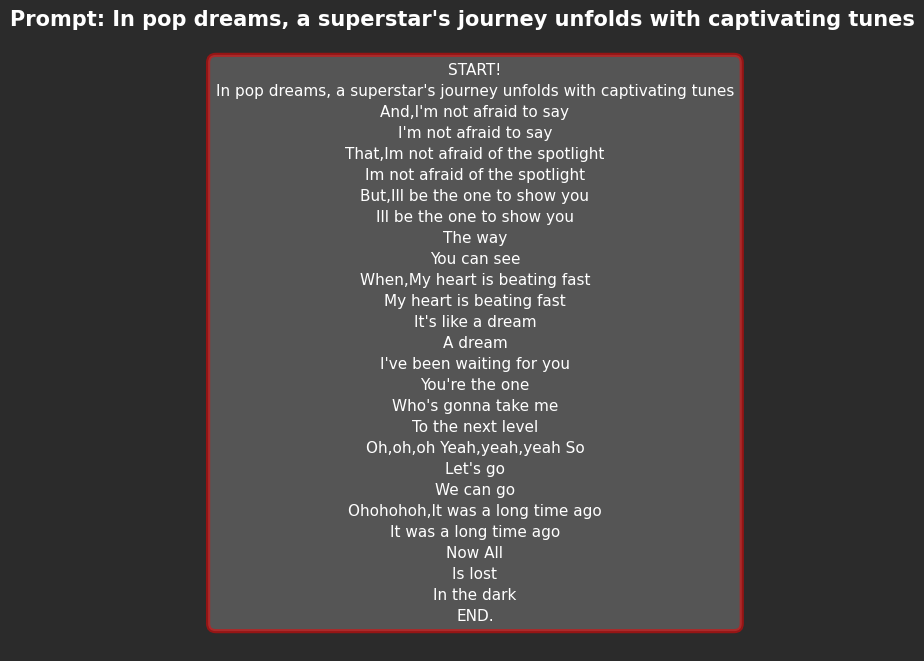

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

#### ARTIST SPECIFIC LYRIC GENERATION

In [ ]:
prompts = [
    "A pop sensation reigns supreme with infectious beats and melodies",
    "A rising star captivates hearts with irresistible pop melodies",
    "In fame's whirlwind, a pop icon emerges with catchy tunes",
    "A summer hit dominates charts, spreading joy with its pop vibes",
    "In pop dreams, a superstar's journey unfolds with captivating tunes"
]

In [ ]:
# Initializing the GPT2 Model
model = TFAutoModelForCausalLM.from_pretrained("gpt2", max_length=512)

##### Artist : Taylor_Swift

In [ ]:
genre = 'Pop'
artist = 'Taylor_Swift'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generati

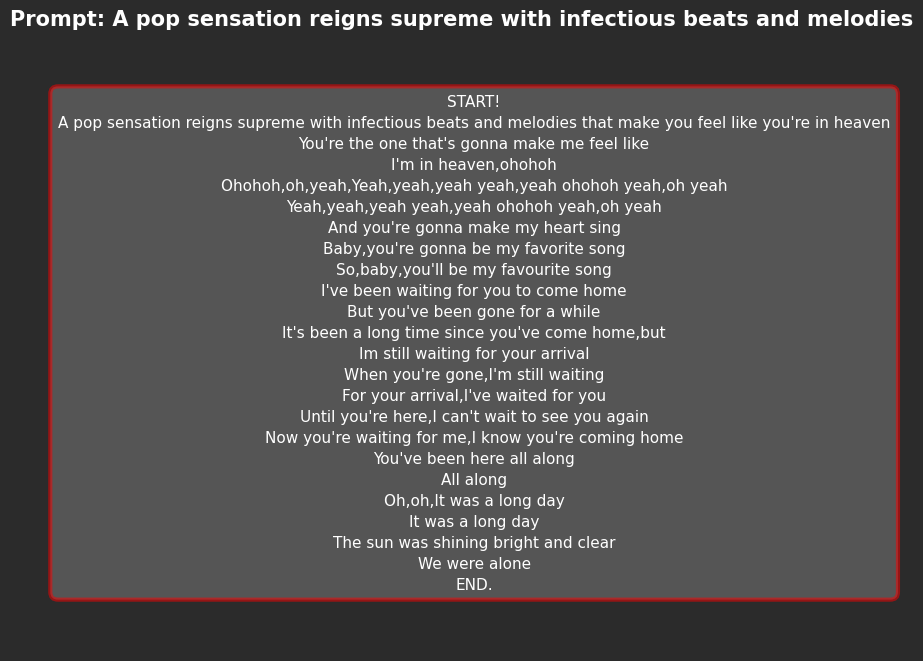

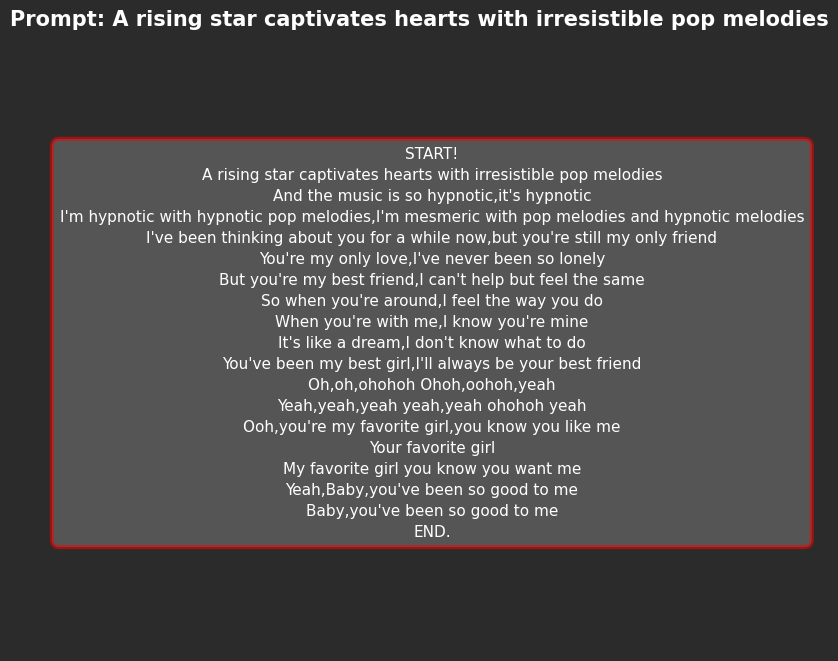

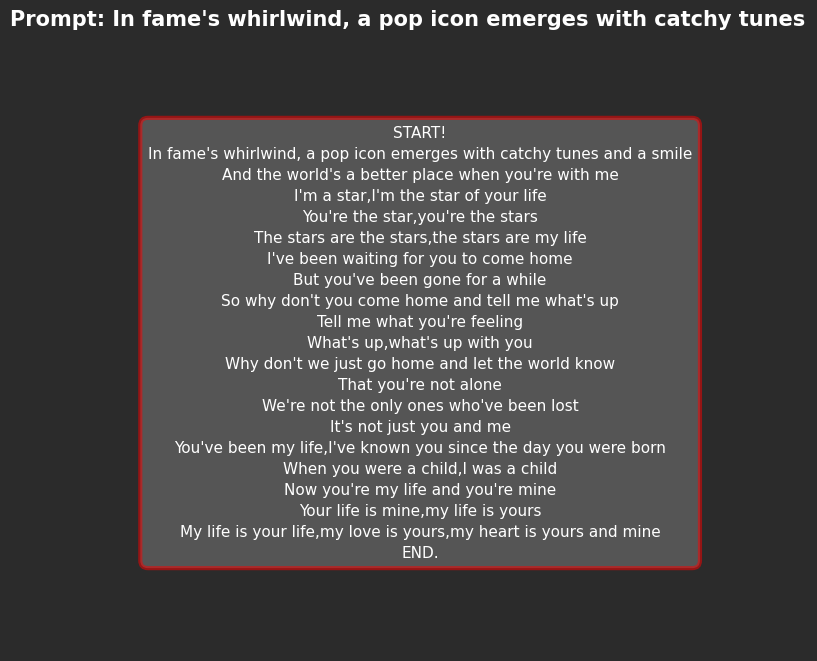

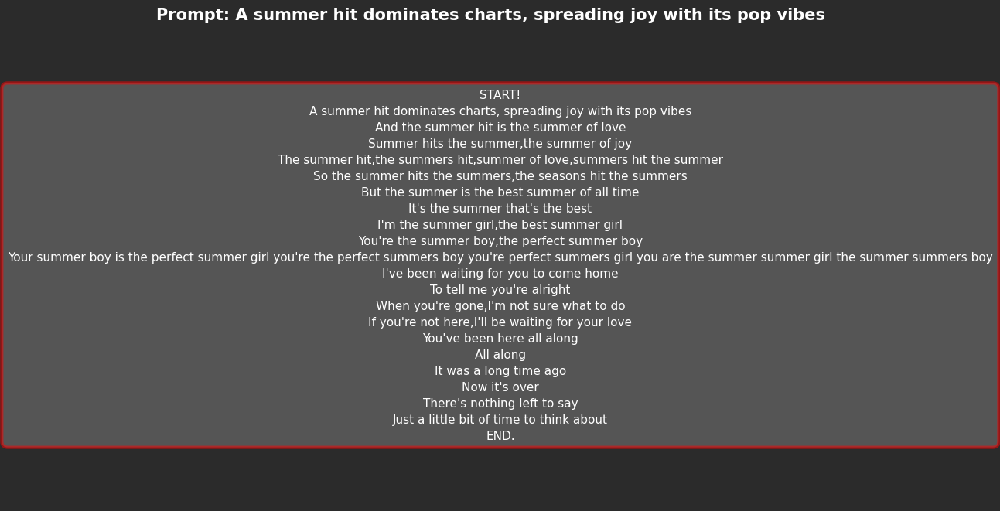

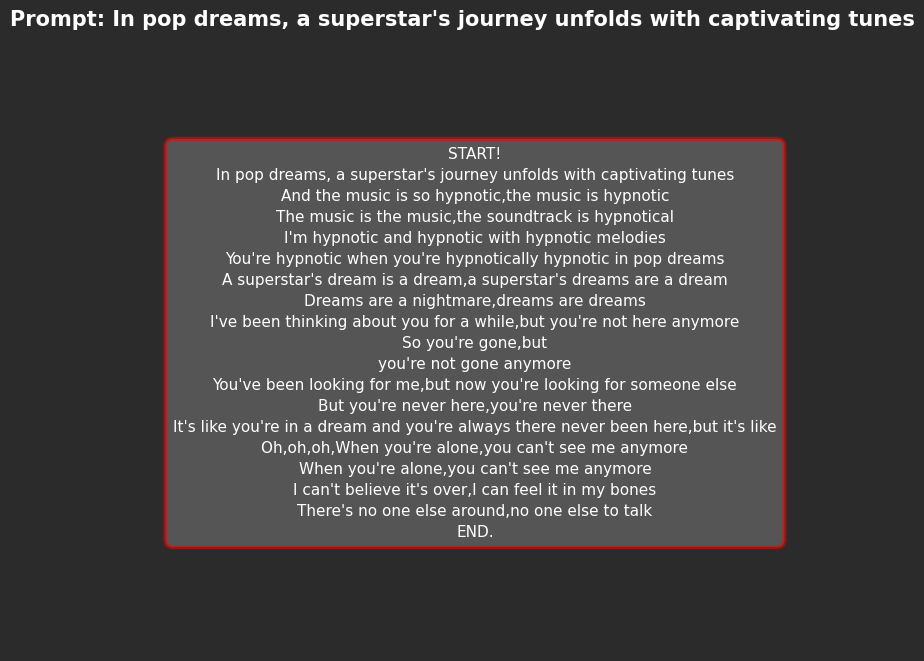

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Ariana_Grande

In [ ]:
genre = 'Pop'
artist = 'Ariana_Grande'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generati

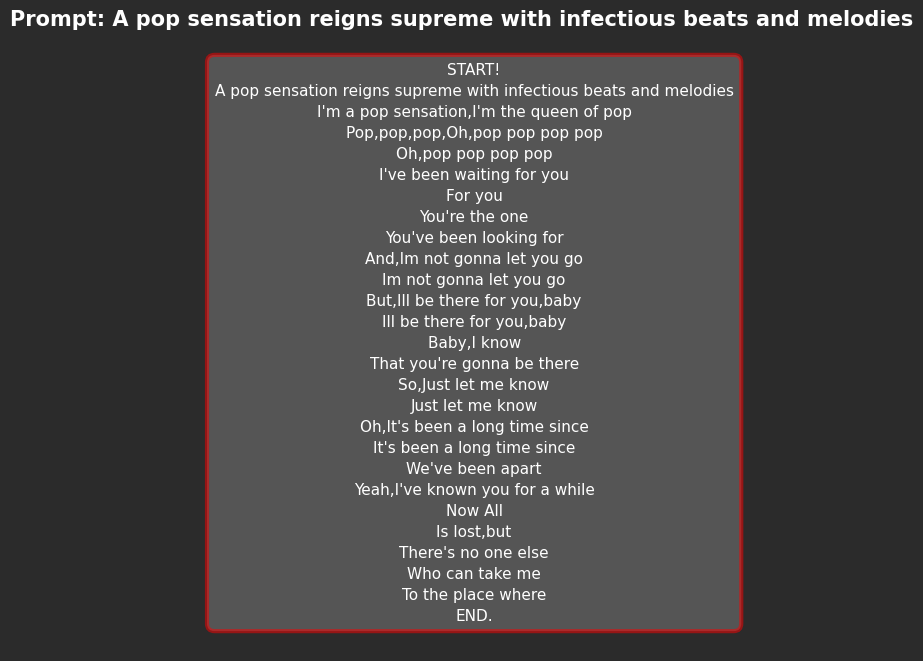

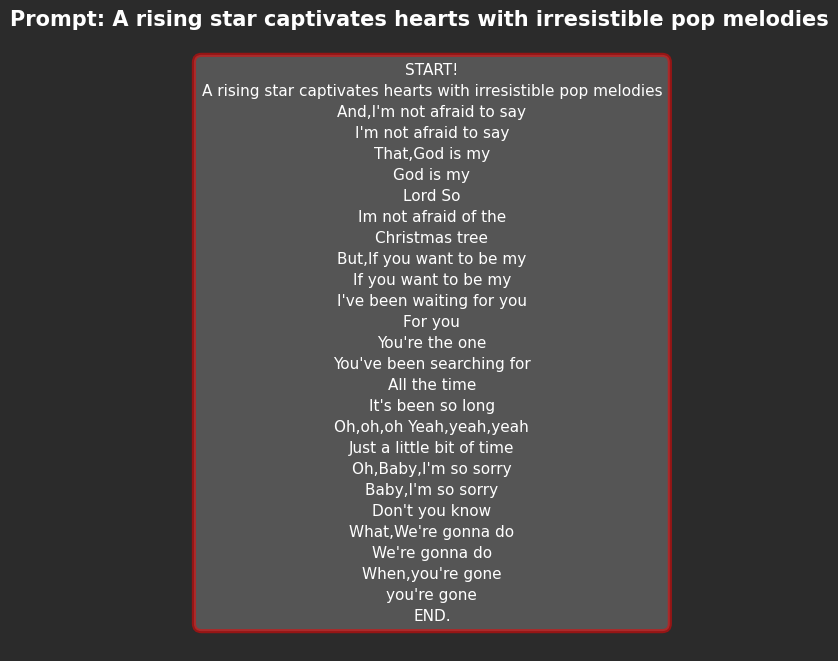

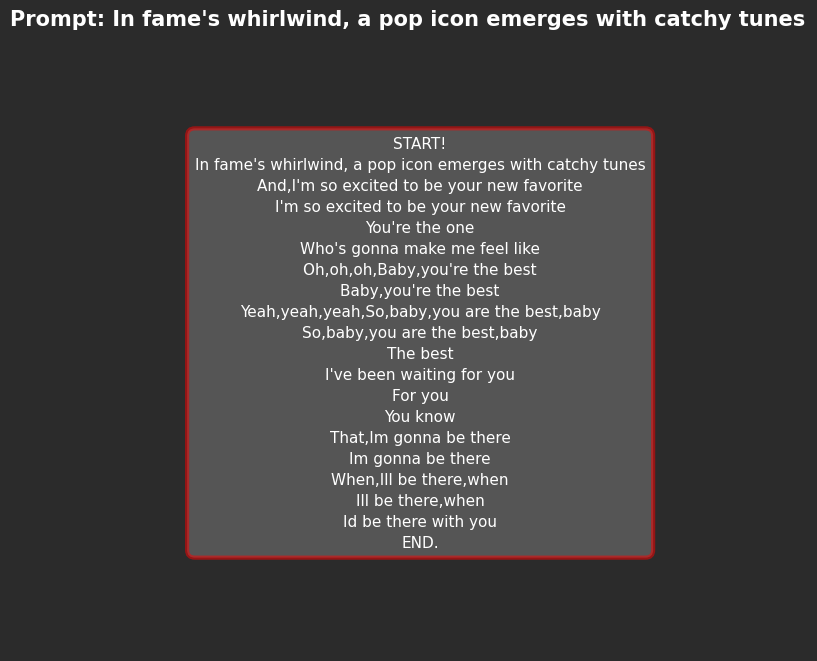

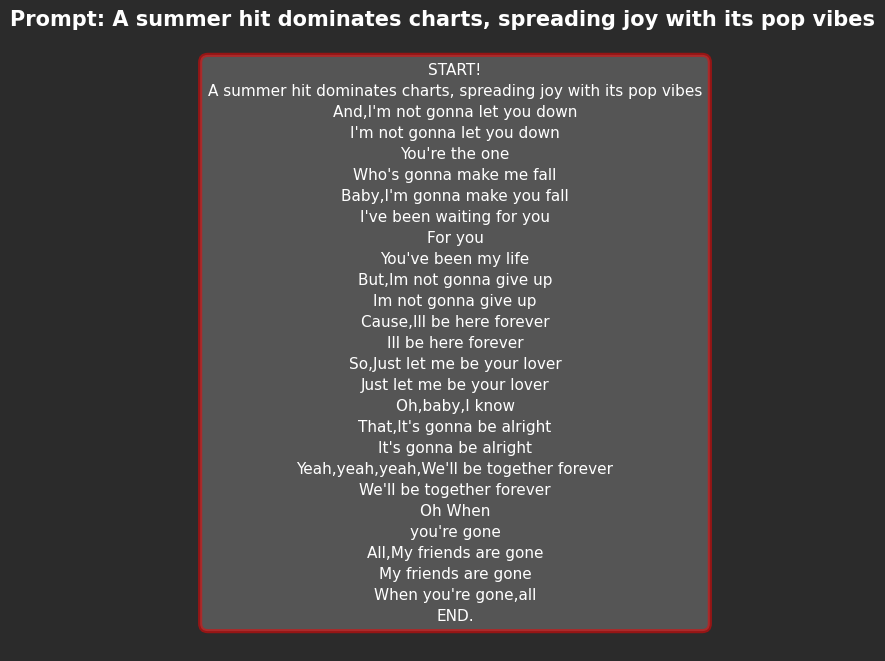

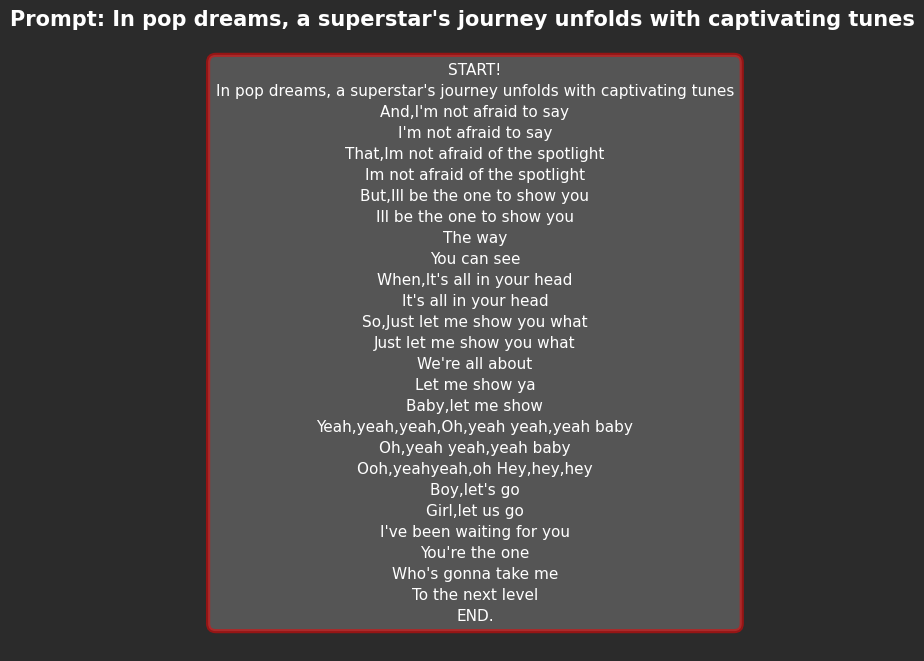

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Rihanna


In [ ]:
genre = 'Pop'
artist = 'Rihanna'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generati

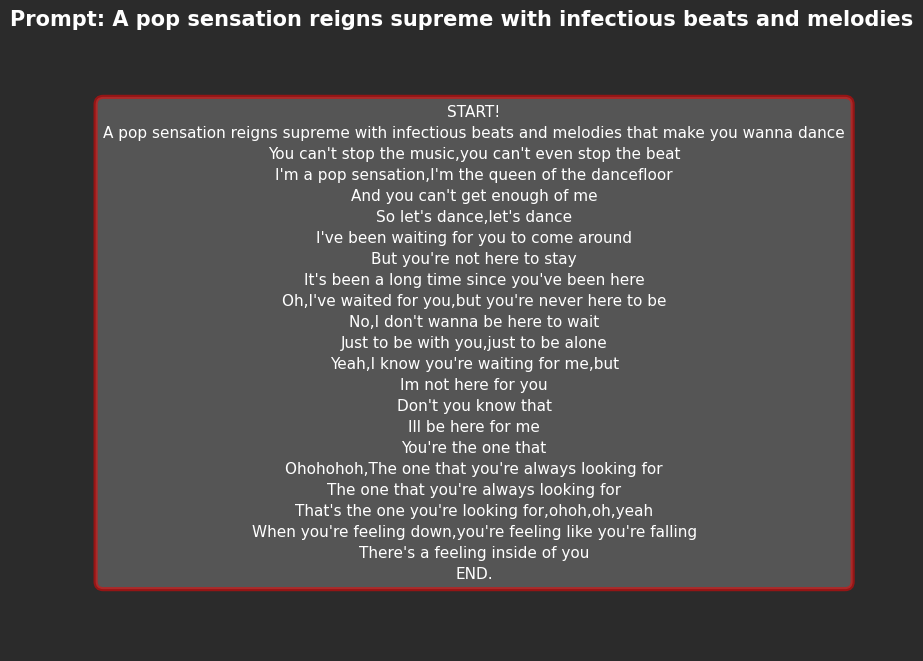

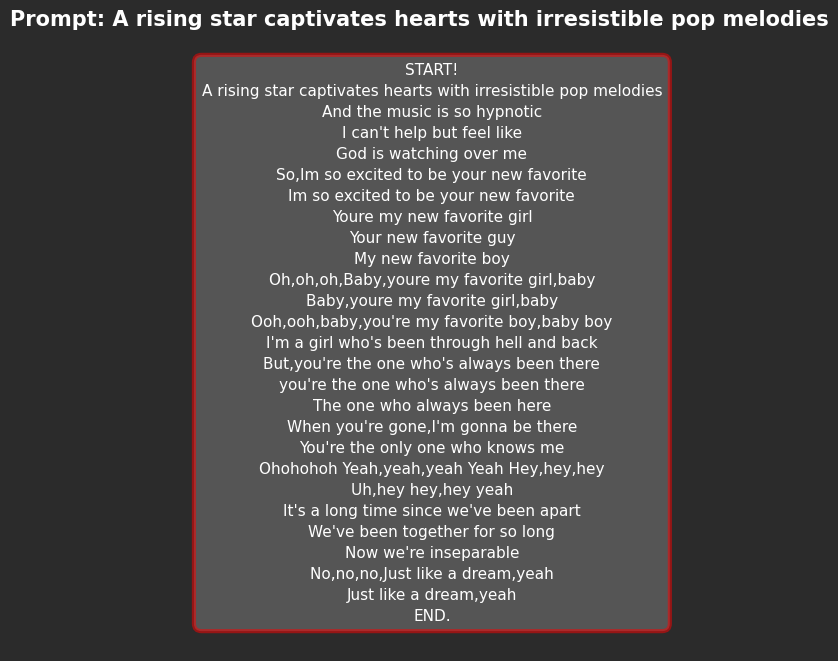

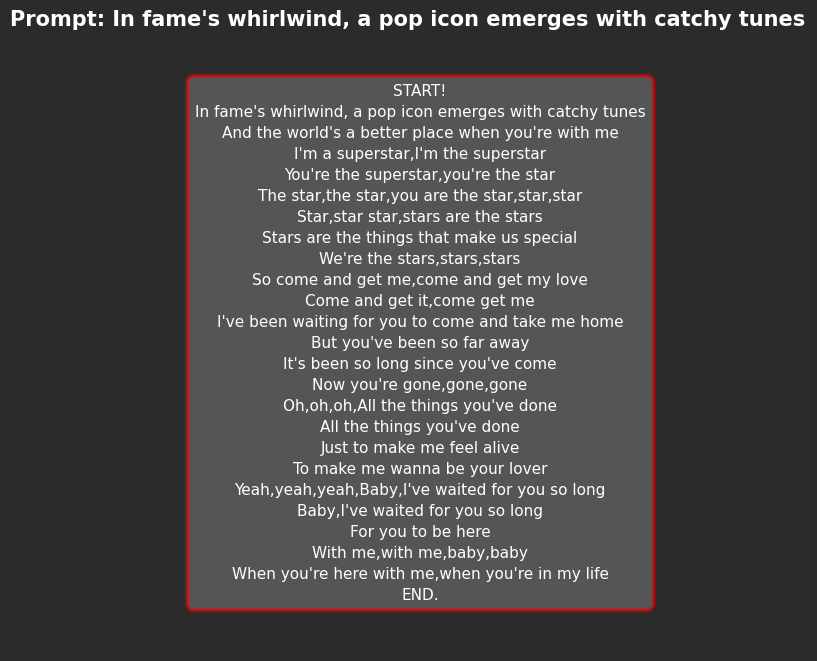

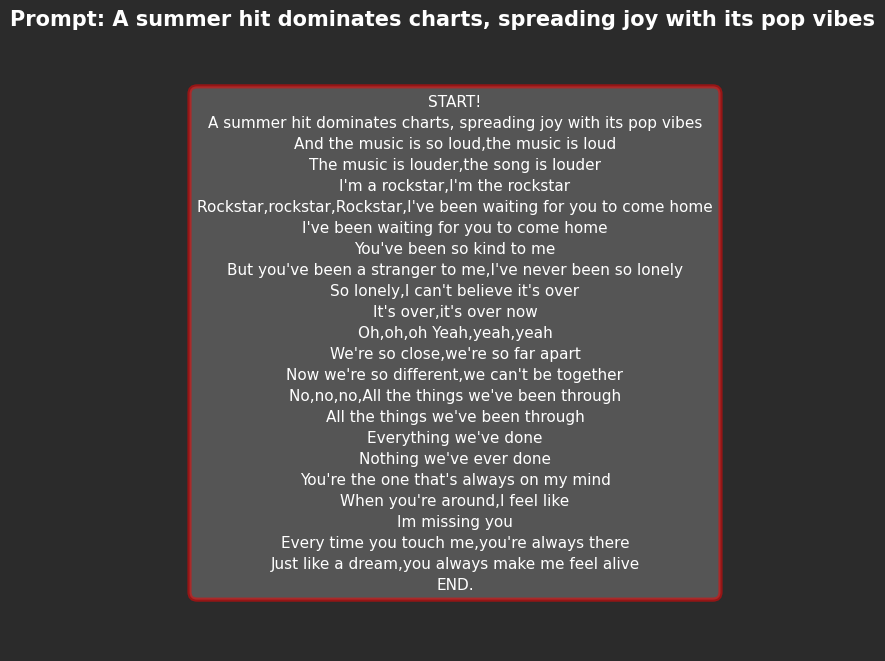

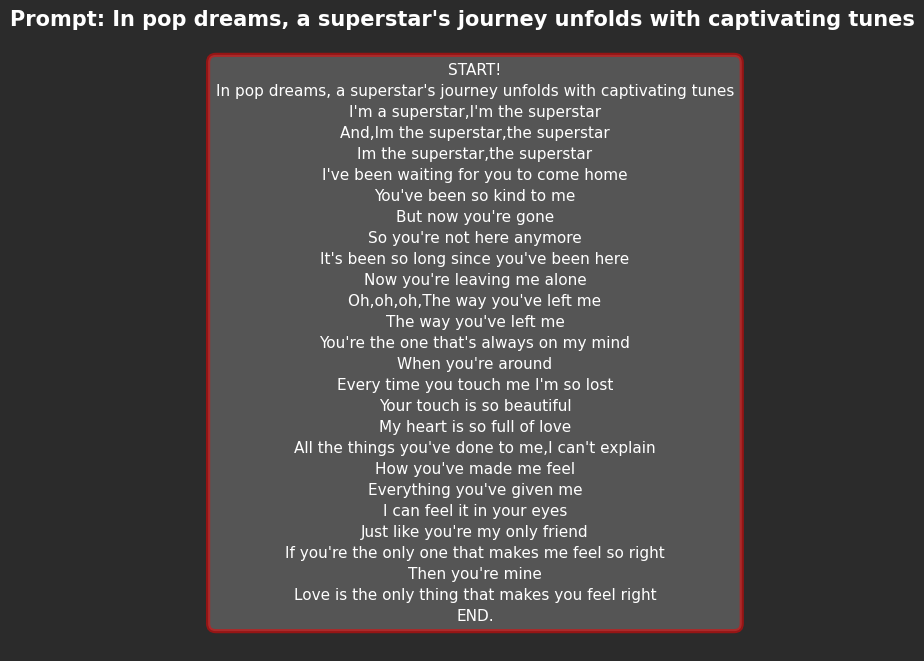

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Ed_Sheeran

In [ ]:
genre = 'Pop'
artist = 'Ed_Sheeran'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generati

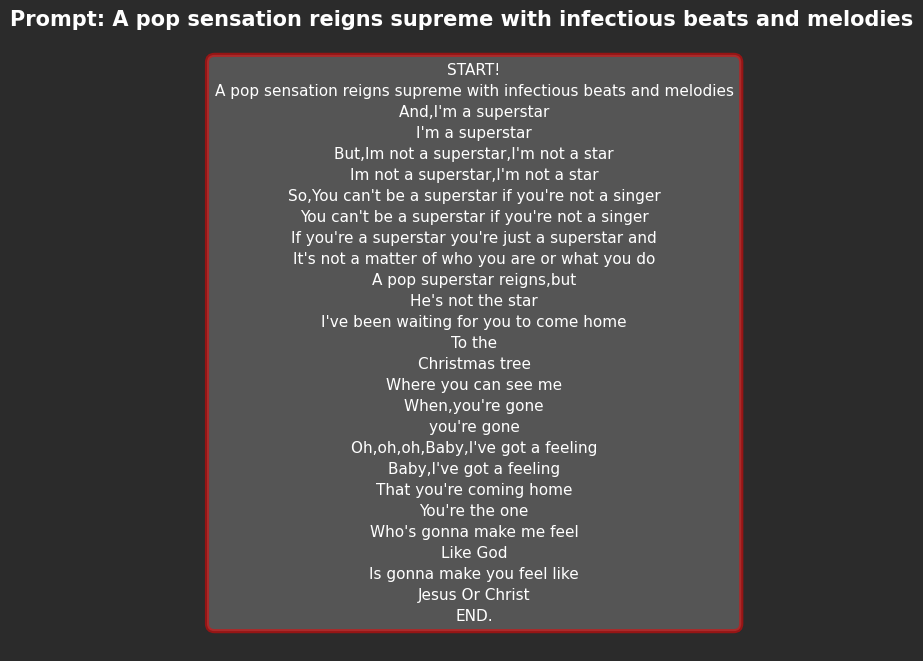

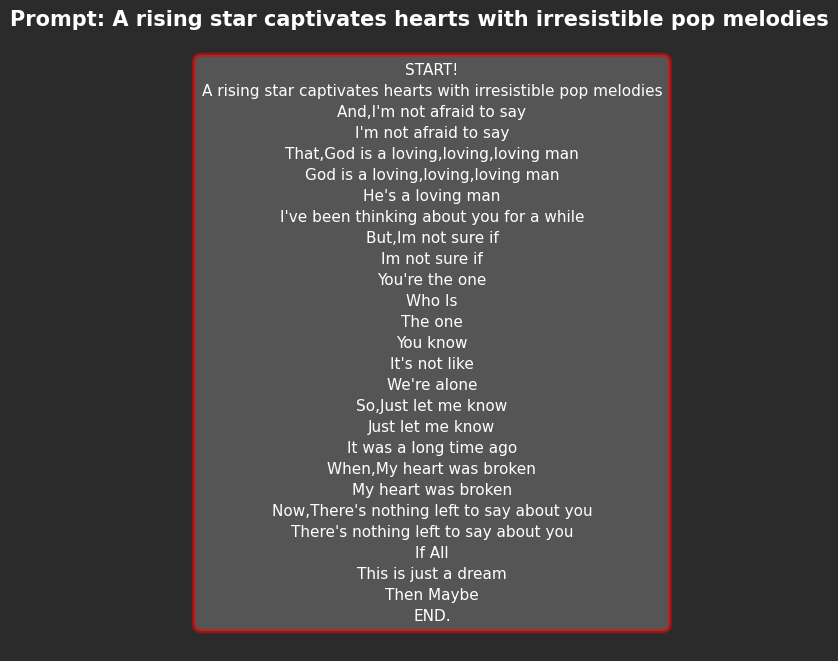

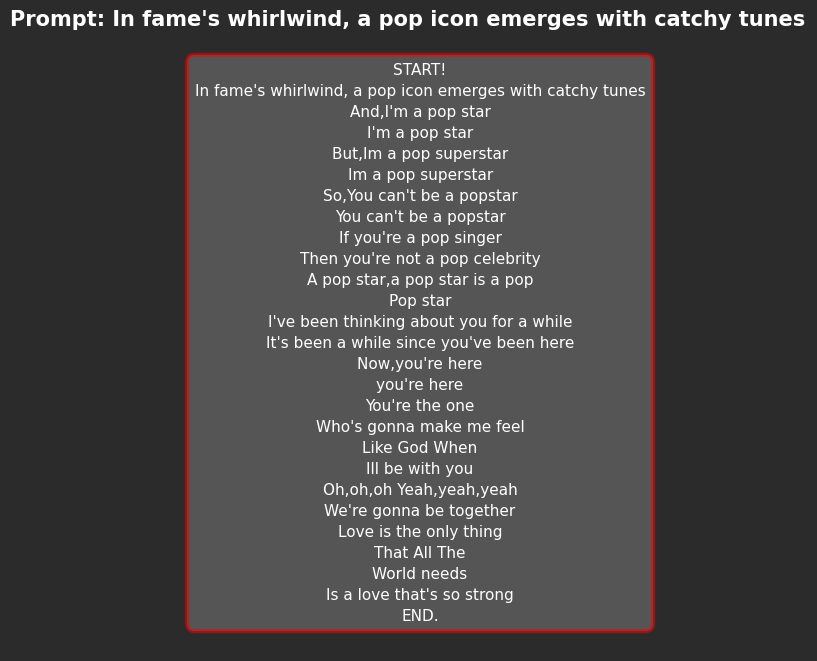

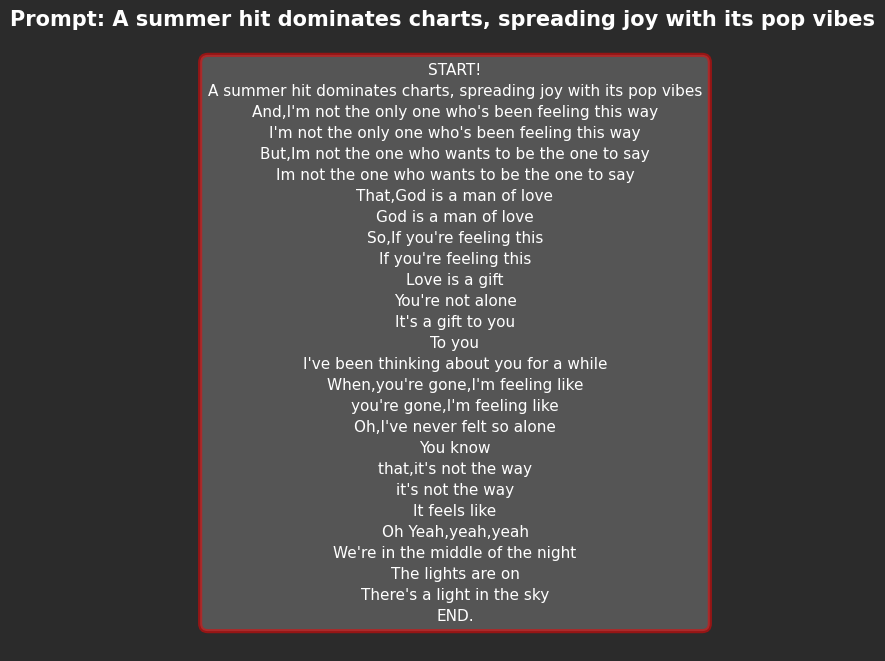

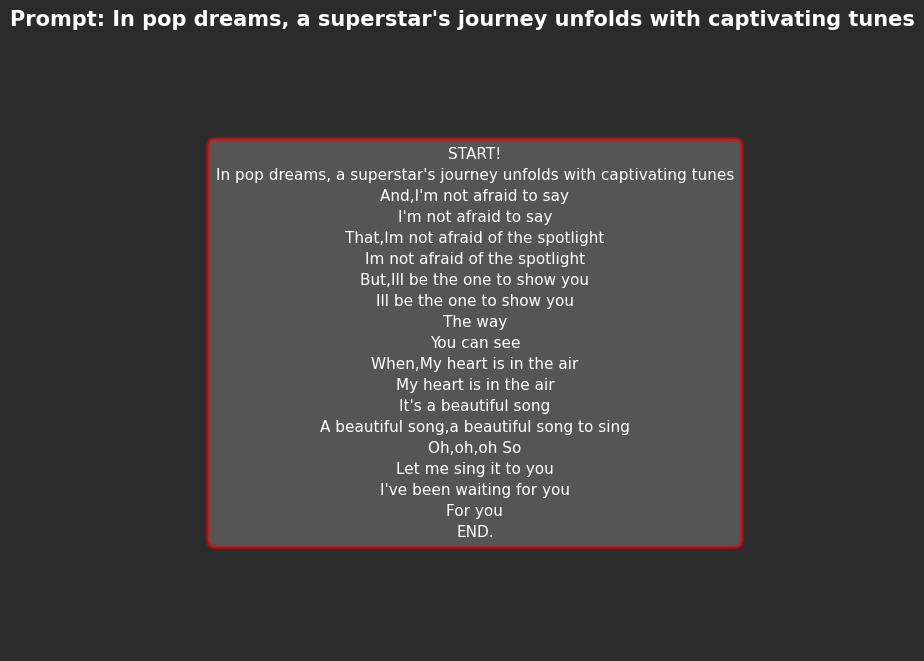

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Lana_Del_Rey

In [ ]:
genre = 'Pop'
artist = 'Lana_Del_Rey'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generati

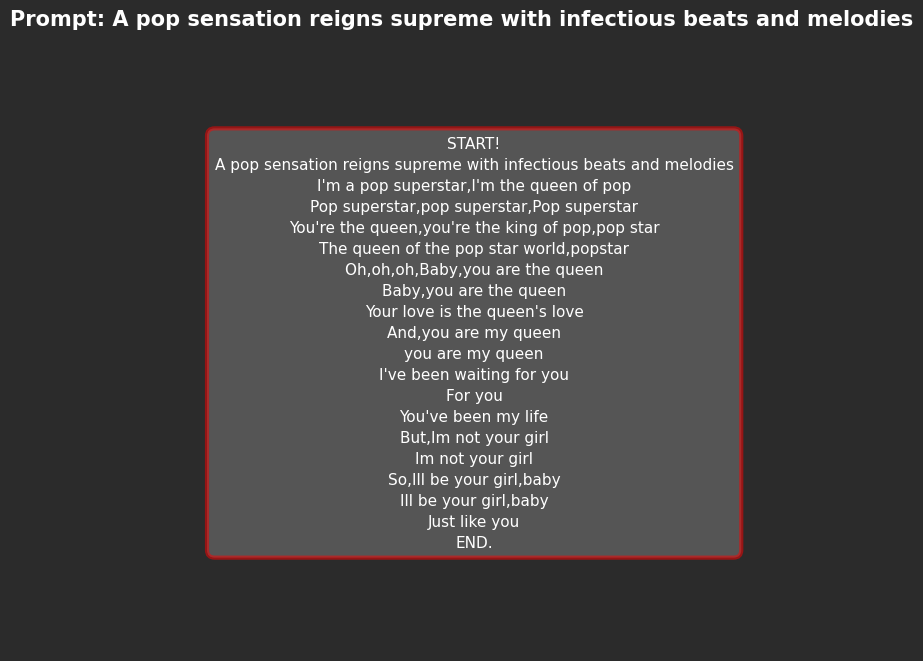

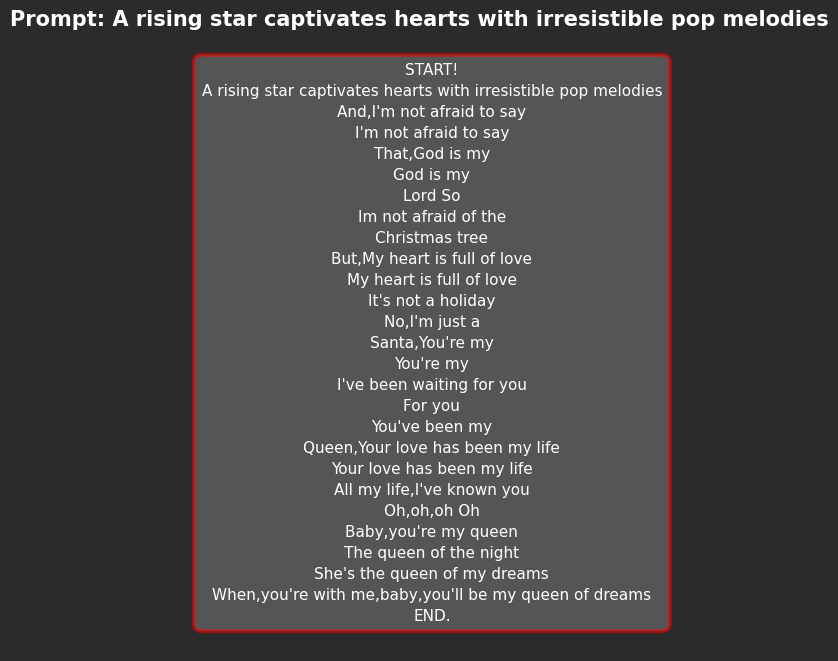

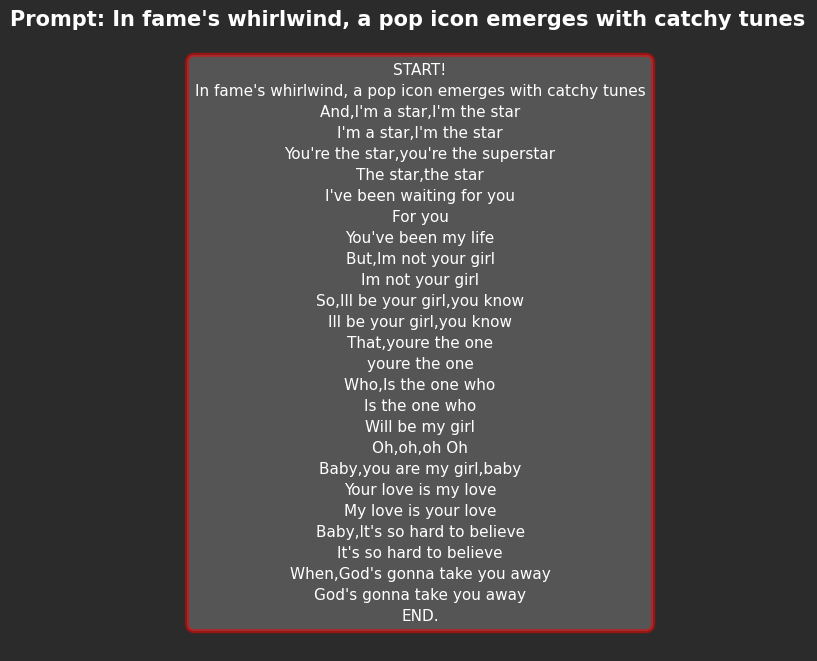

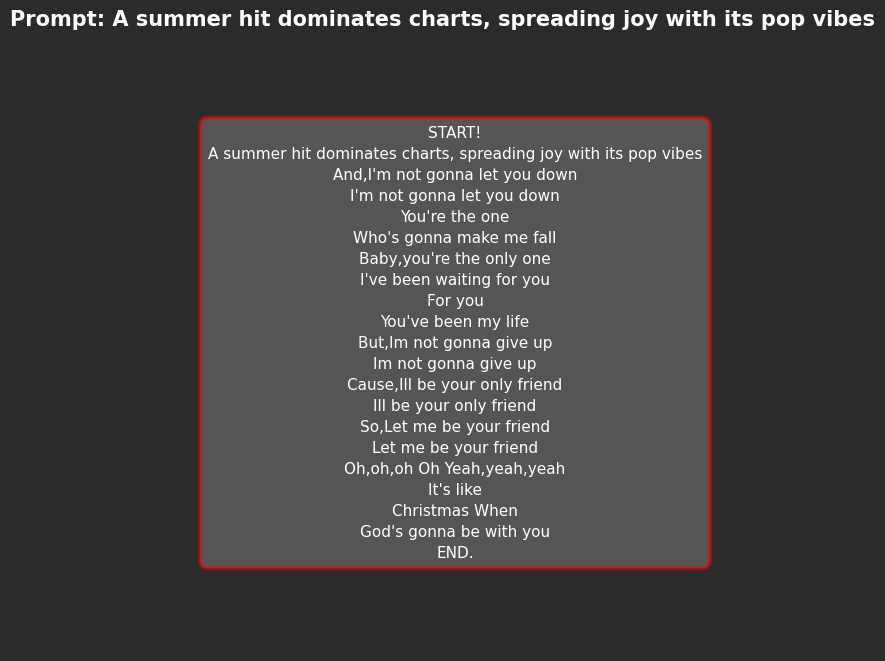

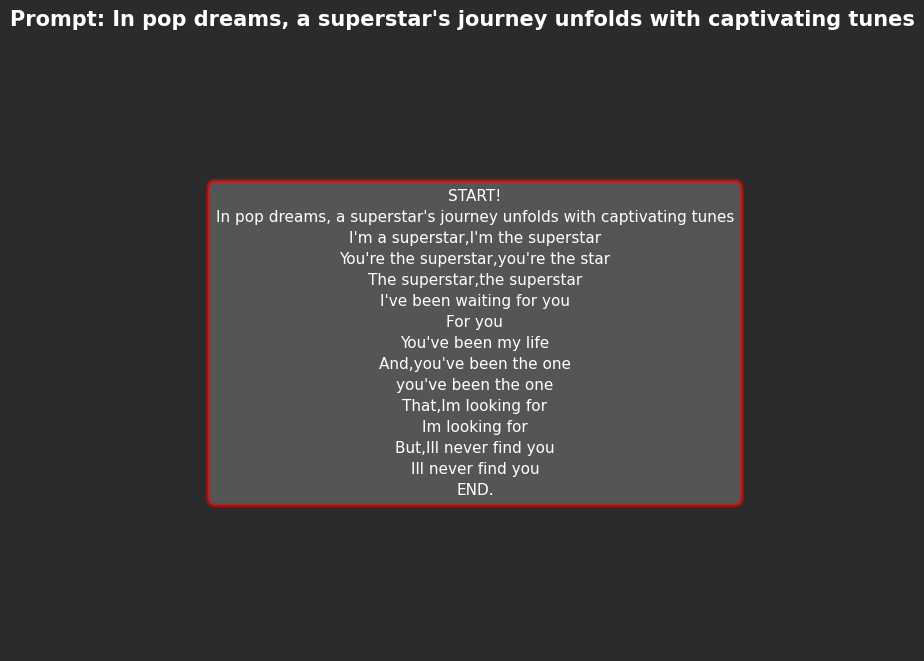

[None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

### GENRE : Rap


In [ ]:
prompts = [
    "This is a message to all my haters",
    "Next time you see a brother down",
    "Life without dreaming is a life without meaning",
    "The purpose of life is a life with a purpose",
    "You've got to realize that the world's a test",
    "My whole thing is to inspire",
]

genre = 'Rap'

# Getting the saved trained model weights for genre 'RB'
model = TFAutoModelForCausalLM.from_pretrained("gpt2", max_length=512)
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Genre Models/{genre}_model_weights.h5"
model.load_weights(path)

# # GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer ,max_length = 300)

# # Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]

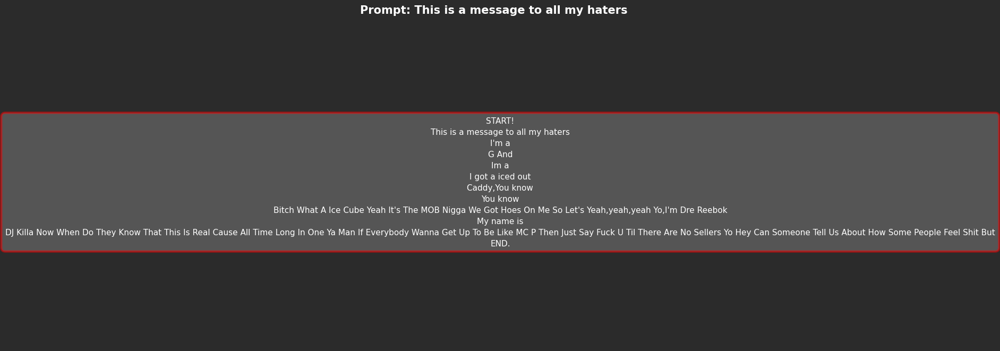

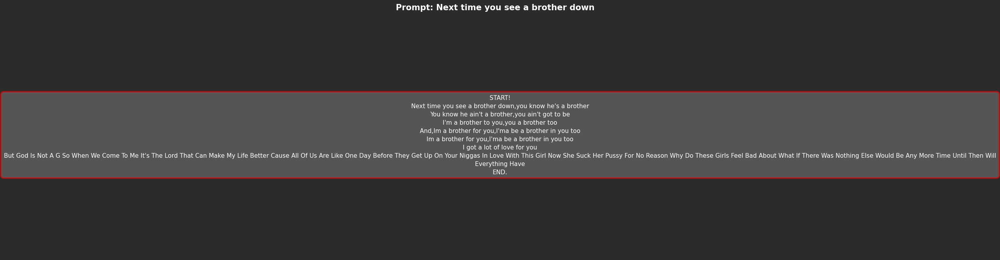

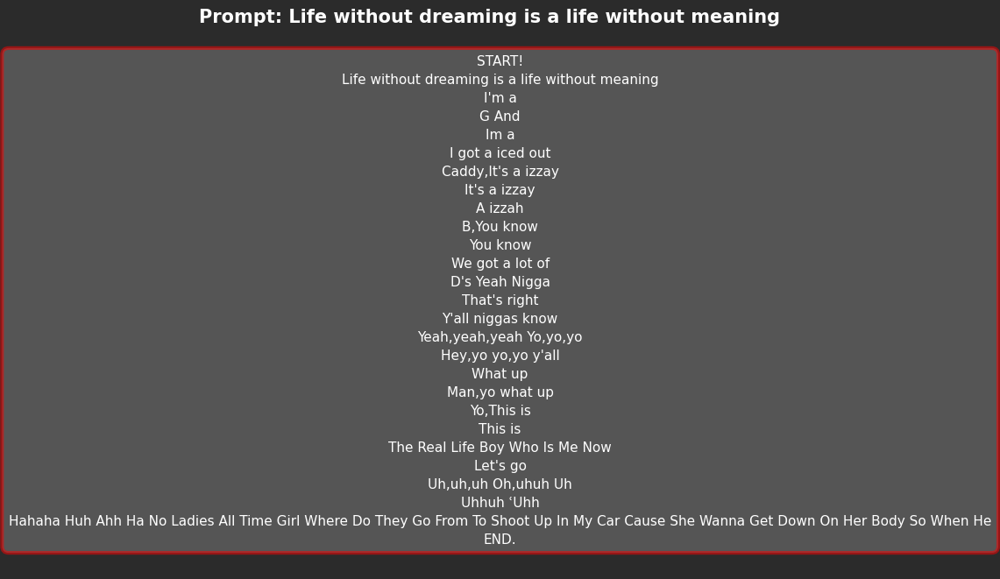

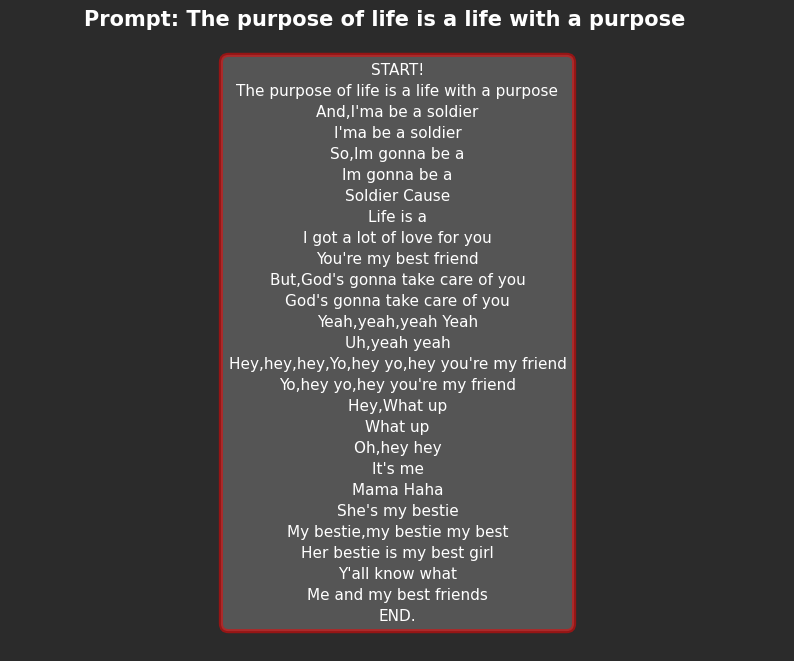

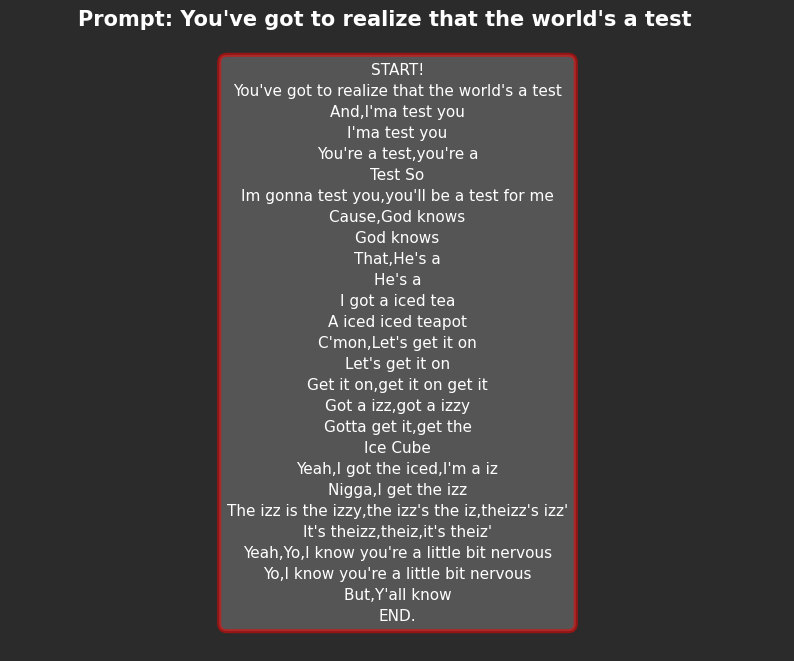

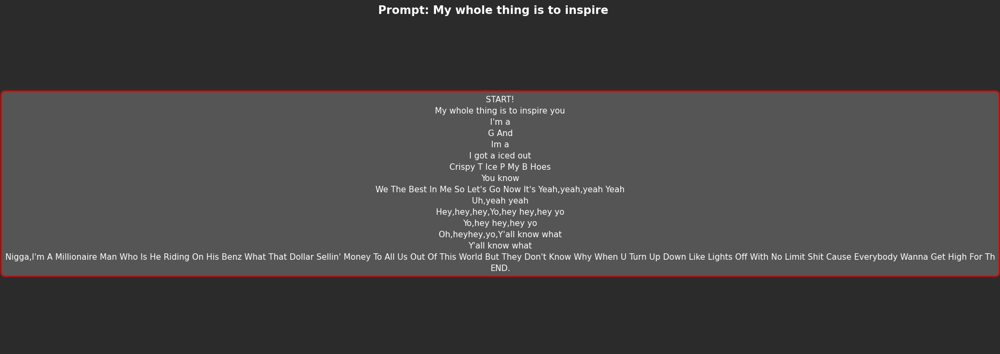

[None, None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

#### ARTIST SPECIFIC LYRIC GENERATION

In [ ]:
prompts = [
    "This is a message to all my haters",
    "Next time you see a brother down",
    "Life without dreaming is a life without meaning",
    "The purpose of life is a life with a purpose",
    "You've got to realize that the world's a test",
    "My whole thing is to inspire",
]

In [ ]:
# Initializing the GPT2 Model
model = TFAutoModelForCausalLM.from_pretrained("gpt2", max_length=512)


##### Artist : Nicki_Minaj

In [ ]:
genre = 'Rap'
artist = 'Nicki_Minaj'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


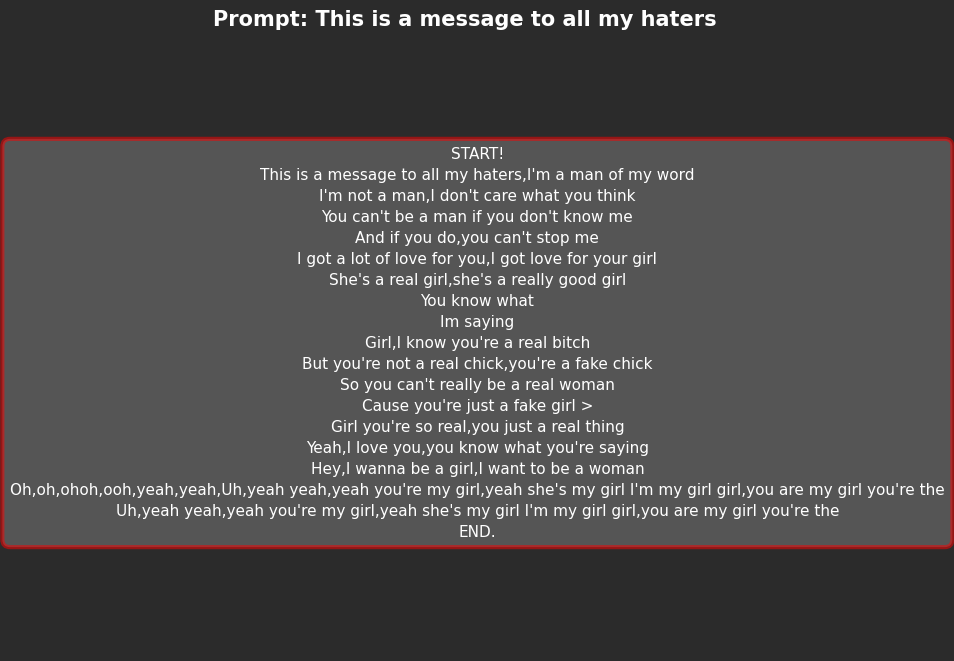

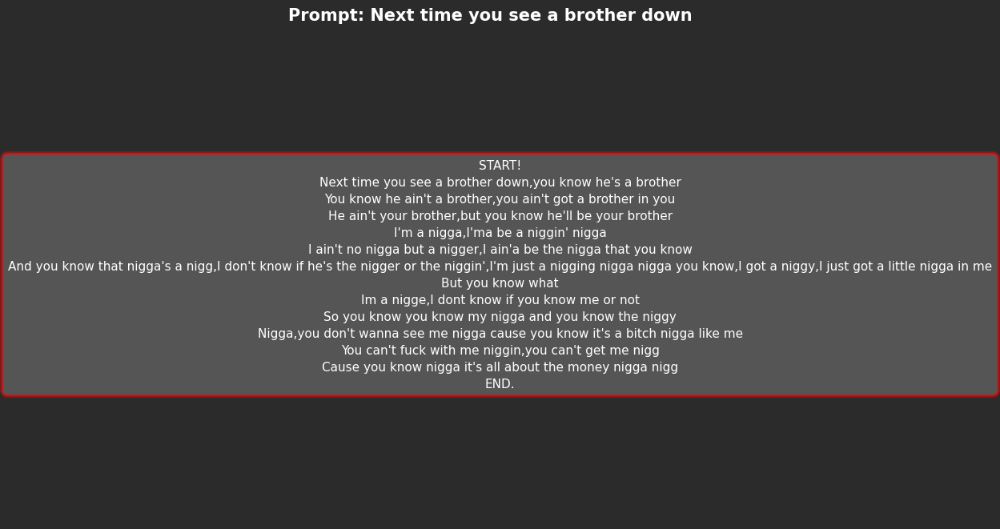

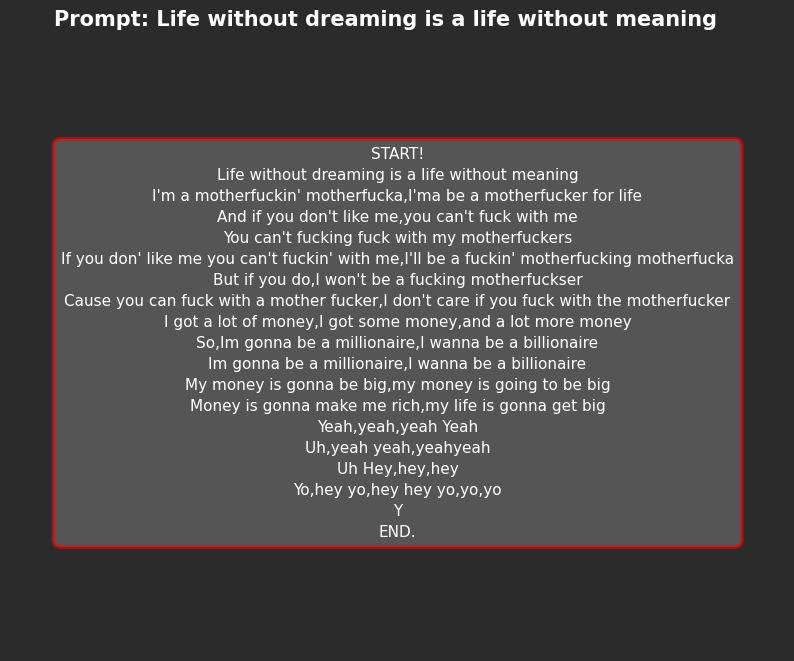

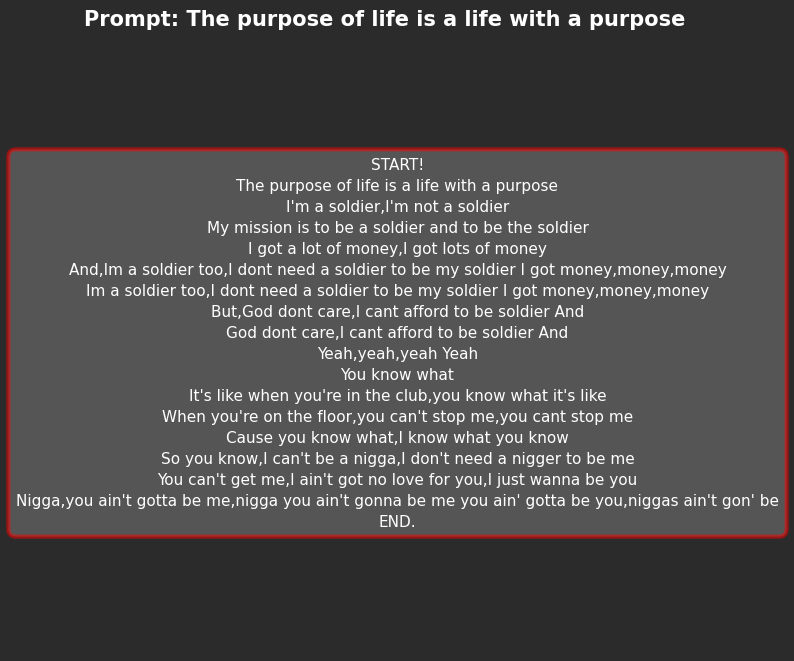

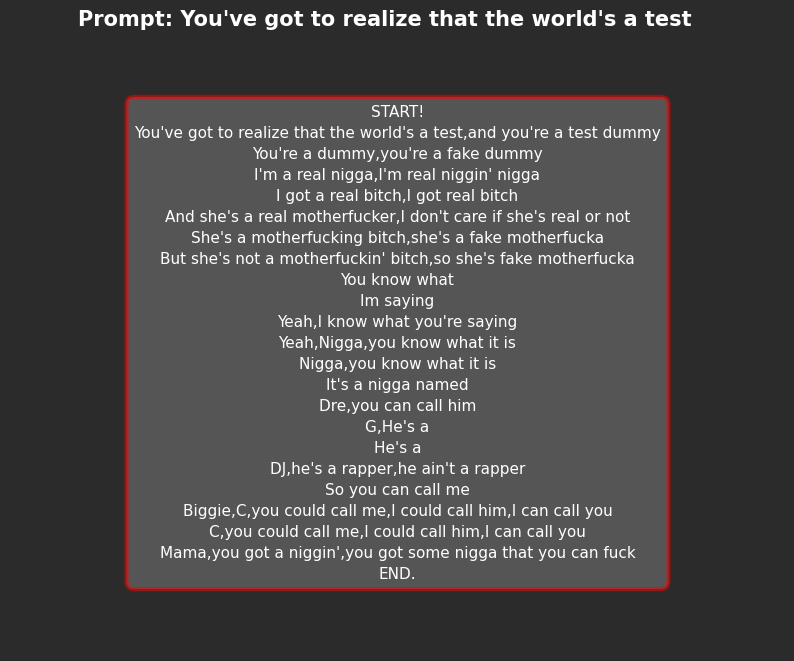

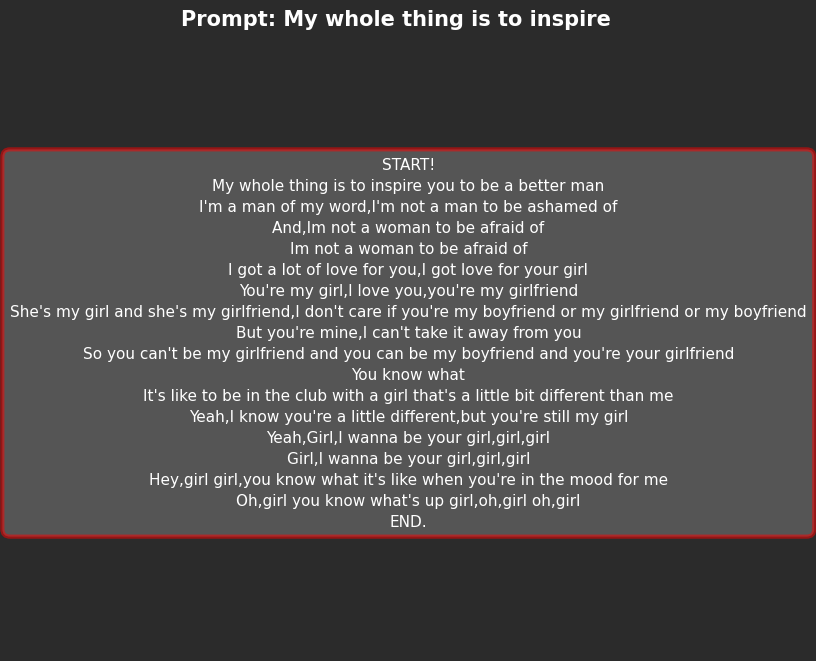

[None, None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Drake

In [ ]:
genre = 'Rap'
artist = 'Drake'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generati

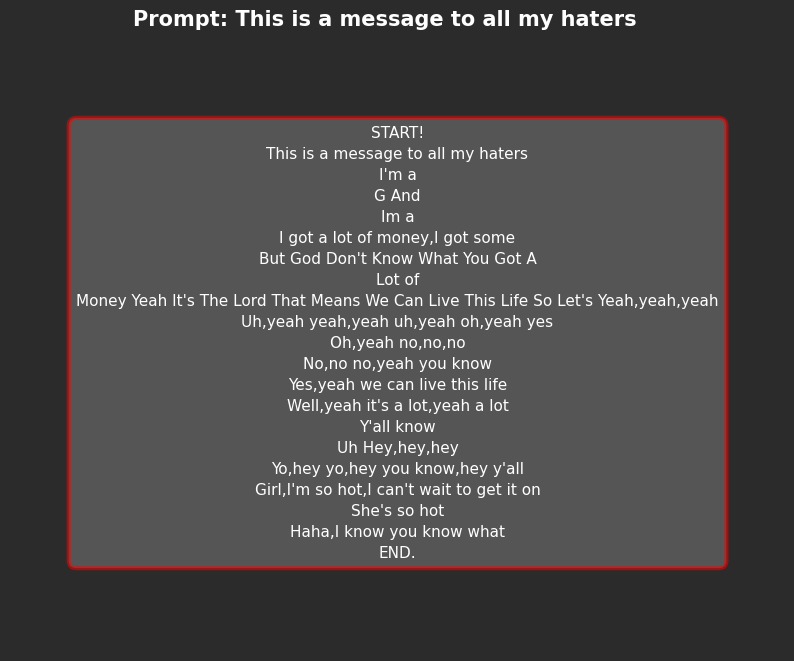

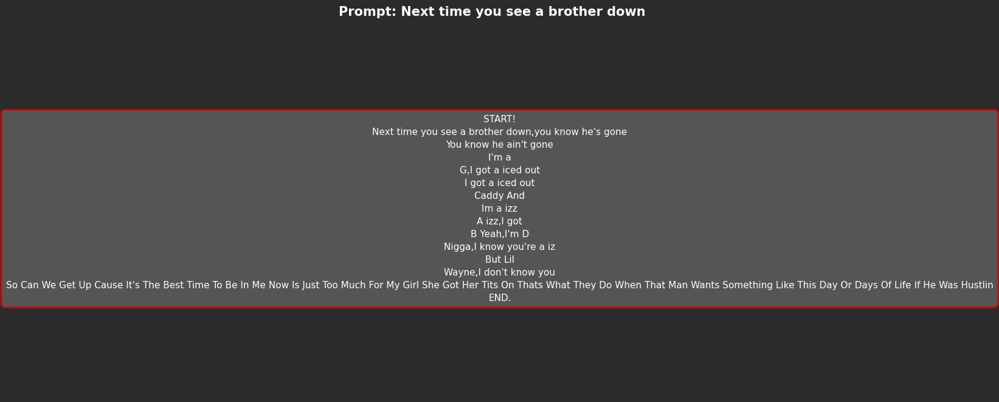

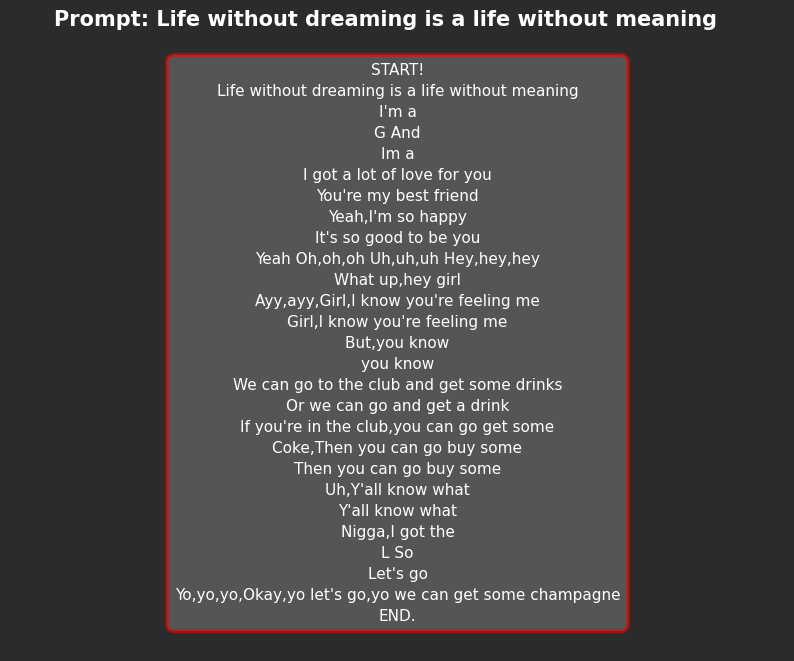

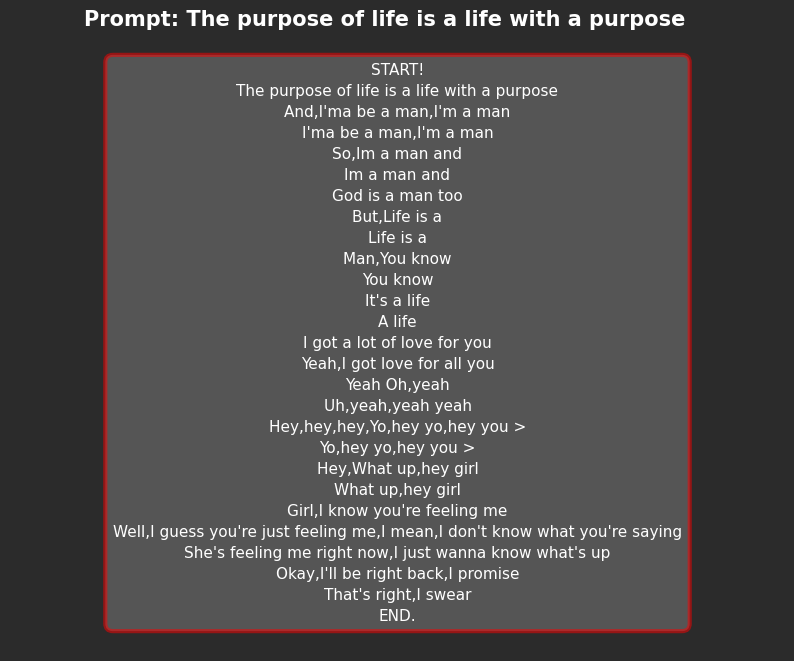

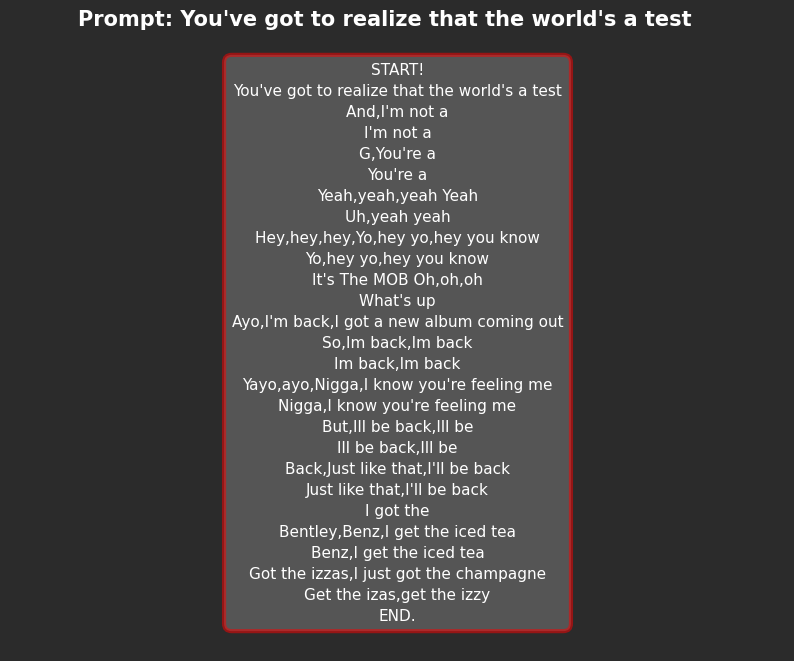

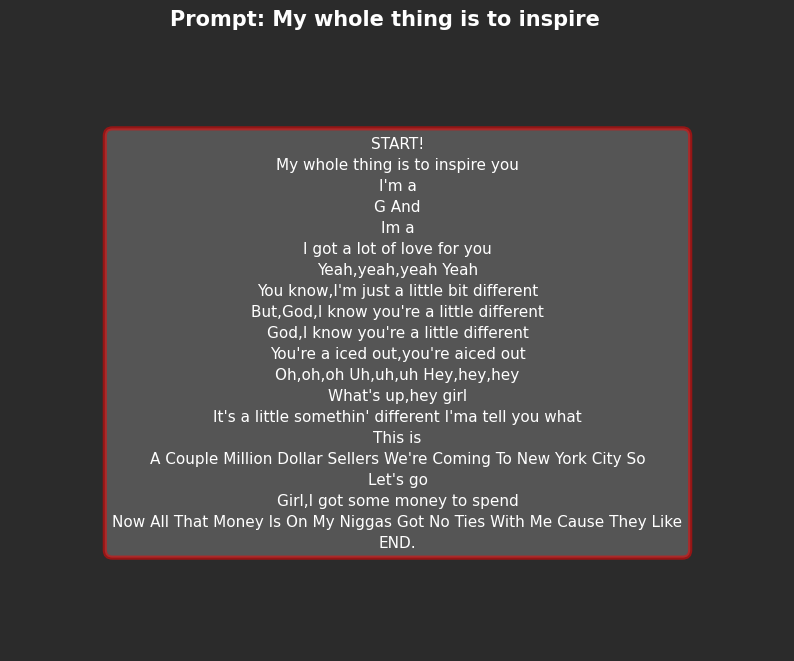

[None, None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Eminem

In [ ]:
genre = 'Rap'
artist = 'Eminem'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


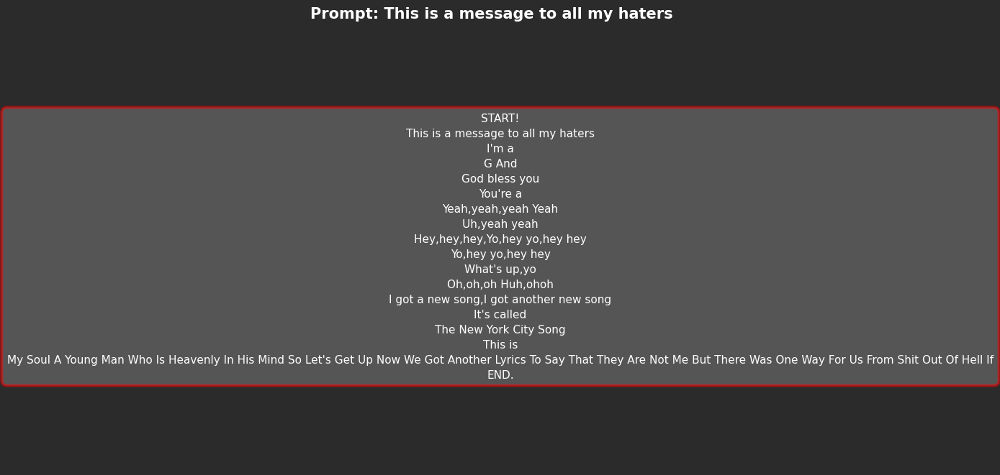

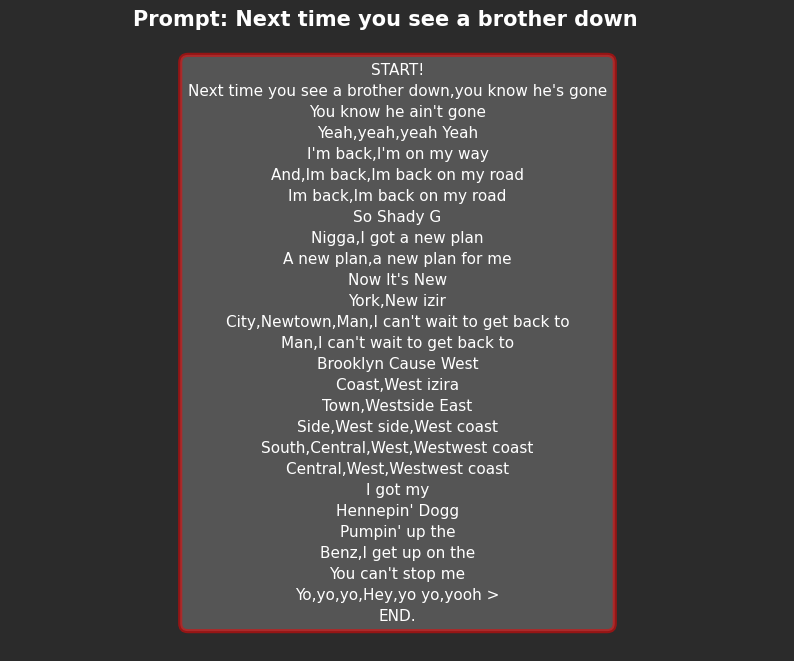

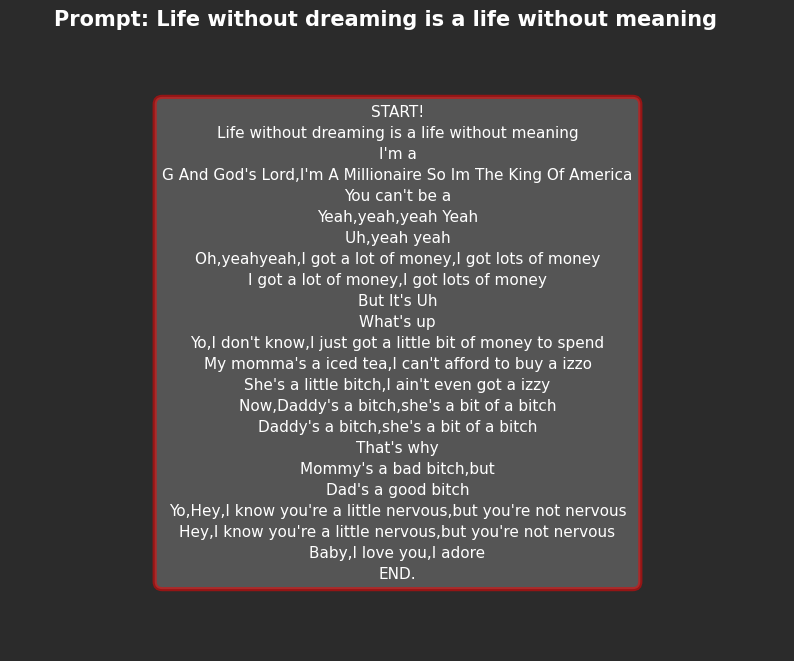

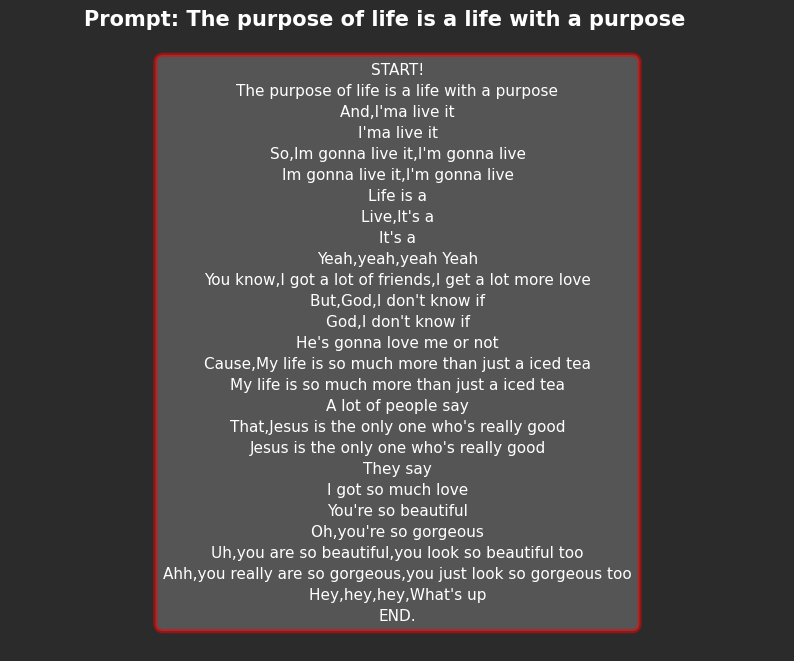

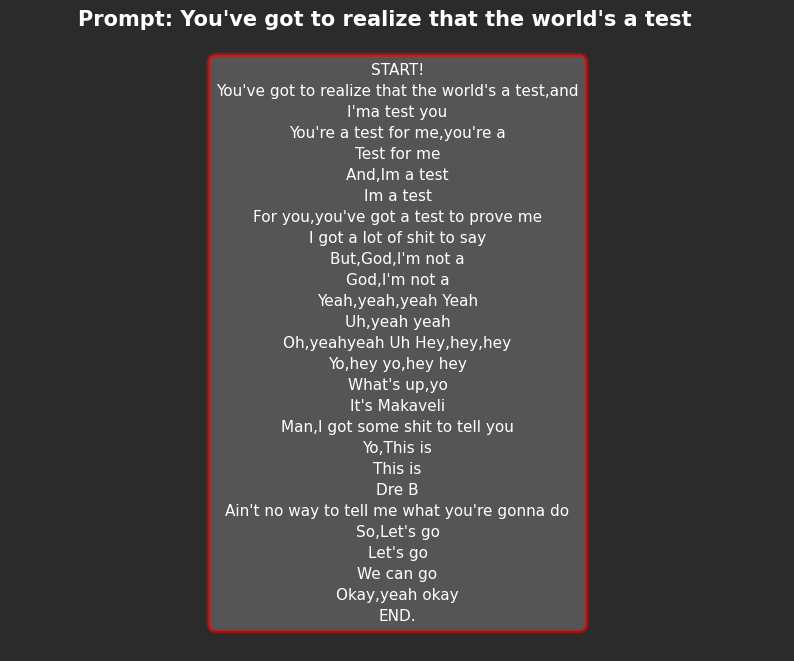

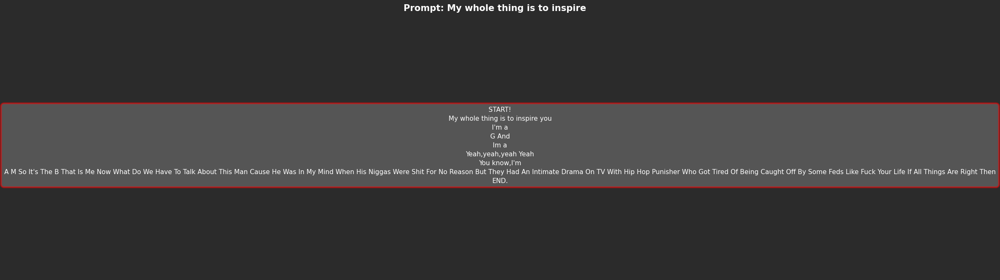

[None, None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Kanye_West


In [ ]:
genre = 'Rap'
artist = 'Kanye_West'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


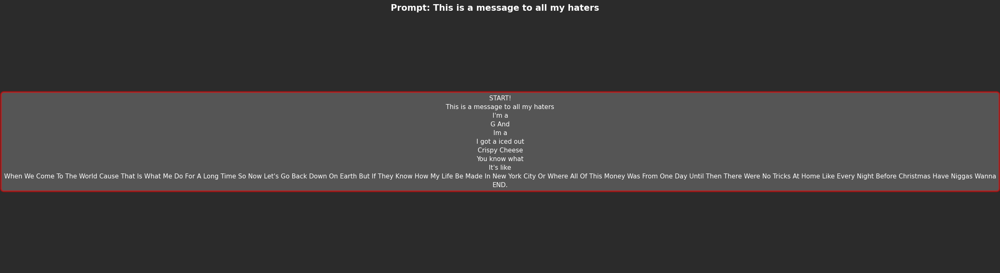

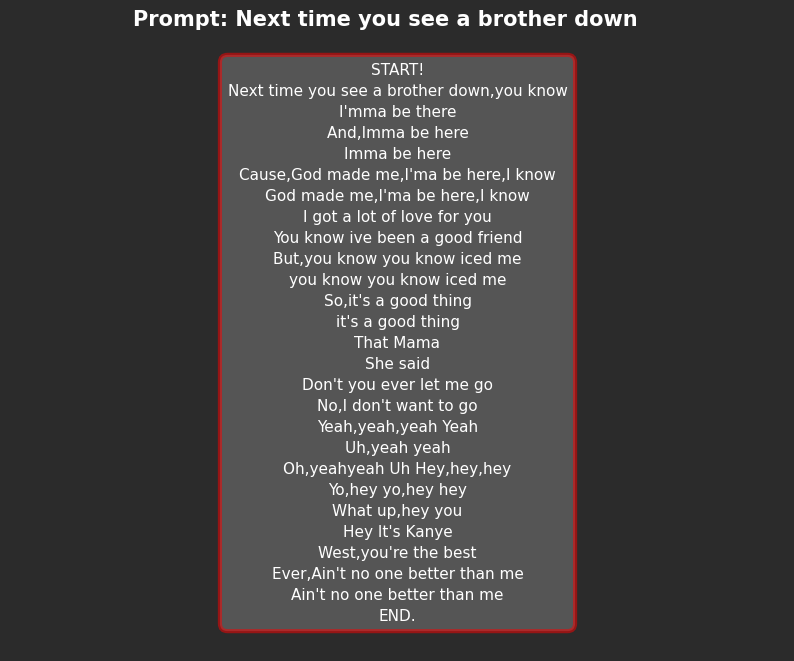

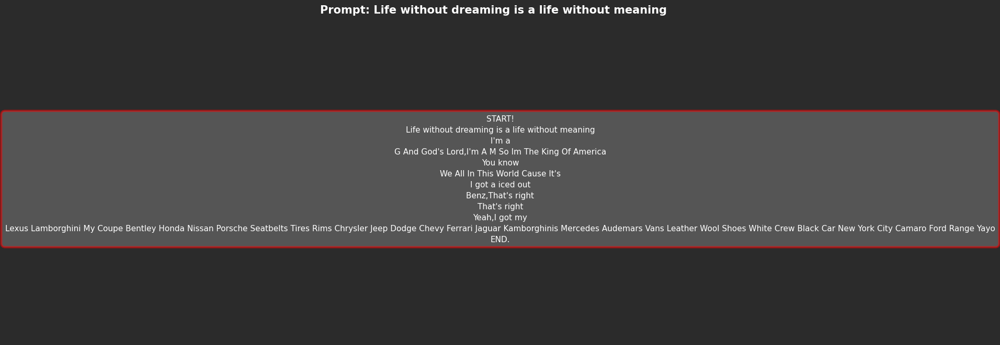

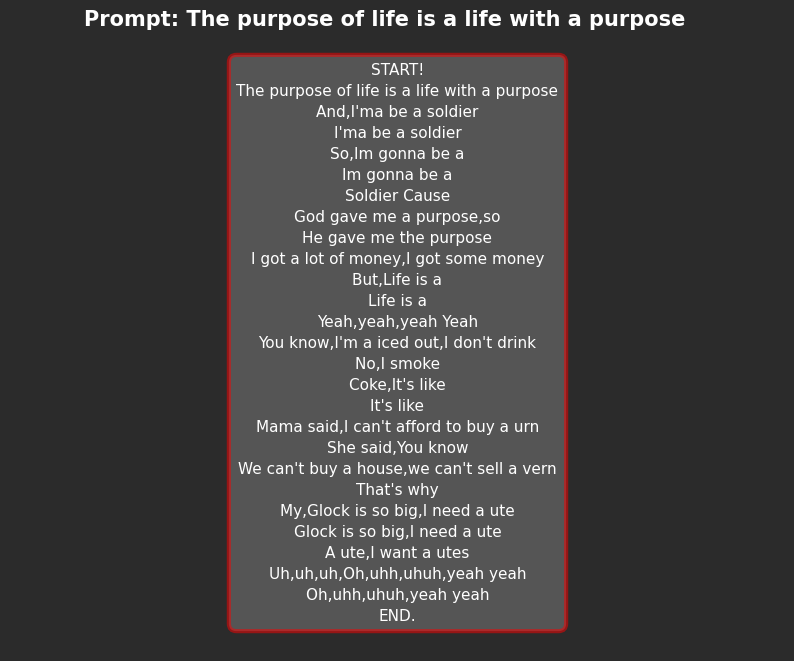

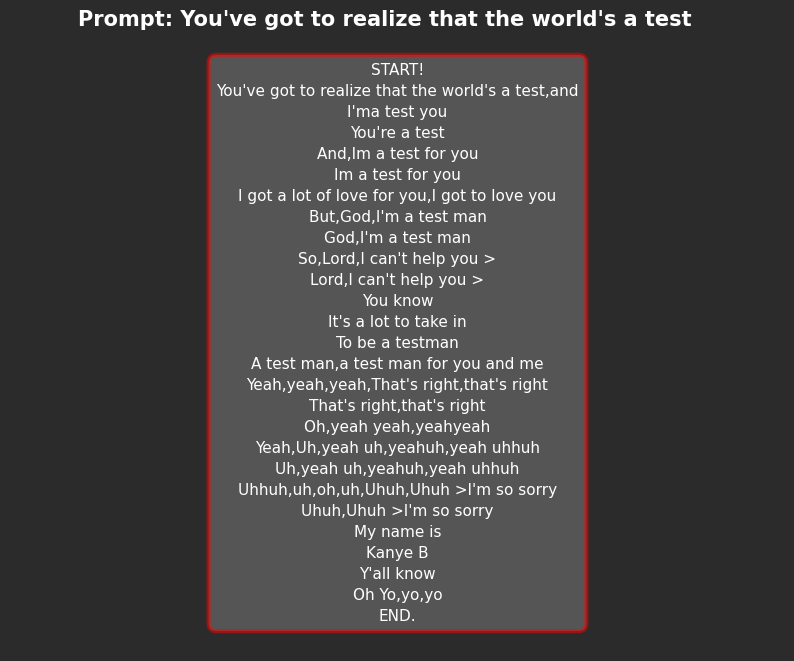

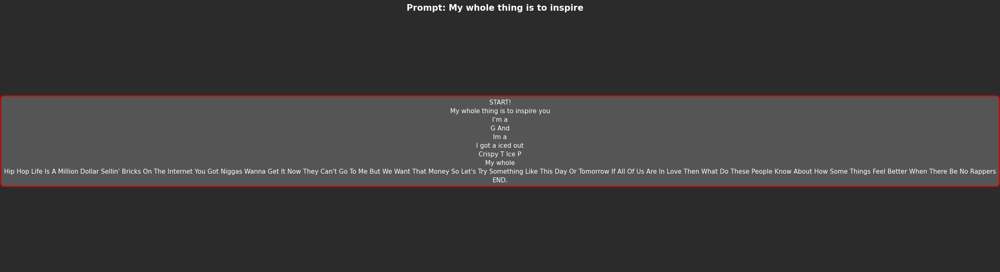

[None, None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]

##### Artist : Kendrick_Lamar

In [ ]:
genre = 'Rap'
artist = 'Kendrick_Lamar'

# Getting the saved trained model weights:
path = f"/content/drive/MyDrive/UNIV.AI/Project AI 3 NLP/Project Landing /Saved Models/Artist Models/{genre}_models/{artist}_weights.h5"
model.load_weights(path)

# GETTING THE PREDICTIONS:
output  = get_predictions(prompts , model , tokenizer )

# Post-Precessing the results.
output = [post_processing(lyric) for lyric in output]


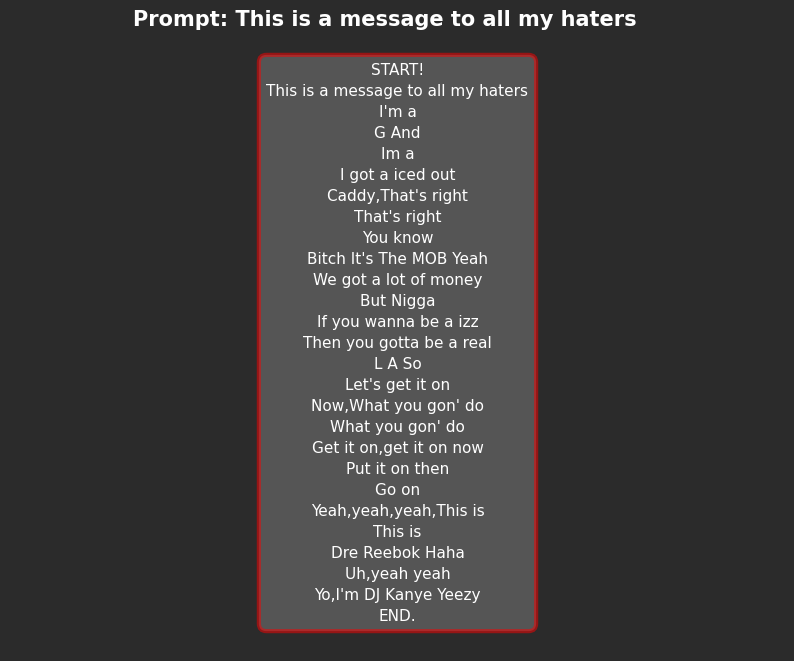

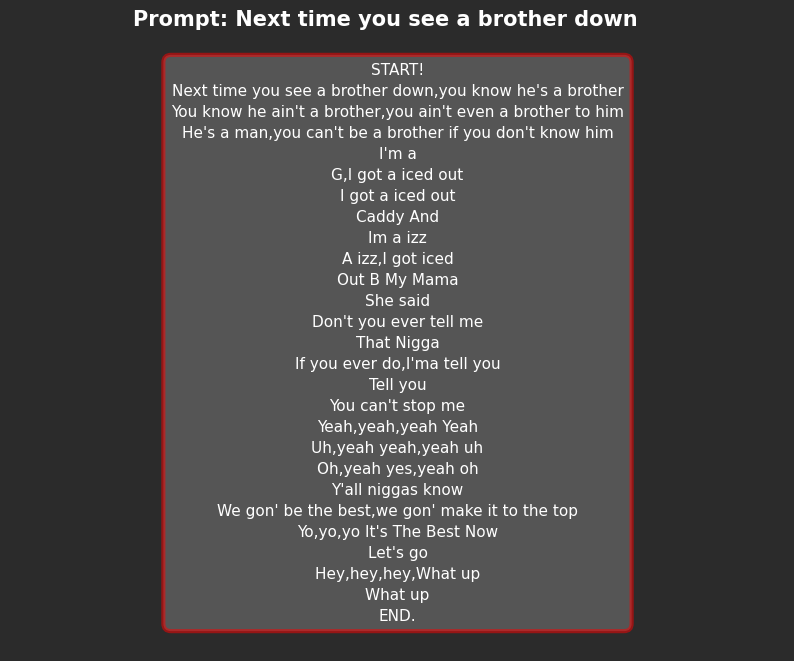

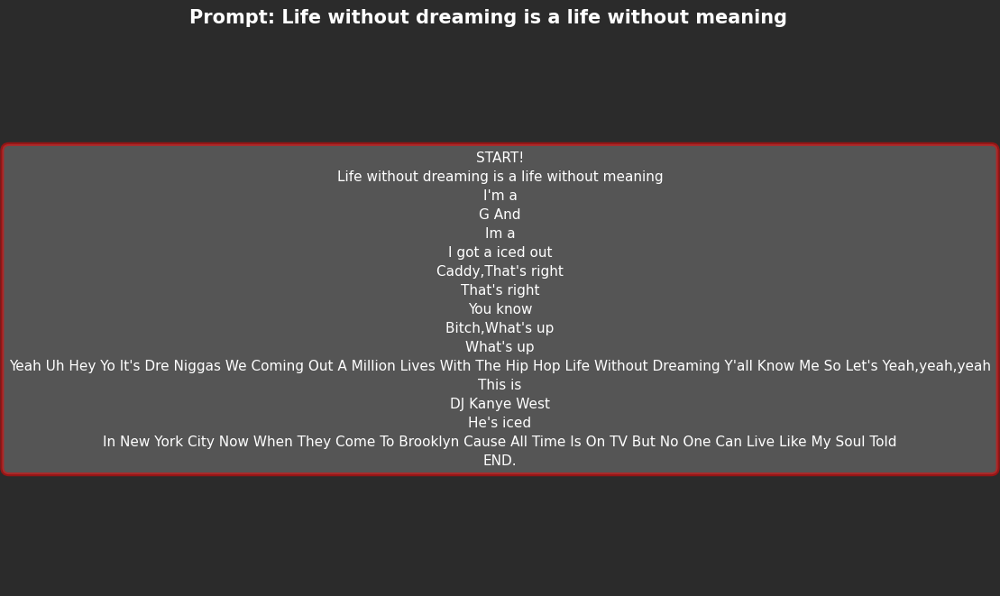

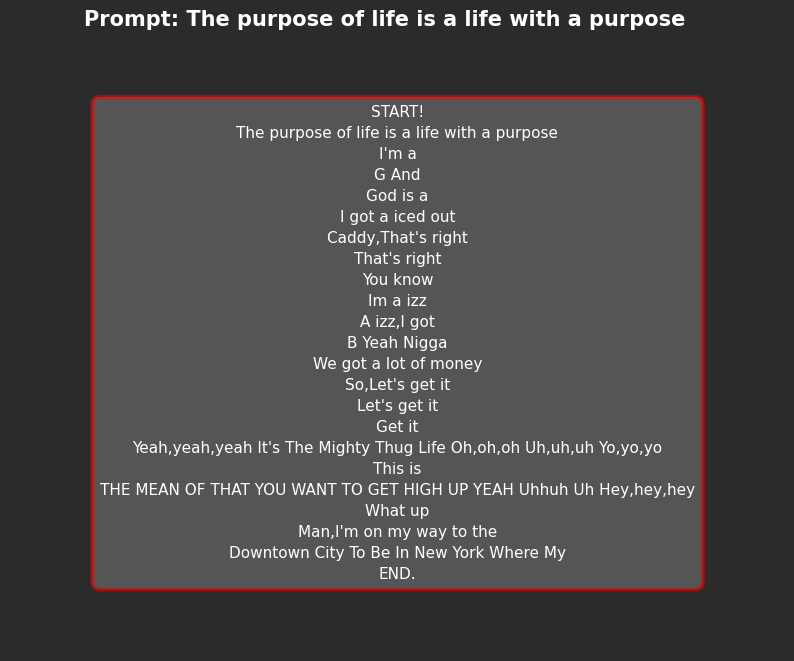

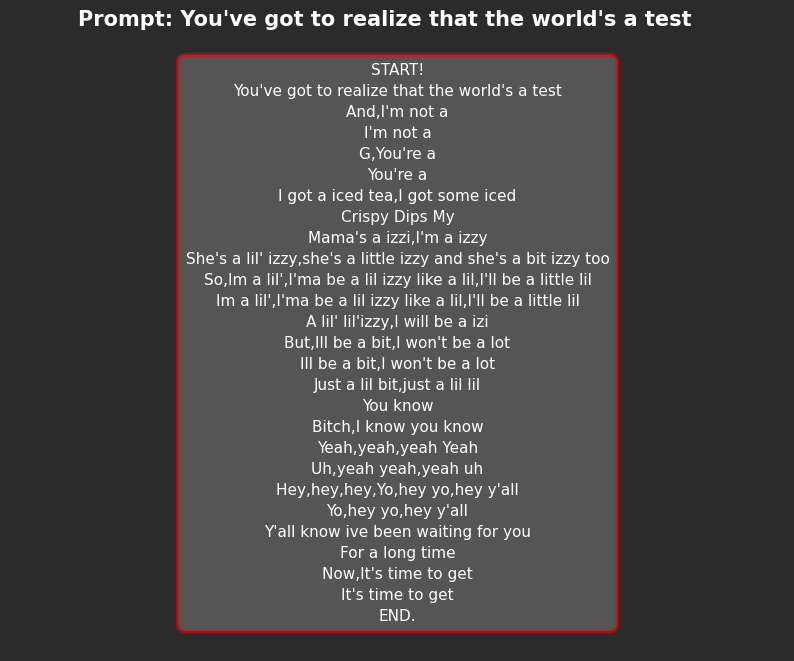

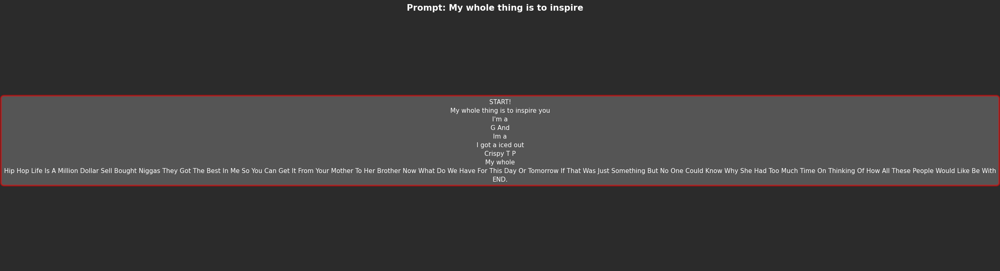

[None, None, None, None, None, None]

In [ ]:
# Displaying the Generated Lyrics:
[displaySong(lyric, prompt) for lyric , prompt in zip(output , prompts)]